<a href="https://colab.research.google.com/github/nilakanta123/Short-Term-Load-Forecasting/blob/main/Parallel_2DCNN_LSTM_GAF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# import & functions

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pprint import pprint
import time
import math

from sklearn import metrics
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler
from keras.utils import to_categorical
from numpy import argmax

from tensorflow.keras import Model, callbacks
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import GRU
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.layers import Add
from tensorflow.keras.layers import RepeatVector
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Attention
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import GlobalAveragePooling1D
from tensorflow.keras.layers import Lambda
from tensorflow.keras.layers import MultiHeadAttention
from tensorflow.keras.layers import LayerNormalization
from tensorflow.keras.layers import Dropout
from tensorflow.keras import layers

!pip install pyts
from pyts.image import GramianAngularField

!pip install ipython-autotime
%load_ext autotime

!pip install keras-tuner --upgrade
import keras_tuner

import gc

from google.colab import drive
drive.mount('/content/drive')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 1.5 MB/s eta 0:00:00
Mounted at /content/drive
time: 32.8 s (started: 2023-12-17 09:52:50 +00:00)


In [ ]:
LOOKBACK=168
LOOKAHEAD=24

def reframe(data, lookback, lookahead):
    x_load, y_load = [],[]
    start = 0
    for _ in range(len(data)):
        feature_end = start + lookback
        label_end = feature_end + lookahead
        if label_end <= len(data):
            # historical load feature
            v = data[start:feature_end,0]
            # v = v.reshape(len(v),1)
            x_load.append(v)
            # load labels
            v = data[feature_end:label_end,0]
            # v = v.reshape(len(v),1)
            y_load.append(v)
        start += lookahead
    x_load = np.asarray(x_load).astype('float32')
    y_load = np.asarray(y_load).astype('float32')
    return x_load, y_load

def evaluate(ori, pre):
    ori, pre = ori.flatten(),pre.flatten()
    mae = metrics.mean_absolute_error(ori, pre)
    mape = metrics.mean_absolute_percentage_error(ori, pre)*100
    r2 = metrics.r2_score(ori, pre)
    print('\nEvaluation metric results:-\n')
    # print(f'MAE is : {mae}')
    print(f'MAPE is : {mape}')
    print(f'R2 is : {r2}')

def pplot(ori,pre,history):
    ori, pre = ori.flatten(),pre.flatten()
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12,3))
    axs[0].plot(ori[:100], label="Actual Load", color='blue', linewidth=1)
    axs[0].plot(pre[:100], label="Predicted Load", color='red', linewidth=1)
    axs[0].set_title("Prediction")
    axs[0].set_ylabel("Load MWt")
    axs[0].set_xlabel("Time")
    axs[1].plot(history.history['loss'], label="Training Loss", color='blue', linewidth=1)
    axs[1].plot(history.history['val_loss'], label="Validation Loss", color='red', linewidth=1)
    axs[1].set_title("Learning Curve")
    axs[1].set_ylabel("Loss")
    axs[1].set_xlabel("Epoch")
    plt.show()

# # Method to check missing entries in the series data.
# dataset['Day'] = dataset.index.date
# check = dataset.groupby("Day").size().values
# s=0
# for i,v in enumerate(check):
#     s=s+v
#     if v!=24:
#         print(dataset.iloc[s-1]["Day"])

# decode a one hot encoded string
def one_hot_decode(encoded_seq):
    return np.array([argmax(vector) for vector in encoded_seq])

time: 2.14 ms (started: 2023-12-17 09:53:41 +00:00)


# 1.MALAYSIA

In [ ]:
path = "/content/drive/MyDrive/DATASETS/malaysia_all_data_for_paper.csv"
dataset = pd.read_csv(path,index_col=['Datetime'],parse_dates=['Datetime'])
dataset.drop(dataset.columns[[0, 1, 2]], axis=1, inplace=True)
# cardinality = dataset.iloc[:].max().values + 1
# n = round((len(dataset)/24)*0.8)*24
train = dataset.iloc[:-2568,:]
test = dataset.iloc[-2568:,:]
train = np.array(train.values)
test = np.array(test.values)

X, Y = reframe(data=train, lookback=LOOKBACK, lookahead=LOOKAHEAD)
Xt, Yt = reframe(data=test, lookback=LOOKBACK, lookahead=LOOKAHEAD)

# Image Conversion GADF
transformer = GramianAngularField(method='difference', overlapping=False, flatten=False)
X_img = transformer.transform(X).reshape(-1,LOOKBACK,LOOKBACK,1)
Xt_img = transformer.transform(Xt).reshape(-1,LOOKBACK,LOOKBACK,1)
print(f"X_img : {X_img.shape}, Xt_img : {Xt_img.shape}")

# Feature Scaling
scaler_load = MinMaxScaler(feature_range=(-1, 1))
Xs = scaler_load.fit_transform(X.reshape(-1,1)).reshape(-1,LOOKBACK,1)
Ys = scaler_load.transform(Y.reshape(-1,1)).reshape(-1,LOOKAHEAD)
Xts = scaler_load.transform(Xt.reshape(-1,1)).reshape(-1,LOOKBACK,1)
print(f"Xs : {Xs.shape}, Ys : {Ys.shape}")
print(f"Xts : {Xts.shape}, Yt : {Yt.shape}")

# Xd = np.insert(Ys, 0, 0, axis=1)
# Xd = np.delete(Xd,-1, axis=1)
# print(f"Xd : {Xd.shape}")

del dataset, train, test, X, Xt, Y
gc.collect()


X_img : (616, 168, 168, 1), Xt_img : (100, 168, 168, 1)
Xs : (616, 168, 1), Ys : (616, 24)
Xts : (100, 168, 1), Yt : (100, 24)


13826

time: 5.25 s (started: 2023-12-17 09:53:50 +00:00)


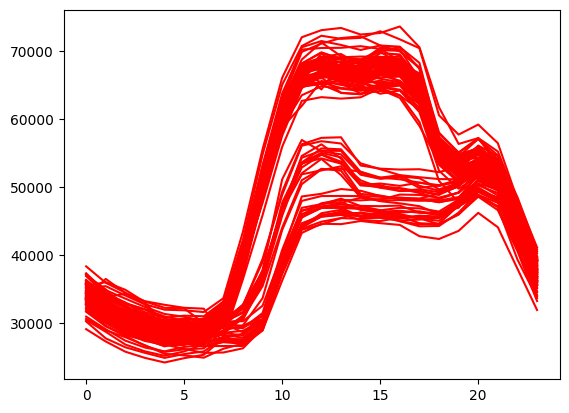

time: 276 ms (started: 2023-12-17 09:54:17 +00:00)


In [ ]:
for i in range(len(Yt)):
    plt.plot(Yt[i], color='r')
plt.show()

(None, 168, 1)  LOAD INPUTS 
(None, 50)  LOAD INPUTS->LSTM
(None, 168, 168, 1)  TEMP INPUTS 
(None, 162, 162, 20)  TEMP INPUTS->CNN
(None, 20)  TEMP INPUTS->CNN->RELU->GPOOL
(None, 70)  CONCATE
(None, 24)  CONCATE->DENSE
Training Time : 00:00:23
4/4 [==============================] - 1s 10ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 32ms/step

Single Day Inference Time 83.8782787322998 ms

Evaluation metric results:-

MAPE is : 10.358186811208725
R2 is : 0.8165849967243827


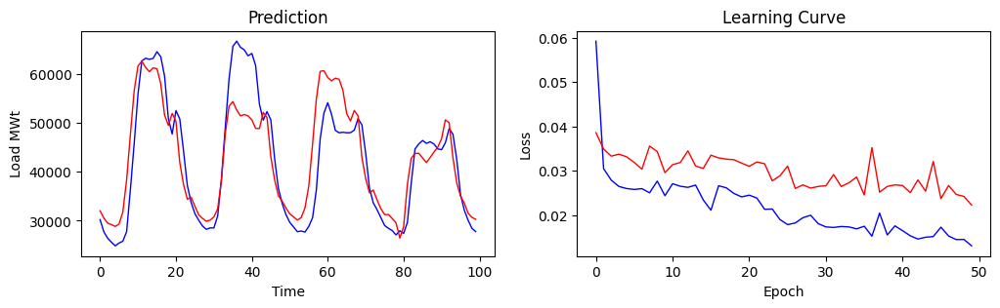



[[32033.7578125], [30541.73046875], [29507.6171875], [29201.26171875], [28830.96875], [29315.037109375], [31771.57421875], [38363.30078125], [47755.0703125], [56668.078125], [61696.23828125], [62658.5078125], [61377.3828125], [60503.90234375], [61300.09765625], [61106.83203125], [58013.56640625], [51611.54296875], [49524.015625], [51969.59765625], [50331.37890625], [41970.03515625], [37410.46875], [34400.0859375], [34823.58203125], [32947.125], [31214.423828125], [30468.37890625], [29894.02734375], [30104.712890625], [30799.060546875], [32451.01171875], [38341.79296875], [47849.3984375], [53458.3515625], [54386.43359375], [52665.59375], [51468.34765625], [51740.7578125], [51468.76171875], [50654.58984375], [48903.57421875], [48877.88671875], [52169.3984375], [51123.109375], [43091.109375], [38403.75], [35127.0859375], [33980.59375], [32589.119140625], [31396.15234375], [30770.830078125], [30122.56640625], [30641.322265625], [32624.498046875], [37081.125], [45628.01953125], [54900.433

In [ ]:
# CNNLSTM+GAF

seq_inputs = layers.Input(shape=(LOOKBACK,1))
img_inputs = layers.Input(shape=(LOOKBACK,LOOKBACK,1))

print(seq_inputs.shape," LOAD INPUTS ")
x1 = layers.LSTM(50, return_sequences=False)(seq_inputs)
print(x1.shape," LOAD INPUTS->LSTM")

print(img_inputs.shape," TEMP INPUTS ")
x2 = layers.Convolution2D(filters=20, kernel_size=7, padding='valid')(img_inputs)
print(x2.shape," TEMP INPUTS->CNN")
# x2 = layers.ReLU()(x2)
# print(x2.shape," TEMP INPUTS->CNN->RELU")
x2 = layers.GlobalAvgPool2D()(x2)
print(x2.shape," TEMP INPUTS->CNN->RELU->GPOOL")

c1 = layers.Concatenate(axis=1)([x1,x2])
print(c1.shape," CONCATE")
outputs = layers.Dense(24, activation='linear')(c1)
print(outputs.shape," CONCATE->DENSE")

model = Model([seq_inputs,img_inputs], outputs)

model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit([Xs,X_img], Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict([Xts,Xt_img])
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict([Xts[:1],Xt_img[:1]])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

In [ ]:
# 2. LSTM tunning

def build_model(hp):
    inputs = layers.Input(shape=(LOOKBACK,1))

    hp_lstm1 = hp.Choice('lstm1', [16,32,50,64,100])
    hp_lstm2 = hp.Choice('lstm2', [16,32,50,64,100])
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    x = layers.LSTM(hp_lstm1, return_sequences=True)(inputs)
    x = layers.LSTM(hp_lstm2, return_sequences=False)(x)
    outputs = layers.Dense(24)(x)

    model = Model(inputs=inputs, outputs=outputs, name="LSTM")
    model.compile(optimizer=Adam(learning_rate=hp_learning_rate),loss=mse, metrics=[mse])
    return model

tuner =keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective='val_mean_squared_error',
    max_trials=30,
    directory='keras_tuner_dir',
    project_name='keras_tuner_exp1',
    overwrite=True
)

tuner.search(Xs, Ys, epochs=20, validation_split=0.2, shuffle=False, batch_size=32, verbose=0)
best_model = tuner.get_best_models()[0]
# best_model.build([Xhs_train,Xds_train,Xs])
# best_model.summary()

param =["lstm1","lstm2","learning_rate"]
for h_param in param:
  print(h_param, tuner.get_best_hyperparameters()[0].get(h_param))

lstm1 100
lstm2 16
learning_rate 0.001
time: 6min 31s (started: 2023-11-03 07:17:08 +00:00)


Training Time : 00:00:25
4/4 [==============================] - 1s 9ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 34ms/step

Single Day Inference Time 85.66427230834961 ms

Evaluation metric results:-

MAPE is : 14.424759149551392
R2 is : 0.6696866192830551


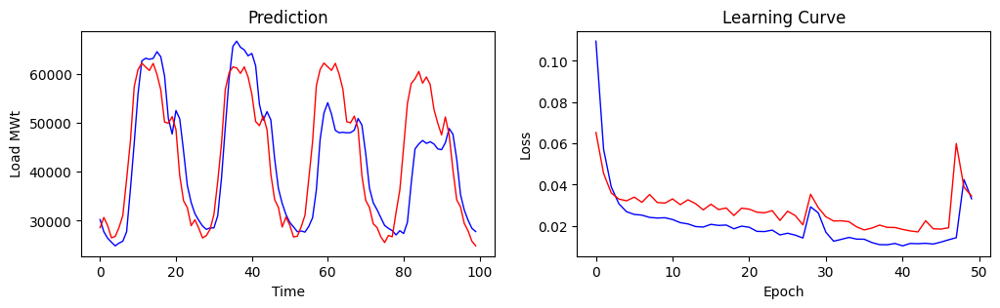



[[28574.154296875], [30666.958984375], [29003.15234375], [26497.951171875], [26784.91015625], [28623.517578125], [31089.380859375], [38491.9296875], [46332.453125], [57462.31640625], [60944.55859375], [62244.5234375], [61470.703125], [60750.1171875], [62208.41015625], [59956.98046875], [56789.37109375], [50193.59375], [49964.29296875], [51311.53125], [48650.96484375], [39198.37890625], [34095.96875], [32655.814453125], [28975.701171875], [30190.619140625], [28482.708984375], [26478.49609375], [26944.931640625], [28261.21484375], [31245.66015625], [37979.47265625], [45798.30078125], [56859.34375], [60275.04296875], [61483.00390625], [61285.6953125], [60162.92578125], [61490.71484375], [59450.375], [55909.91796875], [50312.8125], [49463.65234375], [51432.25390625], [48645.84375], [39588.0546875], [34335.41015625], [32731.5703125], [28708.193359375], [30745.802734375], [29094.779296875], [26654.88671875], [26831.517578125], [28733.69140625], [31116.791015625], [38536.3125], [46150.76171

In [ ]:
# 2. LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.LSTM(100, return_sequences=True)(inputs)
x = layers.LSTM(16, return_sequences=False)(x)
outputs = layers.Dense(24)(x)
model = Model(inputs=inputs, outputs = outputs, name="LSTM")
model.compile(optimizer=Adam(learning_rate=0.001),loss='mse')
# model.summary()

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

In [ ]:
# 3. GRU tunning

def build_model(hp):
    inputs = layers.Input(shape=(LOOKBACK,1))

    hp_gru1 = hp.Choice('gru1', [16,32,50,64,100])
    hp_gru2 = hp.Choice('gru2', [16,32,50,64,100])
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    x = layers.GRU(hp_gru1, return_sequences=True)(inputs)
    x = layers.GRU(hp_gru2, return_sequences=False)(x)
    outputs = layers.Dense(24)(x)

    model = Model(inputs=inputs, outputs=outputs, name="GRU")
    model.compile(optimizer=Adam(learning_rate=hp_learning_rate), loss=mse, metrics=[mse])
    return model

tuner =keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective='val_mean_squared_error',
    max_trials=30,
    directory='keras_tuner_dir',
    project_name='keras_tuner_exp1',
    overwrite=True
)

tuner.search(Xs_load, Ys, epochs=20, validation_split=0.2, shuffle=False, batch_size=32, verbose=0)
best_model = tuner.get_best_models()[0]
# best_model.build([Xhs_train,Xds_train,Xs])
# best_model.summary()

param =["gru1","gru2","learning_rate"]
for h_param in param:
  print(h_param, tuner.get_best_hyperparameters()[0].get(h_param))


gru1 100
gru2 16
learning_rate 0.001
time: 7min 2s (started: 2023-11-03 07:29:43 +00:00)


Training Time : 00:00:23
4/4 [==============================] - 1s 9ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 36ms/step

Single Day Inference Time 90.06905555725098 ms

Evaluation metric results:-

MAPE is : 12.666656076908112
R2 is : 0.7470464717873402


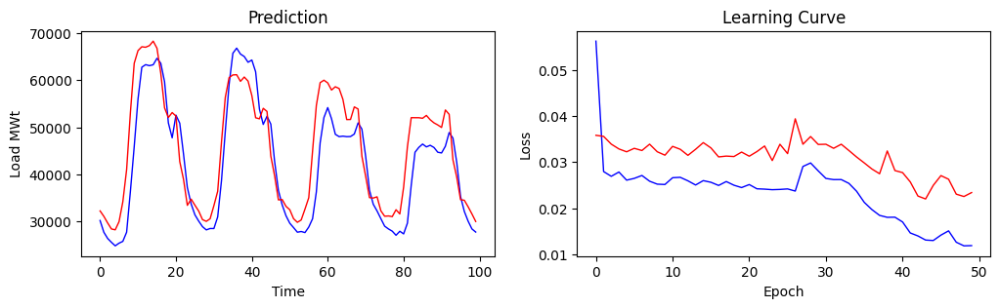



[[32269.271484375], [31106.013671875], [29706.587890625], [28431.658203125], [28253.24609375], [29972.83984375], [34194.89453125], [41023.953125], [53166.10546875], [63556.11328125], [66241.140625], [67055.4765625], [66949.6171875], [67293.6328125], [68241.9453125], [66741.78125], [61440.265625], [54088.375], [52065.92578125], [53102.97265625], [52360.76171875], [42716.0546875], [38923.25], [33440.09765625], [34763.4765625], [33469.71484375], [32218.0234375], [30412.830078125], [30048.818359375], [30595.708984375], [33384.34375], [36432.21484375], [46857.20703125], [56300.03515625], [60504.12109375], [61080.484375], [61128.01953125], [59724.13671875], [60638.30078125], [59784.3984375], [56712.19921875], [52001.6328125], [51782.0703125], [54007.16015625], [53342.76953125], [43887.125], [39700.734375], [34599.74609375], [34667.81640625], [33231.8671875], [32505.0234375], [30606.611328125], [29844.58203125], [30336.482421875], [32636.65234375], [35061.2890625], [44933.5], [54617.9296875

In [ ]:
# 3. GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.GRU(50, return_sequences=True)(inputs)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="GRU")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

In [ ]:
# 4. CNN-LSTM tunning

def build_model(hp):
    # Choose an optimal value between 32-512
    hp_filters = hp.Choice('filters', [12,24,36])
    hp_kernel = hp.Choice('kernel', [2,3,5,7,9,11,13,15,17,19])
    hp_pool_size = hp.Choice('pool_size', [2,3,5,7])
    hp_lstm = hp.Choice('lstm', [16,32,50,64,100,150])
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    inputs = layers.Input(shape=(LOOKBACK,1))
    x = layers.Conv1D(hp_filters, kernel_size=hp_kernel, padding="valid")(inputs)
    x = layers.ReLU()(x)
    x = layers.MaxPool1D(hp_pool_size)(x)
    x = layers.LSTM(hp_lstm, return_sequences=False)(x)
    outputs = layers.Dense(24)(x)

    model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
    model.compile(optimizer=Adam(learning_rate=hp_learning_rate), loss=mse, metrics=[mse])
    return model

tuner =keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective='val_mean_squared_error',
    max_trials=30,
    directory='keras_tuner_dir',
    project_name='keras_tuner_exp1',
    overwrite=True
)

tuner.search(Xs, Ys, epochs=20, validation_split=0.2, shuffle=False, batch_size=32, verbose=0)
best_model = tuner.get_best_models()[0]
# best_model.build([Xhs_train,Xds_train,Xs])
# best_model.summary()

param =["filters","kernel","pool_size","lstm","learning_rate"]
for h_param in param:
  print(h_param, tuner.get_best_hyperparameters()[0].get(h_param))

filters 36
kernel 15
pool_size 7
lstm 64
learning_rate 0.01
time: 4min 41s (started: 2023-11-03 07:48:27 +00:00)


Training Time : 00:00:12
4/4 [==============================] - 1s 7ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 99ms/step

Single Day Inference Time 211.13991737365723 ms

Evaluation metric results:-

MAPE is : 11.966729164123535
R2 is : 0.7443997196613126


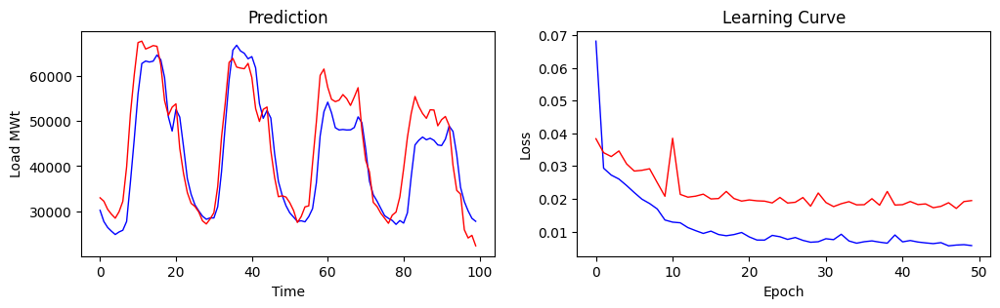



[[32990.0390625], [32231.208984375], [30431.044921875], [29347.3828125], [28472.16015625], [29891.322265625], [32197.44921875], [39832.1328125], [51564.33203125], [60144.1484375], [67351.984375], [67664.7578125], [65927.0625], [66275.3828125], [66684.7265625], [66522.546875], [62421.125], [54528.82421875], [51233.3046875], [53060.66015625], [53787.53515625], [43946.9609375], [38339.34375], [34141.89453125], [31757.89453125], [31066.619140625], [29864.240234375], [27884.326171875], [27190.916015625], [28304.775390625], [29679.978515625], [35458.25390625], [46358.63671875], [54080.796875], [62945.22265625], [63848.96875], [61925.2421875], [61701.98046875], [61558.0625], [62746.2109375], [59620.921875], [52731.921875], [49885.57421875], [52561.4296875], [53090.078125], [43449.98046875], [37474.0078125], [33234.62109375], [33429.9296875], [33154.64453125], [31894.025390625], [30171.271484375], [27524.2109375], [28811.1640625], [30978.986328125], [31201.166015625], [40707.6484375], [49743

In [ ]:
# 4. CNN-LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=5, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

In [ ]:
# 1. MLP Tunning

def build_model(hp):
    inputs = layers.Input(shape=(LOOKBACK,1))
    # Choose an optimal value between 32-512
    hp_units1 = hp.Choice('units1', [12,24,36,48,50,64,96,100,128])
    hp_units2 = hp.Choice('units2', [12,24,36,48,50,64,96,100,128])
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    x = layers.Flatten()(inputs)
    x = layers.Dense(hp_units1, activation="relu")(x)
    x = layers.Dense(hp_units2, activation="relu")(x)
    outputs = layers.Dense(24)(x)

    model = Model(inputs=inputs, outputs=outputs, name="MLP")
    model.compile(optimizer=Adam(learning_rate=hp_learning_rate),loss=mse, metrics=[mse])
    return model

tuner =keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective='val_mean_squared_error',
    max_trials=30,
    directory='keras_tuner_dir',
    project_name='keras_tuner_exp1',
    overwrite=True
)

tuner.search(Xs_load, Ys, epochs=20, validation_split=0.2, shuffle=False, batch_size=32, verbose=0)
best_model = tuner.get_best_models()[0]
# best_model.build([Xhs_train,Xds_train,Xs])
# best_model.summary()

param =["units1","units2","learning_rate"]
for h_param in param:
  print(h_param, tuner.get_best_hyperparameters()[0].get(h_param))

units1 100
units2 48
learning_rate 0.01
time: 3min 21s (started: 2023-11-03 07:57:40 +00:00)


Training Time : 00:00:09
4/4 [==============================] - 0s 4ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 28ms/step

Single Day Inference Time 80.20138740539551 ms

Evaluation metric results:-

MAPE is : 13.035492599010468
R2 is : 0.7172255937875096


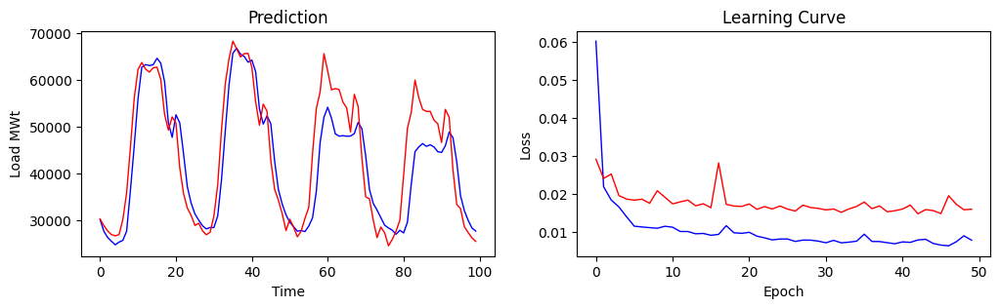



[[30358.24609375], [28934.525390625], [27800.841796875], [27026.6953125], [26756.927734375], [27026.095703125], [30200.044921875], [35933.35546875], [45589.2890625], [56062.30078125], [62211.89453125], [63713.41796875], [62298.6875], [61656.57421875], [62569.72265625], [62713.0], [60056.81640625], [52657.2890625], [49303.28515625], [52109.63671875], [50772.25], [41288.5625], [35750.796875], [32695.599609375], [31103.208984375], [28984.314453125], [29442.533203125], [27837.048828125], [26995.642578125], [27523.455078125], [30996.349609375], [37589.71875], [49251.77734375], [59192.8984375], [64571.31640625], [68254.3125], [66606.03125], [64887.1171875], [65589.375], [65636.3515625], [62690.69140625], [55327.46484375], [50332.1953125], [54834.84375], [53342.23828125], [42847.63671875], [36674.046875], [34383.73828125], [31487.669921875], [27877.939453125], [30301.6484375], [28620.841796875], [26544.234375], [27784.900390625], [30496.392578125], [32794.69921875], [44342.234375], [53911.3

In [ ]:
# 1. MLP
inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Flatten()(inputs)
x = layers.Dense(100, activation="relu")(x)
x = layers.Dense(48, activation="relu")(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="MLP")
model.compile(optimizer=Adam(learning_rate=0.01),loss=mse, metrics=[mse])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

In [ ]:
# 5. CNN-GRU tunning

def build_model(hp):
    # Choose an optimal value between 32-512
    hp_filters = hp.Choice('filters', [12,24,36])
    hp_kernel = hp.Choice('kernel', [2,3,5,7,9,11,13,15,17,19])
    hp_pool_size = hp.Choice('pool_size', [2,3,5,7])
    hp_gru = hp.Choice('gru', [16,32,50,64,100,150])
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    inputs = layers.Input(shape=(LOOKBACK,1))
    x = layers.Conv1D(hp_filters, kernel_size=hp_kernel, padding="valid")(inputs)
    x = layers.ReLU()(x)
    x = layers.MaxPool1D(hp_pool_size)(x)
    x = layers.GRU(hp_gru, return_sequences=False)(x)
    outputs = layers.Dense(24)(x)

    model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
    model.compile(optimizer=Adam(learning_rate=hp_learning_rate), loss=mse, metrics=[mse])
    return model

tuner =keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective='val_mean_squared_error',
    max_trials=30,
    directory='keras_tuner_dir',
    project_name='keras_tuner_exp1',
    overwrite=True
)

tuner.search(Xs_load, Ys, epochs=20, validation_split=0.2, shuffle=False, batch_size=32, verbose=0)
best_model = tuner.get_best_models()[0]
# best_model.build([Xhs_train,Xds_train,Xs])
# best_model.summary()

param =["filters","kernel","pool_size","gru","learning_rate"]
for h_param in param:
  print(h_param, tuner.get_best_hyperparameters()[0].get(h_param))

filters 12
kernel 13
pool_size 5
gru 150
learning_rate 0.01
time: 18min 25s (started: 2023-11-03 08:04:57 +00:00)


Training Time : 00:00:23
4/4 [==============================] - 1s 24ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 83ms/step

Single Day Inference Time 159.41810607910156 ms

Evaluation metric results:-

MAPE is : 11.609194427728653
R2 is : 0.7418063619893254


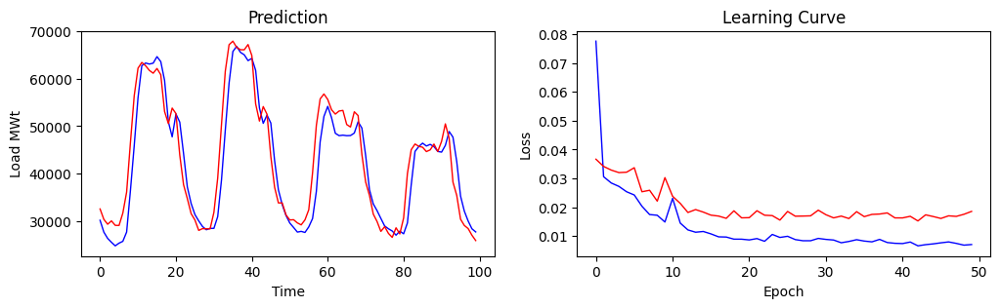



[[32608.794921875], [30416.083984375], [29400.498046875], [30098.640625], [29163.248046875], [29141.236328125], [31738.994140625], [36156.3125], [46560.3515625], [56384.3125], [62176.34375], [63383.43359375], [62689.19140625], [61711.5546875], [61122.9453125], [62119.6015625], [60805.0234375], [53080.23828125], [50537.24609375], [53799.2734375], [52645.8359375], [43965.94140625], [37710.30078125], [34774.16796875], [31619.57421875], [30287.1171875], [28099.080078125], [28473.36328125], [28439.650390625], [28430.0546875], [31893.138671875], [39094.0703125], [50351.27734375], [61534.625], [67114.3828125], [67857.8203125], [66548.375], [66058.5390625], [66042.484375], [67147.3359375], [64820.01171875], [54692.9453125], [51066.66796875], [54117.06640625], [52497.9296875], [43637.34375], [37157.4765625], [33872.015625], [33877.04296875], [31356.34375], [30292.166015625], [30348.162109375], [29675.669921875], [29264.728515625], [30315.02734375], [32435.0078125], [40198.4375], [50161.851562

In [ ]:
# 5. CNN-GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(12, kernel_size=13, padding="valid")(inputs)
x = layers.ReLU()(x)
x = layers.MaxPool1D(5)(x)
x = layers.GRU(150, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

h : (None, 100), c : (None, 100)
x : (None, None, 100)
d_outputs  : (None, None, 1)
hi : (None, 100), ci : (None, 100)
x : (None, None, 100), h : (None, 100), c : (None, 100)
d_outputs  : (None, None, 1)
Training Time : 00:00:28

Total Inference Time : 00:05:34

Single Day Inference Time 2826.463222503662 ms

Evaluation metric results:-

MAPE is : 14.15739506483078
R2 is : 0.6077206557293162


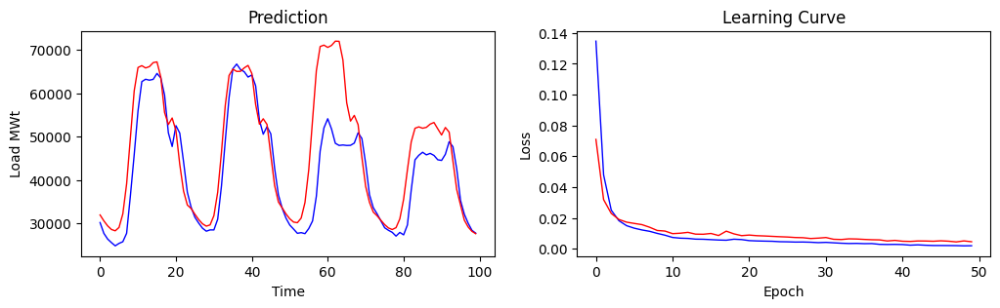



[[31983.48828125, 30612.705078125, 29457.423828125, 28628.560546875, 28319.13671875, 29097.9375, 32224.04296875, 39158.74609375, 49870.85546875, 60603.03125, 65976.0234375, 66393.96875, 65865.1953125, 66176.28125, 67093.2734375, 67265.453125, 63779.1640625, 55598.87890625, 52831.26171875, 54328.1953125, 51422.51953125, 43664.40625, 37484.2578125, 34267.9453125], [33460.6171875, 32129.5703125, 30903.185546875, 29935.78515625, 29398.1015625, 29689.38671875, 31818.09765625, 37215.62890625, 46496.48828125, 57244.0234375, 64146.5703125, 65585.5625, 65069.53125, 65087.6640625, 65887.484375, 66453.609375, 64592.94921875, 57451.66796875, 52900.80859375, 54148.2265625, 52839.71875, 45730.88671875, 38775.4375, 34966.875], [33602.15625, 32215.1328125, 31079.08984375, 30335.2265625, 30191.77734375, 31259.78125, 34844.55859375, 42417.59765625, 53871.7890625, 65227.69921875, 70803.9453125, 71129.578125, 70601.3125, 71056.7421875, 72043.984375, 72003.2421875, 67713.8046875, 57828.89453125, 53618.72

In [ ]:
# 6. ED-LSTM

n_units = 100

e_inputs = Input(shape=(None, 1))
d_inputs = Input(shape=(None, 1))

e_lstm = LSTM(n_units, return_state=True)
d_lstm = LSTM(n_units, return_sequences=True, return_state=True)
d_dense = Dense(1, activation='linear')

_, h, c = e_lstm(e_inputs)
e_states = [h, c]
print(f"h : {h.shape}, c : {c.shape}")
x, _, _ = d_lstm(d_inputs, initial_state=e_states)
print(f"x : {x.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")
model = Model([e_inputs, d_inputs], d_outputs)
model.compile(optimizer='adam', loss='mse')
# model.summary()

# for inference
e_model = Model(e_inputs, e_states)
# for initial decoder_state_inputs
hi = Input(shape=(n_units,))
ci = Input(shape=(n_units,))
d_states_i = [hi, ci]
print(f"hi : {hi.shape}, ci : {ci.shape}")
x, h, c = d_lstm(d_inputs, initial_state=d_states_i)
d_states = [h, c]
print(f"x : {x.shape}, h : {h.shape}, c : {c.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")

d_model = Model([d_inputs] + d_states_i, [d_outputs] + d_states)

def forecast(input_seq, encoder, decoder):
    state = encoder.predict(input_seq, verbose=0)
    # Generate empty target sequence of length 101 ie [[[0,0,0,0,.....,0]]].
    target_seq = np.zeros((1, 1, 1))
    output = []
    for t in range(24):
        yhat, h, c = decoder.predict([target_seq] + state, verbose=0)
        output.append(yhat[0,0,:]) # yhat : [[[a,b,c,d,...]]] -> yhat[0,0,:] : [a,b,c,d,...]
        state = [h, c]
        target_seq = yhat
    return np.array(output)

start_time = time.time()
history = model.fit([Xs, Xd], Ys, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Y_pred = []
for x in Xts:
    x = np.expand_dims(x, axis=0) # Inputs : (168, 1) -> Expand : (1, 168, 1)
    target = forecast(x, e_model, d_model)  # Output (24, 101)
#     target = one_hot_decode(target)
    target = scaler_load.inverse_transform(target.reshape(-1,1))
    target = target.squeeze(1)
    Y_pred.append(target)
Y_pred = np.array(Y_pred)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = forecast(np.expand_dims(Xts[0],axis=0), e_model, d_model)
print(f"\nSingle Day Inference Time {(time.time() - start_time)*1000} ms")

evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

# 2.AEP

In [ ]:
path = "/content/drive/MyDrive/DATASETS/AmericanElectricPowerHourly.csv"
dataset = pd.read_csv(path,index_col=['Datetime'],parse_dates=['Datetime'])
# n = round((len(dataset)/24)*0.8)*24
train = dataset.iloc[:-2568,:]
test = dataset.iloc[-2568:,:]
train = np.array(train.values)
test = np.array(test.values)

X, Y = reframe(data=train, lookback=LOOKBACK, lookahead=LOOKAHEAD)
Xt, Yt = reframe(data=test, lookback=LOOKBACK, lookahead=LOOKAHEAD)

# Image Conversion GADF
transformer = GramianAngularField(method='difference', overlapping=False, flatten=False)
X_img = transformer.transform(X).reshape(-1,LOOKBACK,LOOKBACK,1)
Xt_img = transformer.transform(Xt).reshape(-1,LOOKBACK,LOOKBACK,1)
print(f"X_img : {X_img.shape}, Xt_img : {Xt_img.shape}")

# Feature Scaling
scaler_load = MinMaxScaler(feature_range=(-1, 1))
Xs = scaler_load.fit_transform(X.reshape(-1,1)).reshape(-1,LOOKBACK,1)
Ys = scaler_load.transform(Y.reshape(-1,1)).reshape(-1,LOOKAHEAD)
Xts = scaler_load.transform(Xt.reshape(-1,1)).reshape(-1,LOOKBACK,1)
print(f"Xs : {Xs.shape}, Ys : {Ys.shape}")
print(f"Xts : {Xts.shape}, Yt : {Yt.shape}")

# Xd = np.insert(Ys, 0, 0, axis=1)
# Xd = np.delete(Xd,-1, axis=1)
# print(f"Xd : {Xd.shape}")

del dataset, train, test, X, Xt
gc.collect()



X_img : (4940, 168, 168, 1), Xt_img : (100, 168, 168, 1)
Xs : (4940, 168, 1), Ys : (4940, 24)
Xts : (100, 168, 1), Yt : (100, 24)


10202

time: 12.2 s (started: 2023-12-17 10:02:21 +00:00)


In [ ]:
print(Yt.tolist())
print("\n")

[[11979.0, 11585.0, 11425.0, 11462.0, 11664.0, 12438.0, 13677.0, 14195.0, 14346.0, 14269.0, 14311.0, 14239.0, 14044.0, 14040.0, 13892.0, 13814.0, 13688.0, 13556.0, 13459.0, 13508.0, 13888.0, 13956.0, 13142.0, 12390.0], [11939.0, 11639.0, 11608.0, 11653.0, 11890.0, 12712.0, 13843.0, 14375.0, 14294.0, 14154.0, 13972.0, 13804.0, 13706.0, 13709.0, 13588.0, 13329.0, 13271.0, 13206.0, 13188.0, 13319.0, 13658.0, 13637.0, 12903.0, 12019.0], [11587.0, 11361.0, 11264.0, 11259.0, 11572.0, 12378.0, 13510.0, 13977.0, 14132.0, 14068.0, 14116.0, 13994.0, 13961.0, 13822.0, 13671.0, 13413.0, 13300.0, 13161.0, 12934.0, 12817.0, 13194.0, 13062.0, 12564.0, 11850.0], [11374.0, 11004.0, 10905.0, 10963.0, 11126.0, 11459.0, 11910.0, 12377.0, 12803.0, 13013.0, 13035.0, 12866.0, 12818.0, 12754.0, 12587.0, 12178.0, 12547.0, 12589.0, 12582.0, 12549.0, 12826.0, 13032.0, 12555.0, 12099.0], [11673.0, 11552.0, 11395.0, 11505.0, 11427.0, 11801.0, 12136.0, 12513.0, 12821.0, 12823.0, 12568.0, 12385.0, 12327.0, 12149.0, 

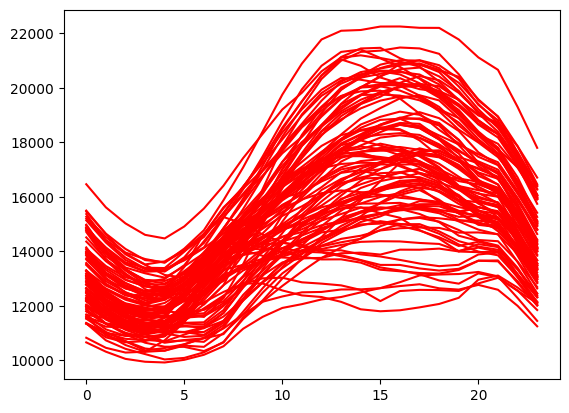

time: 434 ms (started: 2023-12-17 10:02:52 +00:00)


In [ ]:
for i in range(len(Yt)):
    plt.plot(Yt[i], color='r')
plt.show()

Training Time : 00:02:25
4/4 [==============================] - 1s 10ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 29ms/step

Single Day Inference Time 84.84983444213867 ms

Evaluation metric results:-

MAPE is : 3.3443745225667953
R2 is : 0.9252860408413458


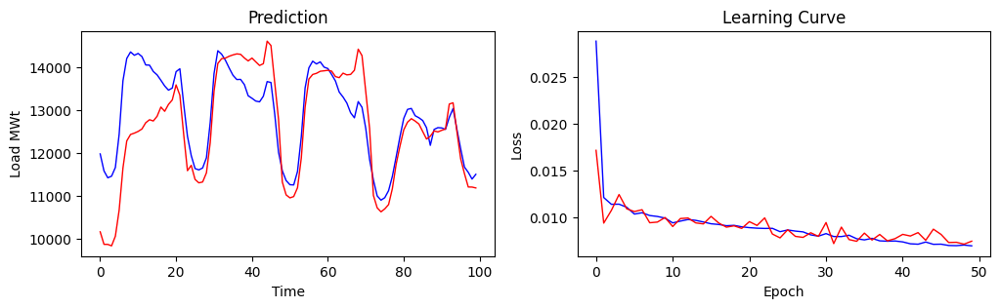



[[10170.6533203125], [9880.0576171875], [9878.263671875], [9845.03515625], [10068.8525390625], [10675.705078125], [11653.1328125], [12280.0322265625], [12430.5947265625], [12461.4853515625], [12501.1943359375], [12557.5078125], [12702.7138671875], [12772.4599609375], [12743.828125], [12853.07421875], [13067.4033203125], [12968.1806640625], [13129.2158203125], [13231.6376953125], [13581.291015625], [13340.818359375], [12435.798828125], [11589.9521484375], [11713.4970703125], [11387.6298828125], [11307.65625], [11327.515625], [11540.0947265625], [12243.2236328125], [13430.265625], [14078.1953125], [14190.044921875], [14203.4091796875], [14246.83984375], [14277.8173828125], [14300.998046875], [14291.0029296875], [14206.54296875], [14137.416015625], [14203.7998046875], [14116.810546875], [14032.2197265625], [14073.578125], [14596.6533203125], [14495.96484375], [13632.1669921875], [12782.7919921875], [11326.478515625], [11028.1474609375], [10958.525390625], [10989.1865234375], [11193.3681

In [ ]:
# CNNLSTM+GAF

seq_inputs = layers.Input(shape=(LOOKBACK,1))
img_inputs = layers.Input(shape=(LOOKBACK,LOOKBACK,1))

x1 = layers.LSTM(50, return_sequences=False)(seq_inputs)
x2 = layers.Convolution2D(filters=20, kernel_size=7, padding='valid')(img_inputs)
x2 = layers.GlobalAvgPool2D()(x2)
c1 = layers.Concatenate(axis=1)([x1,x2])
outputs = layers.Dense(24, activation='linear')(c1)

model = Model([seq_inputs,img_inputs], outputs)
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit([Xs,X_img], Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict([Xts,Xt_img])
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict([Xts[:1],Xt_img[:1]])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:39
4/4 [==============================] - 0s 4ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 54ms/step

Single Day Inference Time 145.64251899719238 ms

Evaluation metric results:-

MAPE is : 4.192708805203438
R2 is : 0.9078752966238354


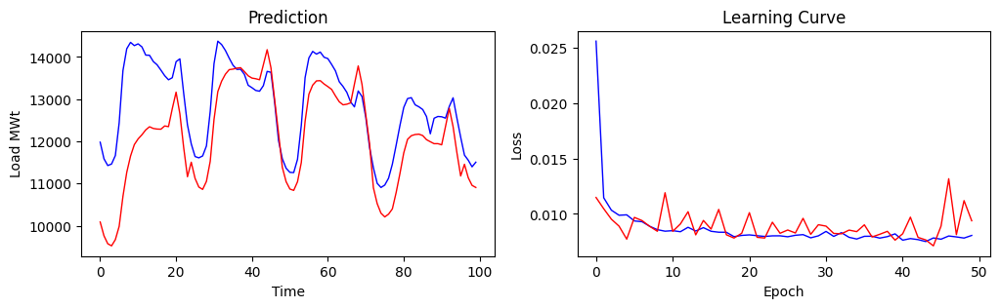



[[10086.29296875], [9758.990234375], [9570.6552734375], [9521.373046875], [9669.3857421875], [9983.47265625], [10695.580078125], [11263.5078125], [11650.779296875], [11922.2626953125], [12057.5263671875], [12155.5341796875], [12270.275390625], [12344.876953125], [12304.9296875], [12290.55859375], [12287.169921875], [12364.1435546875], [12347.8583984375], [12774.41015625], [13165.3232421875], [12652.857421875], [11854.12890625], [11160.228515625], [11504.5703125], [11121.5283203125], [10915.2763671875], [10859.75390625], [11050.0166015625], [11526.5068359375], [12519.9560546875], [13179.1640625], [13425.8505859375], [13592.05078125], [13699.556640625], [13711.9228515625], [13734.7177734375], [13746.3173828125], [13653.9677734375], [13553.193359375], [13499.38671875], [13483.65234375], [13460.029296875], [13814.4560546875], [14172.455078125], [13744.4970703125], [12966.17578125], [12190.3017578125], [11383.2490234375], [11042.169921875], [10868.0361328125], [10836.087890625], [11040.44

In [ ]:
# 1. MLP
inputs = Input(shape=(LOOKBACK,1))
x = Flatten()(inputs)
x = Dense(100, activation="relu")(x)
x = Dense(48, activation="relu")(x)
outputs = Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="MLP")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:02:28
4/4 [==============================] - 2s 16ms/step

Total Inference Time : 00:00:02
1/1 [==============================] - 0s 82ms/step

Single Day Inference Time 173.86460304260254 ms

Evaluation metric results:-

MAPE is : 3.725074604153633
R2 is : 0.9151070144614472


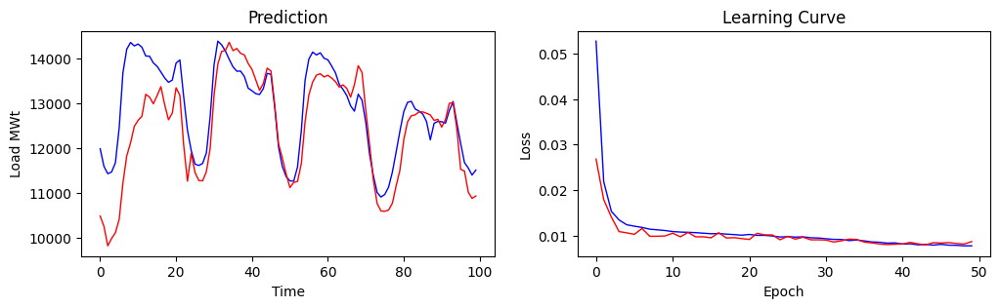



[[10482.3642578125], [10248.9990234375], [9818.7080078125], [9982.240234375], [10108.513671875], [10405.169921875], [11223.763671875], [11822.177734375], [12112.001953125], [12480.4794921875], [12613.9658203125], [12703.298828125], [13192.2783203125], [13130.669921875], [12980.5478515625], [13163.0029296875], [13362.5673828125], [12959.30078125], [12624.7216796875], [12773.466796875], [13336.6943359375], [13169.431640625], [12061.8056640625], [11259.40234375], [11876.6171875], [11449.0947265625], [11272.142578125], [11265.537109375], [11473.818359375], [12003.7890625], [13168.8134765625], [13862.587890625], [14146.3974609375], [14168.923828125], [14348.005859375], [14163.4658203125], [14211.3623046875], [14104.6728515625], [14068.4599609375], [13877.1513671875], [13747.291015625], [13513.6103515625], [13279.2734375], [13434.1123046875], [13774.1650390625], [13712.0224609375], [12954.6533203125], [12088.33203125], [11772.5810546875], [11417.962890625], [11115.591796875], [11229.253906

In [ ]:
# 2. LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.LSTM(50, return_sequences=True)(inputs)
x = layers.LSTM(24, return_sequences=False)(x)
outputs = layers.Dense(24)(x)
model = Model(inputs=inputs, outputs = outputs, name="LSTM")
model.compile(optimizer=Adam(learning_rate=0.001),loss='mse')
# model.summary()

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:02:26
4/4 [==============================] - 2s 11ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 68ms/step

Single Day Inference Time 167.60635375976562 ms

Evaluation metric results:-

MAPE is : 3.9981160312891006
R2 is : 0.8996790172314704


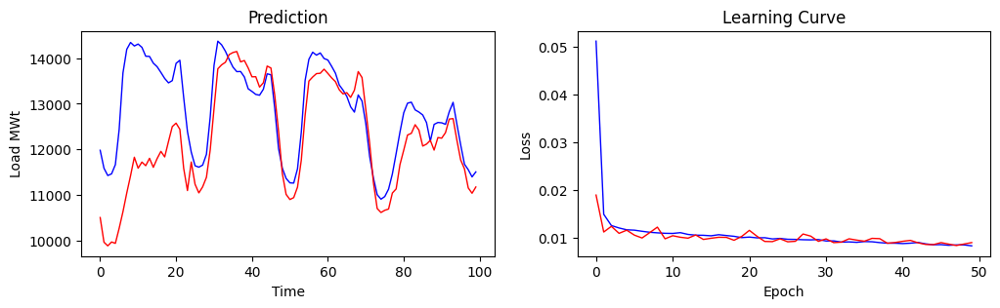



[[10502.0654296875], [9960.6044921875], [9880.8388671875], [9965.2841796875], [9935.5419921875], [10266.966796875], [10630.5888671875], [11040.033203125], [11420.2861328125], [11826.40234375], [11585.6552734375], [11719.6689453125], [11640.2138671875], [11802.5224609375], [11604.4169921875], [11795.7158203125], [11955.0888671875], [11833.1201171875], [12171.6220703125], [12499.09375], [12574.783203125], [12438.4921875], [11584.9619140625], [11094.7548828125], [11721.4970703125], [11232.9375], [11043.1767578125], [11176.0263671875], [11385.4873046875], [11990.9150390625], [12893.42578125], [13768.2607421875], [13855.103515625], [13911.2138671875], [14080.2294921875], [14125.6796875], [14147.3916015625], [13919.90234375], [13949.828125], [13787.029296875], [13592.251953125], [13594.3818359375], [13366.4072265625], [13460.38671875], [13828.18359375], [13785.4638671875], [13188.828125], [12400.48046875], [11468.3818359375], [11010.248046875], [10897.81640625], [10939.4560546875], [11169.

In [ ]:
# 3. GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.GRU(100, return_sequences=True)(inputs)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="GRU")
model.compile(optimizer=Adam(learning_rate=0.001),loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:24
4/4 [==============================] - 1s 12ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 49ms/step

Single Day Inference Time 99.06268119812012 ms

Evaluation metric results:-

MAPE is : 3.791913390159607
R2 is : 0.915683539318594


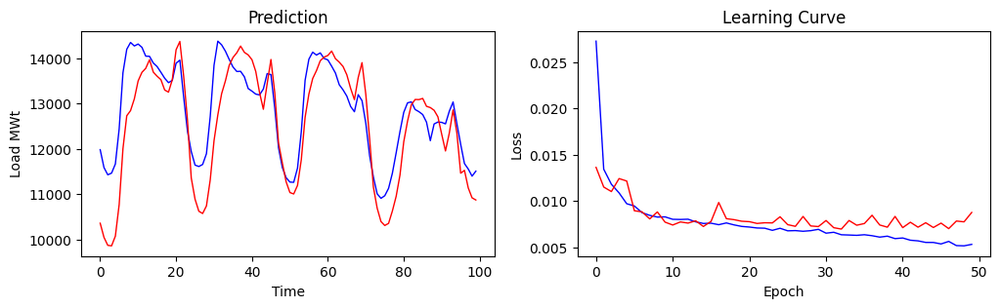



[[10355.810546875], [10044.208984375], [9867.7060546875], [9856.5283203125], [10071.2236328125], [10767.7197265625], [12001.689453125], [12728.017578125], [12841.708984375], [13101.1162109375], [13497.5673828125], [13686.1552734375], [13774.4599609375], [13963.986328125], [13691.6806640625], [13600.5966796875], [13525.4306640625], [13296.291015625], [13249.3583984375], [13523.33984375], [14184.4775390625], [14368.1015625], [13601.71875], [12627.6904296875], [11354.412109375], [10886.19140625], [10620.3330078125], [10570.4296875], [10737.7255859375], [11312.5224609375], [12177.0751953125], [12746.806640625], [13214.087890625], [13497.8662109375], [13841.0498046875], [14014.921875], [14117.888671875], [14266.298828125], [14127.8330078125], [14071.306640625], [13965.3232421875], [13705.140625], [13239.005859375], [12871.638671875], [13432.5966796875], [13970.544921875], [13240.8125], [12128.623046875], [11686.5478515625], [11271.1845703125], [11032.7099609375], [11001.708984375], [11189

In [ ]:
# 4. CNN-LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(24, kernel_size=7, padding="valid")(inputs)
x = layers.MaxPool1D(7)(x)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:06
4/4 [==============================] - 1s 23ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 80ms/step

Single Day Inference Time 186.1112117767334 ms

Evaluation metric results:-

MAPE is : 4.5237477868795395
R2 is : 0.8861880962638097


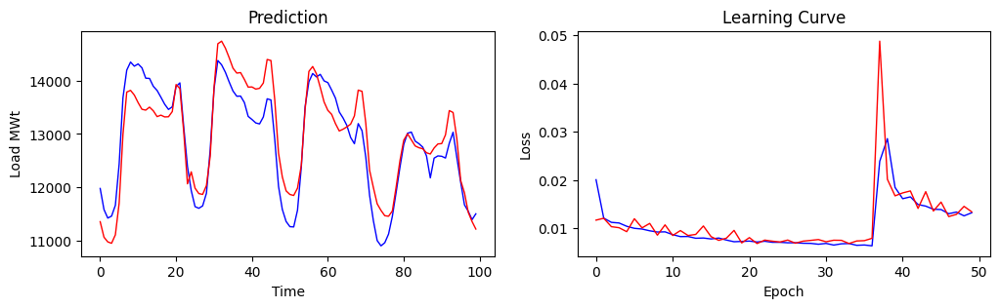



[[11357.2041015625], [11066.666015625], [10979.03125], [10952.798828125], [11111.173828125], [11707.8330078125], [12988.0263671875], [13784.25390625], [13816.2451171875], [13727.8662109375], [13585.9423828125], [13462.26171875], [13446.1279296875], [13501.9794921875], [13433.24609375], [13324.6240234375], [13352.1279296875], [13319.060546875], [13322.169921875], [13418.9736328125], [13924.7255859375], [13850.01171875], [13055.587890625], [12066.037109375], [12290.3408203125], [11984.865234375], [11883.3857421875], [11867.814453125], [12034.2578125], [12586.861328125], [13866.7119140625], [14688.4892578125], [14737.611328125], [14606.068359375], [14426.8076171875], [14231.125], [14139.62890625], [14148.8828125], [14021.15625], [13877.0087890625], [13879.8642578125], [13839.90234375], [13854.9091796875], [13954.146484375], [14394.7119140625], [14375.447265625], [13642.7421875], [12639.9443359375], [12195.720703125], [11934.4892578125], [11866.7265625], [11848.1259765625], [11985.575195

In [ ]:
# 5. CNN-GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=3, padding="valid")(inputs)
x = layers.MaxPool1D(2)(x)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

h : (None, 100), c : (None, 100)
x : (None, None, 100)
d_outputs  : (None, None, 1)
hi : (None, 100), ci : (None, 100)
x : (None, None, 100), h : (None, 100), c : (None, 100)
d_outputs  : (None, None, 1)
Training Time : 00:01:16

Total Inference Time : 00:02:39

Single Day Inference Time 1410.3343486785889 ms

Evaluation metric results:-

MAPE is : 3.7474315613508224
R2 is : 0.9164251032264902


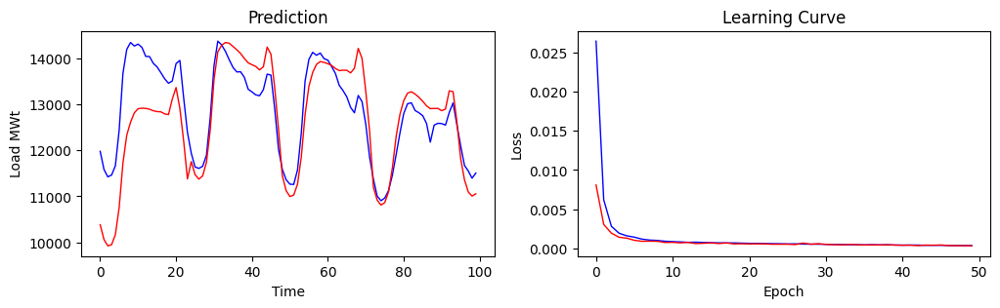



[[10382.482421875, 10061.6494140625, 9923.2939453125, 9948.015625, 10165.4619140625, 10756.0693359375, 11727.2763671875, 12329.0302734375, 12612.4345703125, 12815.8251953125, 12906.4033203125, 12916.9365234375, 12912.8447265625, 12894.87890625, 12861.2275390625, 12843.2685546875, 12837.5107421875, 12793.03515625, 12778.5185546875, 13114.23828125, 13366.7177734375, 12911.0791015625, 12201.8115234375, 11379.375], [11755.953125, 11473.2119140625, 11374.6591796875, 11444.9423828125, 11737.3828125, 12443.6181640625, 13542.8515625, 14143.3720703125, 14284.0068359375, 14345.1875, 14330.8193359375, 14260.1181640625, 14188.0908203125, 14105.7744140625, 13997.6357421875, 13903.66015625, 13862.3857421875, 13825.9970703125, 13749.7861328125, 13817.32421875, 14247.2158203125, 14091.0107421875, 13355.724609375, 12449.8720703125], [11447.322265625, 11125.00390625, 10995.3173828125, 11027.3818359375, 11263.2421875, 11857.6103515625, 12777.083984375, 13390.7646484375, 13693.72265625, 13870.4921875, 1

In [ ]:
# 6. ED-LSTM

n_units = 100

e_inputs = Input(shape=(None, 1))
d_inputs = Input(shape=(None, 1))

e_lstm = LSTM(n_units, return_state=True)
d_lstm = LSTM(n_units, return_sequences=True, return_state=True)
d_dense = Dense(1, activation='linear')

_, h, c = e_lstm(e_inputs)
e_states = [h, c]
print(f"h : {h.shape}, c : {c.shape}")
x, _, _ = d_lstm(d_inputs, initial_state=e_states)
print(f"x : {x.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")
model = Model([e_inputs, d_inputs], d_outputs)
model.compile(optimizer='adam', loss='mse')
# model.summary()

# for inference
e_model = Model(e_inputs, e_states)
# for initial decoder_state_inputs
hi = Input(shape=(n_units,))
ci = Input(shape=(n_units,))
d_states_i = [hi, ci]
print(f"hi : {hi.shape}, ci : {ci.shape}")
x, h, c = d_lstm(d_inputs, initial_state=d_states_i)
d_states = [h, c]
print(f"x : {x.shape}, h : {h.shape}, c : {c.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")

d_model = Model([d_inputs] + d_states_i, [d_outputs] + d_states)

def forecast(input_seq, encoder, decoder):
    state = encoder.predict(input_seq, verbose=0)
    # Generate empty target sequence of length 101 ie [[[0,0,0,0,.....,0]]].
    target_seq = np.zeros((1, 1, 1))
    output = []
    for t in range(24):
        yhat, h, c = decoder.predict([target_seq] + state, verbose=0)
        output.append(yhat[0,0,:]) # yhat : [[[a,b,c,d,...]]] -> yhat[0,0,:] : [a,b,c,d,...]
        state = [h, c]
        target_seq = yhat
    return np.array(output)

start_time = time.time()
history = model.fit([Xs, Xd], Ys, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Y_pred = []
for x in Xts:
    x = np.expand_dims(x, axis=0) # Inputs : (168, 1) -> Expand : (1, 168, 1)
    target = forecast(x, e_model, d_model)  # Output (24, 101)
#     target = one_hot_decode(target)
    target = scaler_load.inverse_transform(target.reshape(-1,1))
    target = target.squeeze(1)
    Y_pred.append(target)
Y_pred = np.array(Y_pred)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = forecast(np.expand_dims(Xts[0],axis=0), e_model, d_model)
print(f"\nSingle Day Inference Time {(time.time() - start_time)*1000} ms")

evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

# 3.COMED

In [ ]:
path = "/content/drive/MyDrive/DATASETS/COMED_hourly.csv"
dataset = pd.read_csv(path,index_col=['Datetime'],parse_dates=['Datetime'])
# n = round((len(dataset)/24)*0.8)*24
train = dataset.iloc[:-2568,:]
test = dataset.iloc[-2568:,:]
train = np.array(train.values)
test = np.array(test.values)

X, Y = reframe(data=train, lookback=LOOKBACK, lookahead=LOOKAHEAD)
Xt, Yt = reframe(data=test, lookback=LOOKBACK, lookahead=LOOKAHEAD)

# Image Conversion GADF
transformer = GramianAngularField(method='difference', overlapping=False, flatten=False)
X_img = transformer.transform(X).reshape(-1,LOOKBACK,LOOKBACK,1)
Xt_img = transformer.transform(Xt).reshape(-1,LOOKBACK,LOOKBACK,1)
print(f"X_img : {X_img.shape}, Xt_img : {Xt_img.shape}")

# Feature Scaling
scaler_load = MinMaxScaler(feature_range=(-1, 1))
Xs = scaler_load.fit_transform(X.reshape(-1,1)).reshape(-1,LOOKBACK,1)
Ys = scaler_load.transform(Y.reshape(-1,1)).reshape(-1,LOOKAHEAD)
Xts = scaler_load.transform(Xt.reshape(-1,1)).reshape(-1,LOOKBACK,1)
print(f"Xs : {Xs.shape}, Ys : {Ys.shape}")
print(f"Xts : {Xts.shape}, Yt : {Yt.shape}")

# Xd = np.insert(Ys, 0, 0, axis=1)
# Xd = np.delete(Xd,-1, axis=1)
# print(f"Xd : {Xd.shape}")

del dataset, train, test, X, Xt
gc.collect()


X_img : (2657, 168, 168, 1), Xt_img : (100, 168, 168, 1)
Xs : (2657, 168, 1), Ys : (2657, 24)
Xts : (100, 168, 1), Yt : (100, 24)


10408

time: 8.56 s (started: 2023-12-17 10:03:05 +00:00)


In [ ]:
print(Yt.tolist())
print("\n")

[[8876.0, 8474.0, 8251.0, 8156.0, 8156.0, 8432.0, 9091.0, 9872.0, 10456.0, 10629.0, 10708.0, 10764.0, 10713.0, 10643.0, 10666.0, 10556.0, 10437.0, 10286.0, 10184.0, 10037.0, 10223.0, 10592.0, 10251.0, 9662.0], [9056.0, 8720.0, 8516.0, 8389.0, 8435.0, 8692.0, 9363.0, 10095.0, 10596.0, 10727.0, 10693.0, 10767.0, 10719.0, 10722.0, 10739.0, 10659.0, 10542.0, 10409.0, 10263.0, 10077.0, 10159.0, 10454.0, 10082.0, 9430.0], [8832.0, 8399.0, 8146.0, 8021.0, 8015.0, 8270.0, 8900.0, 9617.0, 10161.0, 10395.0, 10491.0, 10590.0, 10582.0, 10581.0, 10605.0, 10463.0, 10312.0, 10209.0, 10160.0, 10232.0, 10362.0, 10518.0, 10251.0, 9685.0], [9127.0, 8698.0, 8478.0, 8289.0, 8281.0, 8376.0, 8624.0, 8806.0, 9061.0, 9317.0, 9466.0, 9544.0, 9455.0, 9331.0, 9164.0, 9039.0, 8901.0, 8896.0, 8858.0, 8908.0, 9110.0, 9618.0, 9491.0, 9139.0], [8752.0, 8403.0, 8243.0, 8098.0, 8087.0, 8113.0, 8254.0, 8231.0, 8415.0, 8560.0, 8705.0, 8747.0, 8733.0, 8713.0, 8645.0, 8605.0, 8547.0, 8581.0, 8664.0, 8696.0, 8928.0, 9391.0, 

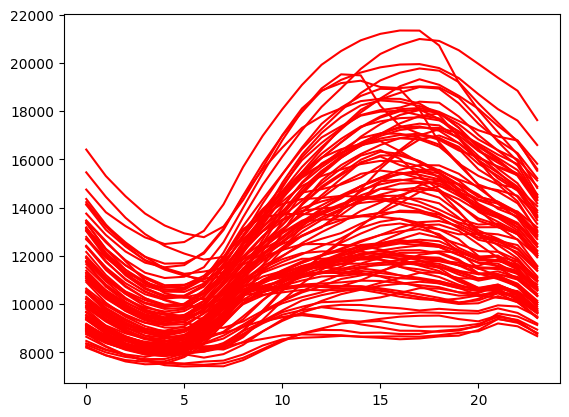

time: 883 ms (started: 2023-11-28 08:04:52 +00:00)


In [ ]:
for i in range(len(Yt)):
    plt.plot(Yt[i], color='r')
plt.show()

Training Time : 00:01:11
4/4 [==============================] - 1s 11ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 29ms/step

Single Day Inference Time 112.51974105834961 ms

Evaluation metric results:-

MAPE is : 5.665480345487595
R2 is : 0.8648266904505455


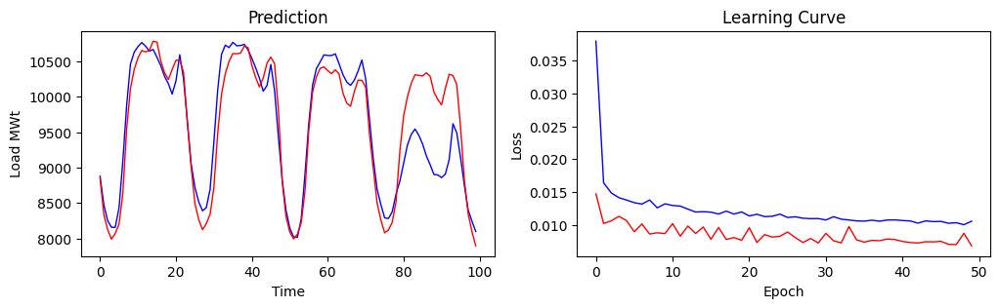



[[8850.9208984375], [8336.76171875], [8124.03125], [7988.90771484375], [8069.8701171875], [8202.0263671875], [8635.17578125], [9543.33984375], [10111.3505859375], [10386.04296875], [10548.822265625], [10651.5751953125], [10632.9326171875], [10654.6318359375], [10783.822265625], [10770.75390625], [10505.345703125], [10338.251953125], [10242.1943359375], [10384.294921875], [10512.7529296875], [10518.3720703125], [10343.6123046875], [9638.62890625], [9011.083984375], [8492.375], [8265.7451171875], [8122.84765625], [8208.6162109375], [8341.0185546875], [8721.357421875], [9480.9931640625], [10030.7861328125], [10324.205078125], [10498.8154296875], [10609.1796875], [10605.3017578125], [10615.037109375], [10713.62890625], [10692.154296875], [10442.978515625], [10272.009765625], [10138.2119140625], [10263.1884765625], [10472.96875], [10558.78125], [10463.3486328125], [9813.513671875], [8803.00390625], [8308.546875], [8088.0830078125], [7993.25244140625], [8058.79296875], [8219.31640625], [86

In [ ]:
# CNNLSTM+GAF

seq_inputs = layers.Input(shape=(LOOKBACK,1))
img_inputs = layers.Input(shape=(LOOKBACK,LOOKBACK,1))

x1 = layers.LSTM(50, return_sequences=False)(seq_inputs)
x2 = layers.Convolution2D(filters=20, kernel_size=7, padding='valid')(img_inputs)
x2 = layers.GlobalAvgPool2D()(x2)
c1 = layers.Concatenate(axis=1)([x1,x2])
outputs = layers.Dense(24, activation='linear')(c1)

model = Model([seq_inputs,img_inputs], outputs)
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit([Xs,X_img], Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict([Xts,Xt_img])
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict([Xts[:1],Xt_img[:1]])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:21
4/4 [==============================] - 0s 3ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 17ms/step

Single Day Inference Time 51.01180076599121 ms

Evaluation metric results:-

MAPE is : 7.373838126659393
R2 is : 0.8147483420964945


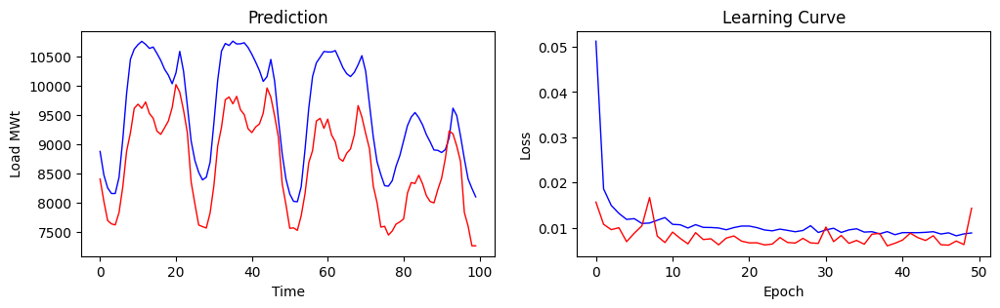



[[8404.7607421875], [8022.2060546875], [7692.07666015625], [7635.0439453125], [7617.1728515625], [7829.9296875], [8275.6875], [8882.5703125], [9194.07421875], [9615.509765625], [9686.2431640625], [9615.443359375], [9723.744140625], [9527.4189453125], [9446.5654296875], [9225.2978515625], [9169.6005859375], [9281.466796875], [9398.193359375], [9626.39453125], [10022.908203125], [9892.521484375], [9581.76953125], [9199.46484375], [8354.0234375], [7975.22119140625], [7614.5322265625], [7587.88671875], [7564.5654296875], [7822.42626953125], [8290.431640625], [8967.158203125], [9290.0576171875], [9762.439453125], [9810.177734375], [9692.638671875], [9821.53515625], [9591.6416015625], [9508.3720703125], [9266.8759765625], [9200.017578125], [9295.775390625], [9347.337890625], [9533.6845703125], [9965.197265625], [9808.802734375], [9486.9580078125], [9120.2314453125], [8320.470703125], [7960.70947265625], [7558.62744140625], [7566.10107421875], [7524.2041015625], [7773.45849609375], [8146.66

In [ ]:
# 1. MLP
inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Flatten()(inputs)
x = layers.Dense(100, activation="relu")(x)
x = layers.Dense(48, activation="relu")(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="MLP")
model.compile(optimizer=Adam(learning_rate=0.01),loss=mse, metrics=[mse])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:17
4/4 [==============================] - 1s 9ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 34ms/step

Single Day Inference Time 82.52263069152832 ms

Evaluation metric results:-

MAPE is : 6.227181851863861
R2 is : 0.8448040085520551


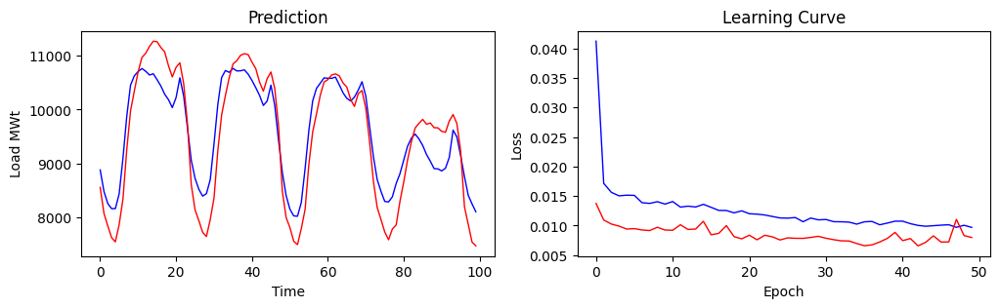



[[8551.4423828125], [8065.880859375], [7835.5556640625], [7616.49853515625], [7537.48095703125], [7860.09619140625], [8332.9658203125], [9251.3173828125], [9976.6494140625], [10345.5078125], [10704.240234375], [10970.1708984375], [11048.9208984375], [11175.716796875], [11273.5810546875], [11262.6123046875], [11154.3056640625], [11073.751953125], [10816.18359375], [10607.0205078125], [10786.9951171875], [10870.71875], [10483.40234375], [9735.974609375], [8602.3154296875], [8133.16943359375], [7932.58984375], [7715.2822265625], [7636.49755859375], [7951.52978515625], [8353.990234375], [9233.7314453125], [9899.251953125], [10262.5302734375], [10593.8798828125], [10849.5185546875], [10909.990234375], [11010.6689453125], [11040.5986328125], [11022.40234375], [10883.71484375], [10763.2236328125], [10511.8798828125], [10342.6865234375], [10575.291015625], [10699.1435546875], [10392.6572265625], [9703.0029296875], [8480.1826171875], [7991.1240234375], [7803.6572265625], [7548.91748046875], [

In [ ]:
# 2. LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.LSTM(100, return_sequences=True)(inputs)
x = layers.LSTM(16, return_sequences=False)(x)
outputs = layers.Dense(24)(x)
model = Model(inputs=inputs, outputs = outputs, name="LSTM")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')
# model.summary()

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:16
4/4 [==============================] - 2s 9ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 50ms/step

Single Day Inference Time 149.87850189208984 ms

Evaluation metric results:-

MAPE is : 6.452436000108719
R2 is : 0.8491556671779592


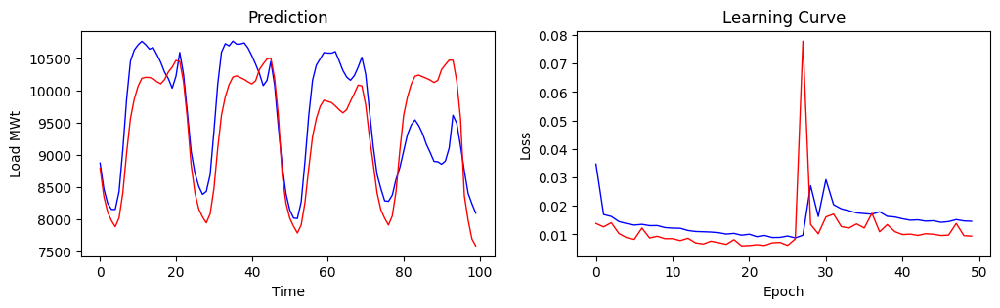



[[8796.9755859375], [8355.5478515625], [8113.11669921875], [7981.82177734375], [7887.509765625], [8023.19287109375], [8415.0703125], [9038.2392578125], [9566.69921875], [9866.8134765625], [10065.951171875], [10190.146484375], [10204.916015625], [10202.5146484375], [10184.134765625], [10136.6142578125], [10104.9404296875], [10170.943359375], [10289.6435546875], [10363.86328125], [10467.8642578125], [10451.669921875], [10133.318359375], [9568.9384765625], [8844.880859375], [8413.583984375], [8165.7470703125], [8038.69677734375], [7947.0078125], [8085.37451171875], [8476.2705078125], [9102.875], [9621.2236328125], [9903.30078125], [10092.4267578125], [10209.1572265625], [10229.1416015625], [10200.052734375], [10172.85546875], [10133.8046875], [10102.7080078125], [10152.7373046875], [10327.384765625], [10415.041015625], [10489.7568359375], [10504.2275390625], [10187.91015625], [9600.6513671875], [8687.9287109375], [8250.021484375], [8018.32373046875], [7893.869140625], [7790.56396484375]

In [ ]:
# 3. GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.GRU(100, return_sequences=True)(inputs)
x = layers.GRU(16, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="GRU")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2, batch_size=32, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:33
4/4 [==============================] - 1s 5ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 28ms/step

Single Day Inference Time 81.41922950744629 ms

Evaluation metric results:-

MAPE is : 6.0546208173036575
R2 is : 0.8280803542787849


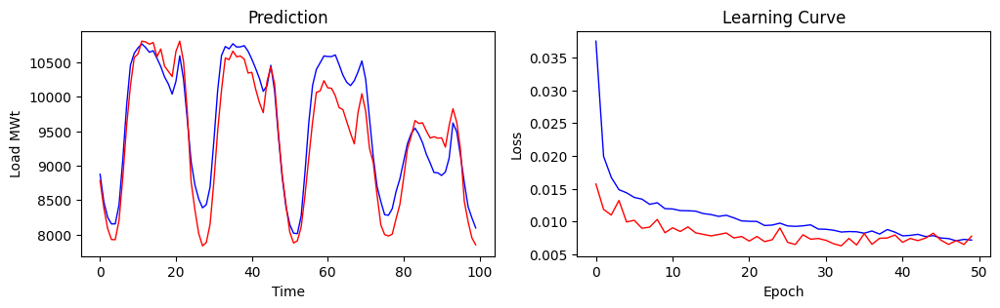



[[8782.3671875], [8385.1279296875], [8089.5966796875], [7929.48779296875], [7926.87890625], [8208.8837890625], [8832.4189453125], [9578.4873046875], [10155.78515625], [10565.9111328125], [10620.84765625], [10804.3837890625], [10793.841796875], [10760.140625], [10785.99609375], [10577.7880859375], [10691.0751953125], [10442.4765625], [10367.0693359375], [10290.951171875], [10656.3115234375], [10803.859375], [10509.59375], [9767.810546875], [8765.79296875], [8357.4716796875], [8016.35302734375], [7837.95263671875], [7886.435546875], [8153.07421875], [8772.4912109375], [9508.40625], [10092.783203125], [10560.4248046875], [10535.6630859375], [10660.3359375], [10577.833984375], [10589.2177734375], [10544.2138671875], [10342.4697265625], [10352.2216796875], [10109.2529296875], [9913.7451171875], [9768.0693359375], [10219.7744140625], [10433.5146484375], [10180.4169921875], [9478.681640625], [8866.3759765625], [8434.9814453125], [8036.74853515625], [7879.56640625], [7911.1826171875], [8111.

In [ ]:
# 4. CNN-LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=7, padding="valid")(inputs)
x = layers.MaxPool1D(7)(x)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:43
4/4 [==============================] - 1s 5ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 20ms/step

Single Day Inference Time 59.1740608215332 ms

Evaluation metric results:-

MAPE is : 6.28858283162117
R2 is : 0.8388277173441596


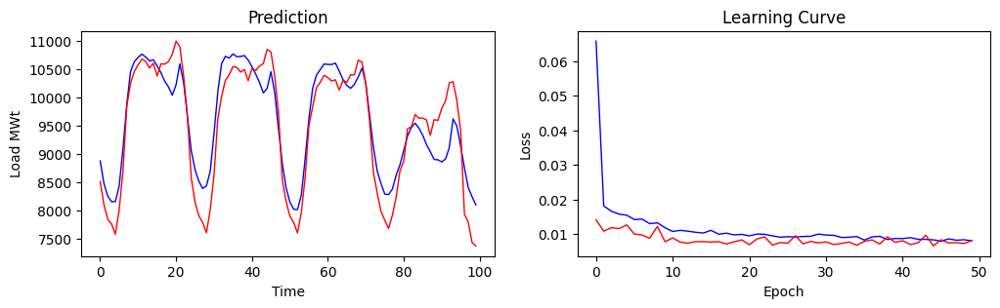



[[8509.0419921875], [8100.14599609375], [7841.36181640625], [7760.4345703125], [7578.33837890625], [8006.81396484375], [8692.05078125], [9835.943359375], [10251.654296875], [10458.091796875], [10576.4833984375], [10679.3310546875], [10635.1357421875], [10517.728515625], [10603.26953125], [10376.9140625], [10589.9443359375], [10588.654296875], [10630.8232421875], [10760.853515625], [10993.537109375], [10896.4541015625], [10374.4560546875], [9656.55859375], [8573.44921875], [8147.36962890625], [7901.8193359375], [7787.46875], [7605.23828125], [8011.93798828125], [8623.955078125], [9617.46484375], [10015.55859375], [10301.76171875], [10401.14453125], [10544.5810546875], [10530.7265625], [10445.7275390625], [10492.49609375], [10292.1669921875], [10509.662109375], [10474.6142578125], [10552.919921875], [10597.4736328125], [10847.197265625], [10802.1171875], [10377.8212890625], [9703.1318359375], [8539.3779296875], [8157.09326171875], [7900.98486328125], [7786.7841796875], [7601.6176757812

In [ ]:
# 5. CNN-GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(12, kernel_size=13, padding="valid")(inputs)
x = layers.ReLU()(x)
x = layers.MaxPool1D(5)(x)
x = layers.GRU(150, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
model.compile(optimizer=Adam(learning_rate=0.01), loss=mse, metrics=[mse])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

h : (None, 100), c : (None, 100)
x : (None, None, 100)
d_outputs  : (None, None, 1)
hi : (None, 100), ci : (None, 100)
x : (None, None, 100), h : (None, 100), c : (None, 100)
d_outputs  : (None, None, 1)
Training Time : 00:01:26

Total Inference Time : 00:03:17

Single Day Inference Time 1989.150047302246 ms

Evaluation metric results:-

MAPE is : 14.899015426635742
R2 is : 0.26784083030579064


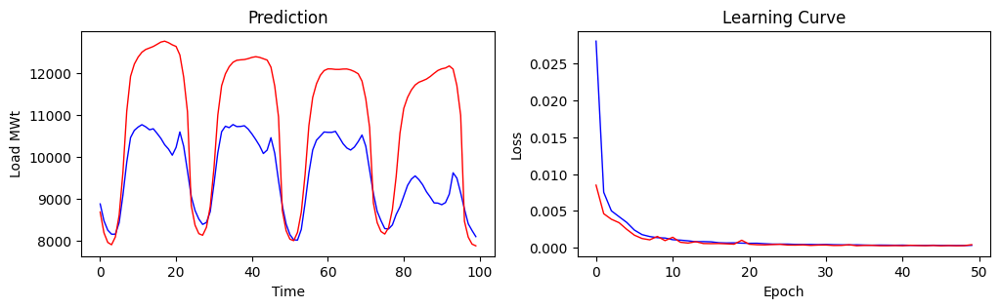



[[8682.5810546875, 8187.32373046875, 7959.419921875, 7904.8076171875, 8090.46435546875, 8606.6875, 9637.0703125, 11082.970703125, 11914.4248046875, 12207.6103515625, 12373.9765625, 12490.443359375, 12555.802734375, 12590.78515625, 12626.8115234375, 12678.3896484375, 12731.6875, 12753.3759765625, 12717.2421875, 12666.119140625, 12627.2509765625, 12423.9365234375, 11896.79296875, 11072.912109375], [8840.548828125, 8370.5634765625, 8168.68408203125, 8130.3662109375, 8319.78515625, 8809.9482421875, 9742.595703125, 10993.0, 11692.23046875, 11974.5693359375, 12145.333984375, 12251.3837890625, 12297.732421875, 12308.6767578125, 12315.884765625, 12337.0322265625, 12366.7265625, 12383.3837890625, 12367.4365234375, 12335.798828125, 12302.650390625, 12135.1181640625, 11683.40234375, 10949.1279296875], [8720.505859375, 8240.130859375, 8036.5625, 8002.337890625, 8197.2978515625, 8681.1005859375, 9579.0224609375, 10742.1904296875, 11411.955078125, 11737.888671875, 11938.7705078125, 12051.657226562

In [ ]:
# 6. ED-LSTM

n_units = 100

e_inputs = Input(shape=(None, 1))
d_inputs = Input(shape=(None, 1))

e_lstm = LSTM(n_units, return_state=True)
d_lstm = LSTM(n_units, return_sequences=True, return_state=True)
d_dense = Dense(1, activation='linear')

_, h, c = e_lstm(e_inputs)
e_states = [h, c]
print(f"h : {h.shape}, c : {c.shape}")
x, _, _ = d_lstm(d_inputs, initial_state=e_states)
print(f"x : {x.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")
model = Model([e_inputs, d_inputs], d_outputs)
model.compile(optimizer='adam', loss='mse')
# model.summary()

# for inference
e_model = Model(e_inputs, e_states)
# for initial decoder_state_inputs
hi = Input(shape=(n_units,))
ci = Input(shape=(n_units,))
d_states_i = [hi, ci]
print(f"hi : {hi.shape}, ci : {ci.shape}")
x, h, c = d_lstm(d_inputs, initial_state=d_states_i)
d_states = [h, c]
print(f"x : {x.shape}, h : {h.shape}, c : {c.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")

d_model = Model([d_inputs] + d_states_i, [d_outputs] + d_states)

def forecast(input_seq, encoder, decoder):
    state = encoder.predict(input_seq, verbose=0)
    # Generate empty target sequence of length 101 ie [[[0,0,0,0,.....,0]]].
    target_seq = np.zeros((1, 1, 1))
    output = []
    for t in range(24):
        yhat, h, c = decoder.predict([target_seq] + state, verbose=0)
        output.append(yhat[0,0,:]) # yhat : [[[a,b,c,d,...]]] -> yhat[0,0,:] : [a,b,c,d,...]
        state = [h, c]
        target_seq = yhat
    return np.array(output)

start_time = time.time()
history = model.fit([Xs, Xd], Ys, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Y_pred = []
for x in Xts:
    x = np.expand_dims(x, axis=0) # Inputs : (168, 1) -> Expand : (1, 168, 1)
    target = forecast(x, e_model, d_model)  # Output (24, 101)
#     target = one_hot_decode(target)
    target = scaler_load.inverse_transform(target.reshape(-1,1))
    target = target.squeeze(1)
    Y_pred.append(target)
Y_pred = np.array(Y_pred)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = forecast(np.expand_dims(Xts[0],axis=0), e_model, d_model)
print(f"\nSingle Day Inference Time {(time.time() - start_time)*1000} ms")

evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

# 4.DEOK

In [ ]:
path = "/content/drive/MyDrive/DATASETS/DEOK_hourly.csv"
dataset = pd.read_csv(path,index_col=['Datetime'],parse_dates=['Datetime'])
# n = round((len(dataset)/24)*0.8)*24
train = dataset.iloc[:-2568,:]
test = dataset.iloc[-2568:,:]
train = np.array(train.values)
test = np.array(test.values)

X, Y = reframe(data=train, lookback=LOOKBACK, lookahead=LOOKAHEAD)
Xt, Yt = reframe(data=test, lookback=LOOKBACK, lookahead=LOOKAHEAD)

# Image Conversion GADF
transformer = GramianAngularField(method='difference', overlapping=False, flatten=False)
X_img = transformer.transform(X).reshape(-1,LOOKBACK,LOOKBACK,1)
Xt_img = transformer.transform(Xt).reshape(-1,LOOKBACK,LOOKBACK,1)
print(f"X_img : {X_img.shape}, Xt_img : {Xt_img.shape}")

# Feature Scaling
scaler_load = MinMaxScaler(feature_range=(-1, 1))
Xs = scaler_load.fit_transform(X.reshape(-1,1)).reshape(-1,LOOKBACK,1)
Ys = scaler_load.transform(Y.reshape(-1,1)).reshape(-1,LOOKAHEAD)
Xts = scaler_load.transform(Xt.reshape(-1,1)).reshape(-1,LOOKBACK,1)
print(f"Xs : {Xs.shape}, Ys : {Ys.shape}")
print(f"Xts : {Xts.shape}, Yt : {Yt.shape}")

# Xd = np.insert(Ys, 0, 0, axis=1)
# Xd = np.delete(Xd,-1, axis=1)
# print(f"Xd : {Xd.shape}")

del dataset, train, test, X, Xt
gc.collect()



X_img : (2292, 168, 168, 1), Xt_img : (100, 168, 168, 1)
Xs : (2292, 168, 1), Ys : (2292, 24)
Xts : (100, 168, 1), Yt : (100, 24)


0

time: 7.52 s (started: 2023-12-17 10:03:23 +00:00)


In [ ]:
print(Yt.tolist())
print("\n")

[[2375.0, 2281.0, 2247.0, 2216.0, 2276.0, 2457.0, 2735.0, 2863.0, 2896.0, 2923.0, 2971.0, 2934.0, 2916.0, 2866.0, 2847.0, 2824.0, 2787.0, 2791.0, 2737.0, 2724.0, 2798.0, 2816.0, 2628.0, 2454.0], [2327.0, 2271.0, 2223.0, 2251.0, 2287.0, 2460.0, 2765.0, 2888.0, 2898.0, 2845.0, 2876.0, 2885.0, 2885.0, 2860.0, 2876.0, 2849.0, 2817.0, 2806.0, 2751.0, 2745.0, 2833.0, 2835.0, 2644.0, 2463.0], [2331.0, 2246.0, 2187.0, 2206.0, 2262.0, 2444.0, 2738.0, 2842.0, 2872.0, 2888.0, 2898.0, 2882.0, 2878.0, 2889.0, 2868.0, 2836.0, 2800.0, 2757.0, 2687.0, 2639.0, 2676.0, 2694.0, 2564.0, 2401.0], [2295.0, 2237.0, 2170.0, 2150.0, 2179.0, 2202.0, 2308.0, 2406.0, 2538.0, 2639.0, 2720.0, 2732.0, 2680.0, 2617.0, 2561.0, 2532.0, 2499.0, 2512.0, 2503.0, 2504.0, 2593.0, 2645.0, 2566.0, 2473.0], [2348.0, 2276.0, 2265.0, 2267.0, 2303.0, 2358.0, 2450.0, 2492.0, 2554.0, 2597.0, 2579.0, 2549.0, 2504.0, 2447.0, 2431.0, 2405.0, 2407.0, 2451.0, 2466.0, 2487.0, 2588.0, 2638.0, 2507.0, 2359.0], [2260.0, 2209.0, 2210.0, 2241

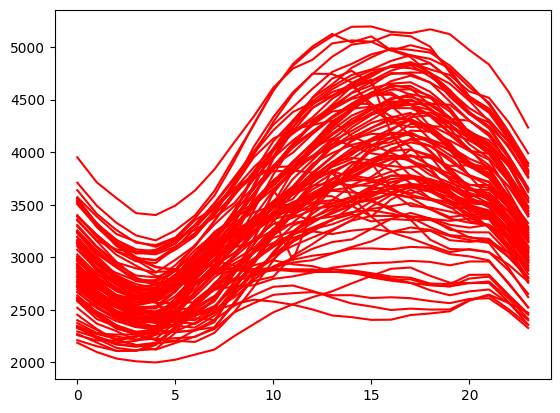

time: 306 ms (started: 2023-12-17 10:03:40 +00:00)


In [ ]:
for i in range(len(Yt)):
    plt.plot(Yt[i], color='r')
plt.show()

Training Time : 00:01:28
4/4 [==============================] - 1s 10ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 31ms/step

Single Day Inference Time 84.94281768798828 ms

Evaluation metric results:-

MAPE is : 4.921398684382439
R2 is : 0.8595773781173616


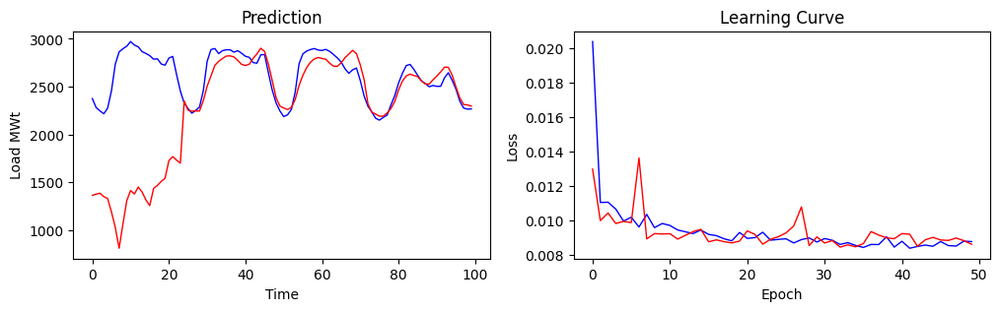



[[1363.5245361328125], [1377.5250244140625], [1386.3785400390625], [1350.7794189453125], [1331.4788818359375], [1190.4754638671875], [1029.30078125], [812.0394897460938], [1065.5499267578125], [1308.805908203125], [1414.6915283203125], [1378.51025390625], [1451.5584716796875], [1398.996826171875], [1316.9136962890625], [1257.3948974609375], [1436.844970703125], [1468.262451171875], [1509.7861328125], [1543.8798828125], [1726.4307861328125], [1769.3466796875], [1732.1552734375], [1700.52880859375], [2351.681640625], [2254.22265625], [2244.031494140625], [2246.032958984375], [2245.3095703125], [2354.564697265625], [2505.50537109375], [2612.25390625], [2721.739990234375], [2764.304443359375], [2793.960205078125], [2819.670166015625], [2821.32080078125], [2810.164306640625], [2773.818115234375], [2732.29931640625], [2721.196533203125], [2733.9638671875], [2795.147216796875], [2841.67138671875], [2901.703125], [2867.532958984375], [2733.158447265625], [2562.9296875], [2385.451416015625], 

In [ ]:
# CNNLSTM+GAF

seq_inputs = layers.Input(shape=(LOOKBACK,1))
img_inputs = layers.Input(shape=(LOOKBACK,LOOKBACK,1))

x1 = layers.LSTM(50, return_sequences=False)(seq_inputs)
x2 = layers.Convolution2D(filters=20, kernel_size=7, padding='valid')(img_inputs)
x2 = layers.GlobalAvgPool2D()(x2)
c1 = layers.Concatenate(axis=1)([x1,x2])
outputs = layers.Dense(24, activation='linear')(c1)

model = Model([seq_inputs,img_inputs], outputs)
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit([Xs,X_img], Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict([Xts,Xt_img])
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict([Xts[:1],Xt_img[:1]])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:21
4/4 [==============================] - 0s 3ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 17ms/step

Single Day Inference Time 54.47864532470703 ms

Evaluation metric results:-

MAPE is : 6.01634606719017
R2 is : 0.832664829120618


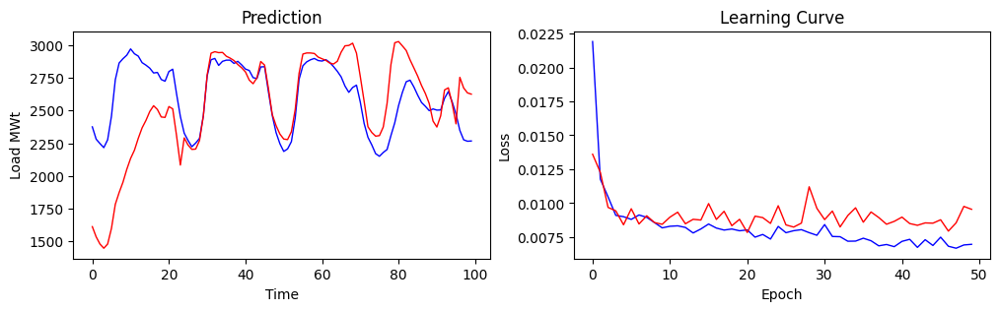



[[1611.8228759765625], [1534.0660400390625], [1478.563720703125], [1446.7928466796875], [1478.823974609375], [1598.903076171875], [1782.37548828125], [1872.3133544921875], [1951.2542724609375], [2049.940673828125], [2133.638427734375], [2196.29150390625], [2287.28125], [2367.161376953125], [2423.84912109375], [2491.906005859375], [2536.675048828125], [2507.884521484375], [2450.450927734375], [2447.30810546875], [2530.260009765625], [2512.74853515625], [2308.3125], [2082.73388671875], [2290.433349609375], [2236.20166015625], [2202.653076171875], [2205.06689453125], [2270.51318359375], [2458.597412109375], [2772.55078125], [2938.00390625], [2949.61669921875], [2942.51611328125], [2944.126953125], [2915.1982421875], [2900.657470703125], [2882.139404296875], [2851.84375], [2826.791748046875], [2795.299072265625], [2732.142578125], [2704.863525390625], [2750.39697265625], [2874.6826171875], [2847.099365234375], [2668.5166015625], [2469.275390625], [2384.553955078125], [2319.780517578125],

In [ ]:
# 1. MLP
inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Flatten()(inputs)
x = layers.Dense(100, activation="relu")(x)
x = layers.Dense(48, activation="relu")(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="MLP")
model.compile(optimizer=Adam(learning_rate=0.01),loss=mse, metrics=[mse])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:26
4/4 [==============================] - 1s 11ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 40ms/step

Single Day Inference Time 91.37511253356934 ms

Evaluation metric results:-

MAPE is : 5.5292680859565735
R2 is : 0.8572969108630627


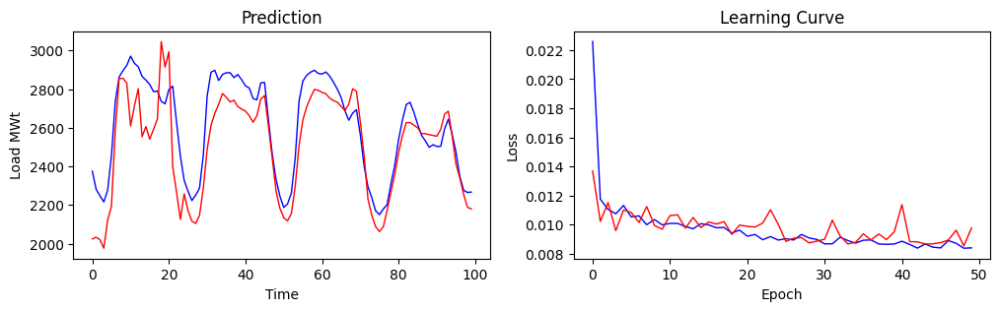



[[2024.2371826171875], [2032.80029296875], [2019.9927978515625], [1975.9844970703125], [2120.81298828125], [2194.63720703125], [2590.013427734375], [2853.67529296875], [2856.854248046875], [2831.229736328125], [2609.44677734375], [2713.415283203125], [2802.80419921875], [2553.700927734375], [2606.240478515625], [2541.19091796875], [2592.041015625], [2646.24951171875], [3046.678466796875], [2914.57666015625], [2993.931396484375], [2397.99072265625], [2265.794677734375], [2125.9921875], [2258.101806640625], [2169.963134765625], [2116.657470703125], [2104.55517578125], [2145.42529296875], [2289.432861328125], [2488.391845703125], [2612.577880859375], [2675.03173828125], [2721.9091796875], [2777.48828125], [2757.839111328125], [2733.673828125], [2742.817626953125], [2709.648193359375], [2697.12158203125], [2686.3125], [2662.533203125], [2628.6015625], [2662.66552734375], [2748.57373046875], [2766.845947265625], [2610.411865234375], [2442.45458984375], [2271.171630859375], [2183.050048828

In [ ]:
# 2. LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.LSTM(50, return_sequences=True)(inputs)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)
model = Model(inputs=inputs, outputs = outputs, name="LSTM")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')
# model.summary()

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:44
4/4 [==============================] - 1s 8ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 31ms/step

Single Day Inference Time 81.78424835205078 ms

Evaluation metric results:-

MAPE is : 5.061209574341774
R2 is : 0.8625889281713033


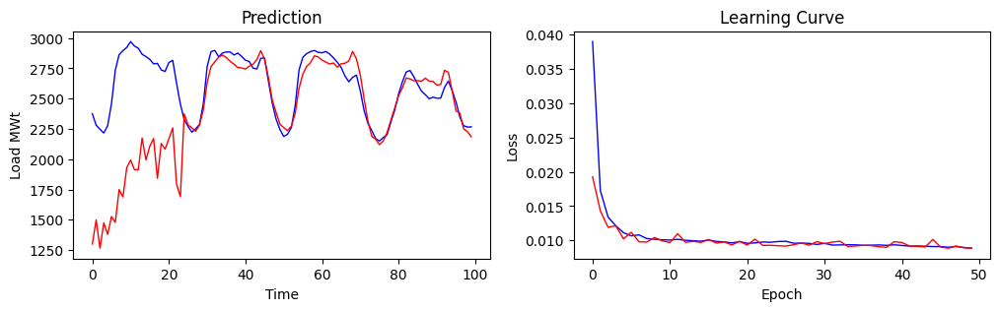



[[1299.6075439453125], [1498.2864990234375], [1264.8961181640625], [1474.546142578125], [1378.791259765625], [1525.8206787109375], [1478.0478515625], [1749.3013916015625], [1688.009765625], [1930.5599365234375], [1992.6024169921875], [1914.2210693359375], [1912.610107421875], [2174.81494140625], [1993.8304443359375], [2105.75146484375], [2170.8583984375], [1841.579345703125], [2130.317138671875], [2083.0224609375], [2167.581298828125], [2258.413818359375], [1793.952880859375], [1689.9361572265625], [2373.848876953125], [2282.93310546875], [2259.341552734375], [2230.415283203125], [2282.08056640625], [2409.230224609375], [2633.74560546875], [2763.544921875], [2804.25], [2842.00830078125], [2859.21337890625], [2839.375732421875], [2807.416748046875], [2784.1845703125], [2756.489990234375], [2753.431640625], [2743.92822265625], [2768.242431640625], [2784.36865234375], [2823.48046875], [2895.712158203125], [2821.793701171875], [2672.3154296875], [2488.067138671875], [2386.396728515625], 

In [ ]:
# 3. GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.GRU(100, return_sequences=True)(inputs)
x = layers.GRU(16, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="GRU")
model.compile(optimizer=Adam(learning_rate=0.001),loss=mse, metrics=[mse])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:40
4/4 [==============================] - 1s 5ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 43ms/step

Single Day Inference Time 91.78686141967773 ms

Evaluation metric results:-

MAPE is : 5.1323093473911285
R2 is : 0.8643339822651978


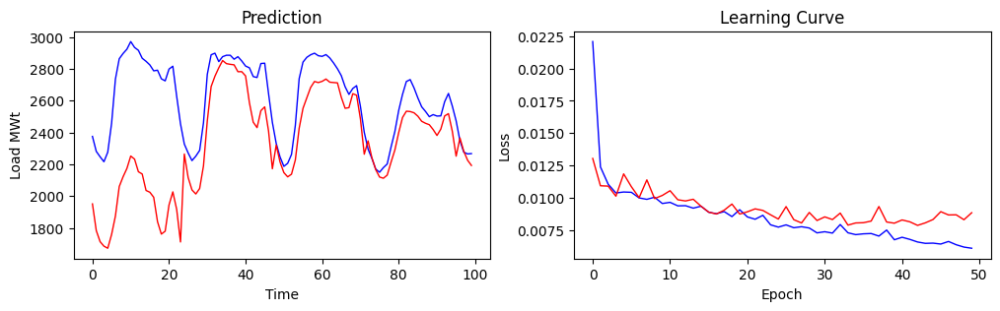



[[1951.11572265625], [1783.389404296875], [1713.8319091796875], [1685.6676025390625], [1672.5006103515625], [1758.6873779296875], [1874.9422607421875], [2060.2548828125], [2121.44140625], [2173.7451171875], [2251.67724609375], [2232.3154296875], [2153.15771484375], [2138.7421875], [2035.5279541015625], [2024.2135009765625], [1992.6983642578125], [1839.1715087890625], [1761.291748046875], [1779.695068359375], [1944.3443603515625], [2026.55419921875], [1917.037841796875], [1711.8087158203125], [2264.44970703125], [2116.471435546875], [2038.7401123046875], [2013.2838134765625], [2047.5269775390625], [2189.529052734375], [2472.621826171875], [2688.114501953125], [2753.42041015625], [2805.904052734375], [2851.789306640625], [2832.28515625], [2827.8564453125], [2824.708984375], [2781.55517578125], [2781.75927734375], [2754.96826171875], [2587.220703125], [2464.531005859375], [2430.108154296875], [2537.0341796875], [2560.648193359375], [2408.715576171875], [2171.768310546875], [2320.5627441

In [ ]:
# 4. CNN-LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=3, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:47
4/4 [==============================] - 1s 5ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 27ms/step

Single Day Inference Time 116.42599105834961 ms

Evaluation metric results:-

MAPE is : 5.309560522437096
R2 is : 0.8562676844152652


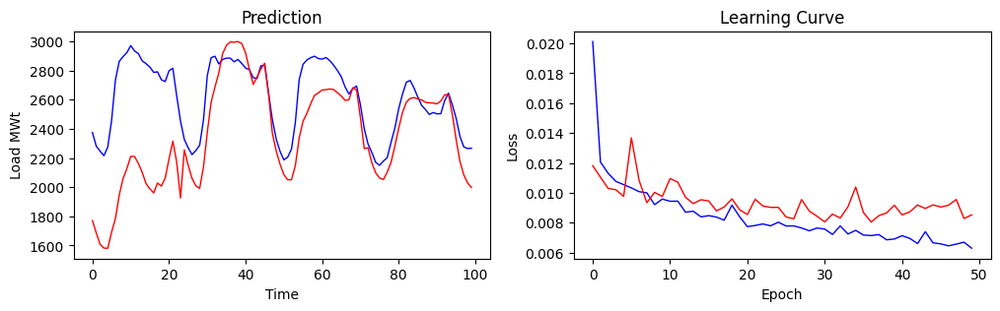



[[1770.7650146484375], [1685.6644287109375], [1607.87548828125], [1582.1307373046875], [1581.418212890625], [1691.171875], [1785.251220703125], [1946.0465087890625], [2059.463134765625], [2128.087158203125], [2211.130126953125], [2210.741943359375], [2162.12646484375], [2101.55419921875], [2024.052001953125], [1988.56884765625], [1960.599365234375], [2028.758056640625], [2007.0355224609375], [2062.54638671875], [2193.850830078125], [2315.497802734375], [2173.12646484375], [1925.7913818359375], [2255.608154296875], [2151.29345703125], [2061.19677734375], [2009.8565673828125], [1991.2220458984375], [2137.828857421875], [2377.271240234375], [2583.19140625], [2686.599853515625], [2782.781494140625], [2915.88037109375], [2971.923095703125], [2996.0498046875], [2993.724609375], [2998.616455078125], [2985.029052734375], [2920.650146484375], [2807.440673828125], [2704.598388671875], [2755.91357421875], [2810.913818359375], [2850.35791015625], [2641.589599609375], [2368.2041015625], [2248.974

In [ ]:
# 5. CNN-GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=7, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

h : (None, 100), c : (None, 100)
x : (None, None, 100)
d_outputs  : (None, None, 1)
hi : (None, 100), ci : (None, 100)
x : (None, None, 100), h : (None, 100), c : (None, 100)
d_outputs  : (None, None, 1)
Training Time : 00:01:26

Total Inference Time : 00:04:11

Single Day Inference Time 1438.0488395690918 ms

Evaluation metric results:-

MAPE is : 5.612684786319733
R2 is : 0.8421581710521565


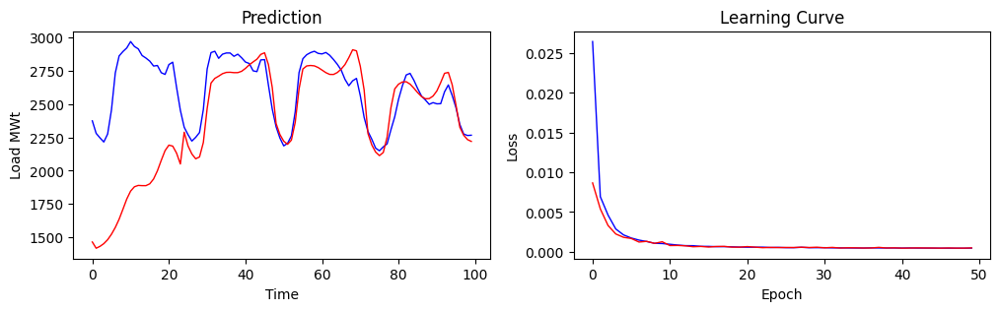



[[1464.429443359375, 1417.4947509765625, 1431.6270751953125, 1451.9967041015625, 1481.5467529296875, 1522.6878662109375, 1573.6566162109375, 1635.8375244140625, 1710.88232421875, 1787.4998779296875, 1846.82763671875, 1879.6099853515625, 1889.6436767578125, 1888.0013427734375, 1887.8857421875, 1901.568359375, 1937.9732666015625, 1999.5262451171875, 2077.812744140625, 2151.2265625, 2192.45068359375, 2185.1650390625, 2132.686767578125, 2050.685302734375], [2289.585693359375, 2186.678466796875, 2126.0732421875, 2089.80712890625, 2103.479736328125, 2212.30078125, 2468.674560546875, 2659.10791015625, 2694.1806640625, 2710.89306640625, 2729.54541015625, 2739.1591796875, 2740.1103515625, 2737.28125, 2737.4765625, 2747.466064453125, 2769.24267578125, 2796.156982421875, 2817.90673828125, 2838.431396484375, 2874.447021484375, 2886.45947265625, 2798.098388671875, 2625.578369140625], [2355.4052734375, 2272.037353515625, 2221.986083984375, 2198.671142578125, 2230.236572265625, 2364.069580078125, 2

In [ ]:
# 6. ED-LSTM

n_units = 100

e_inputs = Input(shape=(None, 1))
d_inputs = Input(shape=(None, 1))

e_lstm = LSTM(n_units, return_state=True)
d_lstm = LSTM(n_units, return_sequences=True, return_state=True)
d_dense = Dense(1, activation='linear')

_, h, c = e_lstm(e_inputs)
e_states = [h, c]
print(f"h : {h.shape}, c : {c.shape}")
x, _, _ = d_lstm(d_inputs, initial_state=e_states)
print(f"x : {x.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")
model = Model([e_inputs, d_inputs], d_outputs)
model.compile(optimizer='adam', loss='mse')
# model.summary()

# for inference
e_model = Model(e_inputs, e_states)
# for initial decoder_state_inputs
hi = Input(shape=(n_units,))
ci = Input(shape=(n_units,))
d_states_i = [hi, ci]
print(f"hi : {hi.shape}, ci : {ci.shape}")
x, h, c = d_lstm(d_inputs, initial_state=d_states_i)
d_states = [h, c]
print(f"x : {x.shape}, h : {h.shape}, c : {c.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")

d_model = Model([d_inputs] + d_states_i, [d_outputs] + d_states)

def forecast(input_seq, encoder, decoder):
    state = encoder.predict(input_seq, verbose=0)
    # Generate empty target sequence of length 101 ie [[[0,0,0,0,.....,0]]].
    target_seq = np.zeros((1, 1, 1))
    output = []
    for t in range(24):
        yhat, h, c = decoder.predict([target_seq] + state, verbose=0)
        output.append(yhat[0,0,:]) # yhat : [[[a,b,c,d,...]]] -> yhat[0,0,:] : [a,b,c,d,...]
        state = [h, c]
        target_seq = yhat
    return np.array(output)

start_time = time.time()
history = model.fit([Xs, Xd], Ys, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Y_pred = []
for x in Xts:
    x = np.expand_dims(x, axis=0) # Inputs : (168, 1) -> Expand : (1, 168, 1)
    target = forecast(x, e_model, d_model)  # Output (24, 101)
#     target = one_hot_decode(target)
    target = scaler_load.inverse_transform(target.reshape(-1,1))
    target = target.squeeze(1)
    Y_pred.append(target)
Y_pred = np.array(Y_pred)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = forecast(np.expand_dims(Xts[0],axis=0), e_model, d_model)
print(f"\nSingle Day Inference Time {(time.time() - start_time)*1000} ms")

evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

# 5.DUQ

In [ ]:
path = "/content/drive/MyDrive/DATASETS/DUQ_hourly.csv"
dataset = pd.read_csv(path,index_col=['Datetime'],parse_dates=['Datetime'])
# n = round((len(dataset)/24)*0.8)*24
train = dataset.iloc[:-2568,:]
test = dataset.iloc[-2568:,:]
train = np.array(train.values)
test = np.array(test.values)

X, Y = reframe(data=train, lookback=LOOKBACK, lookahead=LOOKAHEAD)
Xt, Yt = reframe(data=test, lookback=LOOKBACK, lookahead=LOOKAHEAD)

# Image Conversion GADF
transformer = GramianAngularField(method='difference', overlapping=False, flatten=False)
X_img = transformer.transform(X).reshape(-1,LOOKBACK,LOOKBACK,1)
Xt_img = transformer.transform(Xt).reshape(-1,LOOKBACK,LOOKBACK,1)
print(f"X_img : {X_img.shape}, Xt_img : {Xt_img.shape}")

# Feature Scaling
scaler_load = MinMaxScaler(feature_range=(-1, 1))
Xs = scaler_load.fit_transform(X.reshape(-1,1)).reshape(-1,LOOKBACK,1)
Ys = scaler_load.transform(Y.reshape(-1,1)).reshape(-1,LOOKAHEAD)
Xts = scaler_load.transform(Xt.reshape(-1,1)).reshape(-1,LOOKBACK,1)
print(f"Xs : {Xs.shape}, Ys : {Ys.shape}")
print(f"Xts : {Xts.shape}, Yt : {Yt.shape}")

# Xd = np.insert(Ys, 0, 0, axis=1)
# Xd = np.delete(Xd,-1, axis=1)
# print(f"Xd : {Xd.shape}")

del dataset, train, test, X, Xt
gc.collect()

X_img : (4848, 168, 168, 1), Xt_img : (100, 168, 168, 1)
Xs : (4848, 168, 1), Ys : (4848, 24)
Xts : (100, 168, 1), Yt : (100, 24)


10428

time: 14.7 s (started: 2023-12-17 10:03:51 +00:00)


In [ ]:
print(Yt.tolist())
print("\n")

[[1205.0, 1170.0, 1136.0, 1148.0, 1159.0, 1190.0, 1303.0, 1376.0, 1405.0, 1423.0, 1448.0, 1455.0, 1434.0, 1435.0, 1432.0, 1410.0, 1390.0, 1418.0, 1411.0, 1398.0, 1421.0, 1383.0, 1313.0, 1216.0], [1174.0, 1145.0, 1123.0, 1140.0, 1167.0, 1238.0, 1338.0, 1385.0, 1410.0, 1419.0, 1420.0, 1418.0, 1407.0, 1407.0, 1417.0, 1417.0, 1407.0, 1408.0, 1404.0, 1399.0, 1443.0, 1401.0, 1309.0, 1235.0], [1174.0, 1142.0, 1132.0, 1129.0, 1143.0, 1205.0, 1306.0, 1368.0, 1417.0, 1435.0, 1466.0, 1467.0, 1462.0, 1458.0, 1442.0, 1428.0, 1433.0, 1421.0, 1373.0, 1358.0, 1376.0, 1346.0, 1279.0, 1178.0], [1146.0, 1124.0, 1109.0, 1110.0, 1117.0, 1143.0, 1170.0, 1209.0, 1292.0, 1329.0, 1334.0, 1332.0, 1305.0, 1281.0, 1276.0, 1286.0, 1287.0, 1292.0, 1298.0, 1323.0, 1365.0, 1342.0, 1296.0, 1240.0], [1188.0, 1184.0, 1170.0, 1158.0, 1148.0, 1177.0, 1234.0, 1259.0, 1318.0, 1365.0, 1402.0, 1424.0, 1417.0, 1413.0, 1382.0, 1361.0, 1369.0, 1347.0, 1347.0, 1345.0, 1423.0, 1422.0, 1369.0, 1290.0], [1242.0, 1223.0, 1242.0, 1226

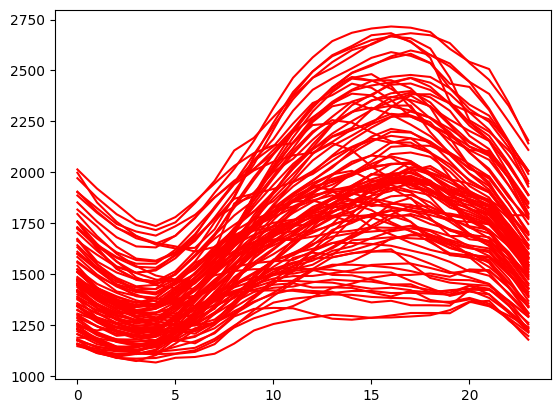

time: 955 ms (started: 2023-11-28 07:08:24 +00:00)


In [ ]:
for i in range(len(Yt)):
    plt.plot(Yt[i], color='r')
plt.show()

Training Time : 00:02:00
4/4 [==============================] - 1s 12ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 66ms/step

Single Day Inference Time 156.11004829406738 ms

Evaluation metric results:-

MAPE is : 4.836855083703995
R2 is : 0.8919483039935198


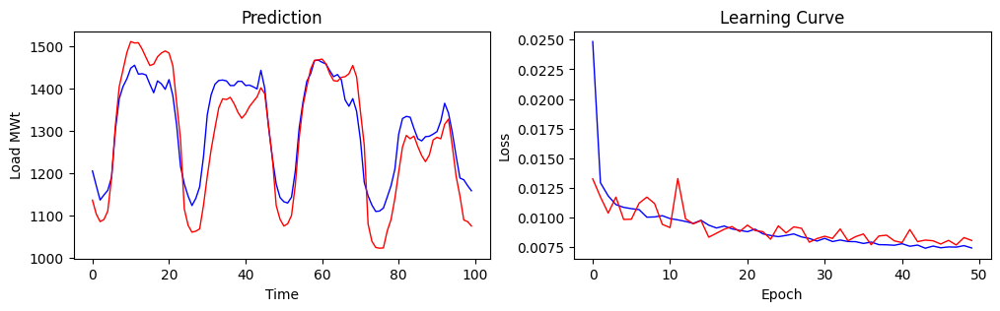



[[1135.733154296875], [1102.872802734375], [1084.9952392578125], [1089.853759765625], [1109.842041015625], [1189.805908203125], [1312.5157470703125], [1404.475830078125], [1444.7052001953125], [1485.1048583984375], [1511.0694580078125], [1507.68408203125], [1508.305908203125], [1492.8543701171875], [1473.11962890625], [1454.3817138671875], [1457.6676025390625], [1475.05322265625], [1483.9271240234375], [1488.8189697265625], [1483.8885498046875], [1453.824462890625], [1364.80615234375], [1279.538330078125], [1114.7135009765625], [1075.9144287109375], [1059.8876953125], [1062.3104248046875], [1067.654541015625], [1122.9334716796875], [1192.6212158203125], [1255.056884765625], [1306.1478271484375], [1354.35205078125], [1375.5562744140625], [1373.8570556640625], [1378.9803466796875], [1364.1131591796875], [1343.6995849609375], [1329.575439453125], [1340.0552978515625], [1356.9925537109375], [1368.8538818359375], [1380.0982666015625], [1401.6400146484375], [1387.445556640625], [1312.02490

In [ ]:
# CNNLSTM+GAF

seq_inputs = layers.Input(shape=(LOOKBACK,1))
img_inputs = layers.Input(shape=(LOOKBACK,LOOKBACK,1))

x1 = layers.LSTM(50, return_sequences=False)(seq_inputs)
x2 = layers.Convolution2D(filters=20, kernel_size=7, padding='valid')(img_inputs)
x2 = layers.GlobalAvgPool2D()(x2)
c1 = layers.Concatenate(axis=1)([x1,x2])
outputs = layers.Dense(24, activation='linear')(c1)

model = Model([seq_inputs,img_inputs], outputs)
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit([Xs,X_img], Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict([Xts,Xt_img])
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict([Xts[:1],Xt_img[:1]])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:43
4/4 [==============================] - 0s 5ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 77ms/step

Single Day Inference Time 229.6273708343506 ms

Evaluation metric results:-

MAPE is : 6.2357839196920395
R2 is : 0.8437217735551432


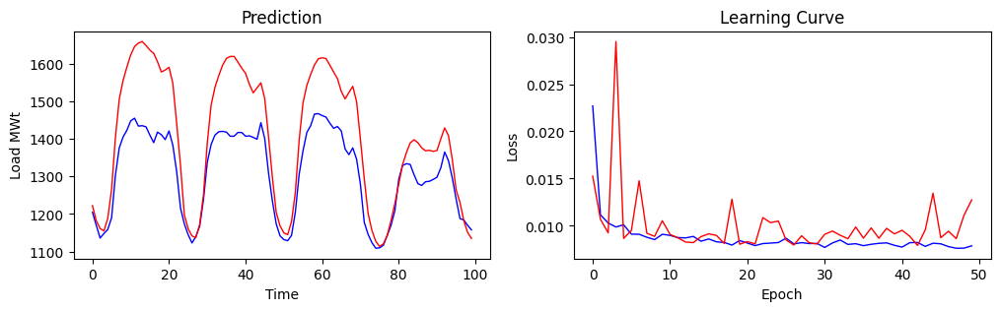



[[1222.25048828125], [1182.4208984375], [1161.4093017578125], [1155.057373046875], [1188.2569580078125], [1266.05908203125], [1403.8209228515625], [1505.14990234375], [1555.4742431640625], [1591.08056640625], [1623.51513671875], [1645.6912841796875], [1654.7650146484375], [1658.9044189453125], [1648.3880615234375], [1636.07373046875], [1627.47265625], [1605.0252685546875], [1578.0120849609375], [1583.0653076171875], [1590.5662841796875], [1547.7525634765625], [1441.3193359375], [1329.90234375], [1197.6927490234375], [1160.8590087890625], [1141.8546142578125], [1137.0626220703125], [1171.9071044921875], [1249.94677734375], [1389.4658203125], [1490.1053466796875], [1537.193359375], [1568.443115234375], [1595.9222412109375], [1614.22412109375], [1619.1796875], [1619.310302734375], [1604.239501953125], [1588.18408203125], [1574.19677734375], [1545.0360107421875], [1522.45556640625], [1535.8446044921875], [1549.0361328125], [1507.5240478515625], [1405.0479736328125], [1298.0693359375], [1

In [ ]:
# 1. MLP

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Flatten()(inputs)
x = layers.Dense(50, activation="relu")(x)
x = layers.Dense(50, activation="relu")(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="MLP")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:03:30
4/4 [==============================] - 2s 12ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 35ms/step

Single Day Inference Time 98.52933883666992 ms

Evaluation metric results:-

MAPE is : 5.4481226950883865
R2 is : 0.8672565520806456


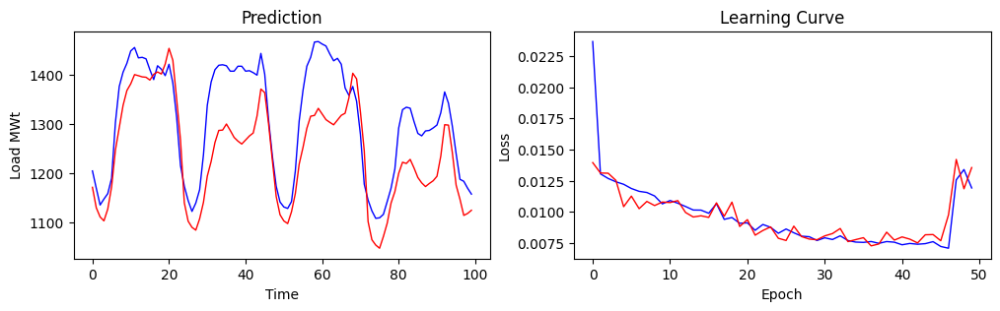



[[1171.7791748046875], [1130.3800048828125], [1111.8238525390625], [1103.8519287109375], [1127.6490478515625], [1172.5396728515625], [1247.1815185546875], [1292.734375], [1337.7457275390625], [1367.892822265625], [1381.3306884765625], [1400.060302734375], [1397.872314453125], [1395.48046875], [1394.663818359375], [1389.0091552734375], [1400.67041015625], [1405.4766845703125], [1401.2703857421875], [1421.3270263671875], [1453.1839599609375], [1429.0948486328125], [1349.9105224609375], [1267.9097900390625], [1140.3199462890625], [1103.1920166015625], [1090.748291015625], [1085.06494140625], [1108.06689453125], [1141.519287109375], [1194.449462890625], [1224.0482177734375], [1262.5411376953125], [1287.0260009765625], [1287.6817626953125], [1300.017333984375], [1286.9423828125], [1272.931640625], [1265.38134765625], [1259.471435546875], [1267.5823974609375], [1275.805419921875], [1281.8212890625], [1316.504150390625], [1370.8345947265625], [1363.5135498046875], [1300.9010009765625], [122

In [ ]:
# 2. LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.LSTM(50, return_sequences=True)(inputs)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)
model = Model(inputs=inputs, outputs = outputs, name="LSTM")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')
# model.summary()

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:02:31
4/4 [==============================] - 1s 10ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 56ms/step

Single Day Inference Time 136.9342803955078 ms

Evaluation metric results:-

MAPE is : 6.8086035549640656
R2 is : 0.8385638154200834


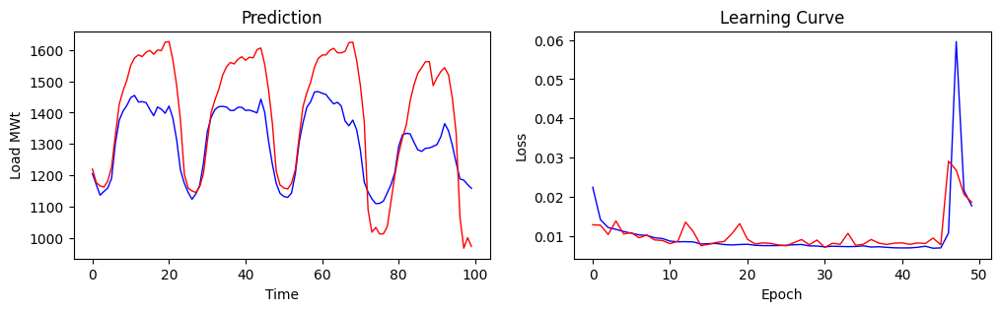



[[1219.5919189453125], [1176.24462890625], [1165.479248046875], [1162.0050048828125], [1181.3818359375], [1225.9569091796875], [1329.011474609375], [1427.020263671875], [1470.0699462890625], [1503.9161376953125], [1551.1220703125], [1574.7593994140625], [1584.4681396484375], [1579.220458984375], [1593.04638671875], [1598.870361328125], [1586.8428955078125], [1600.4324951171875], [1598.260498046875], [1625.2230224609375], [1627.205810546875], [1569.2705078125], [1486.697998046875], [1374.4468994140625], [1203.272216796875], [1158.8074951171875], [1149.9632568359375], [1144.624755859375], [1162.2933349609375], [1205.3173828125], [1305.6485595703125], [1399.7791748046875], [1440.947509765625], [1474.05712890625], [1519.3494873046875], [1545.948486328125], [1560.335693359375], [1555.61376953125], [1570.5316162109375], [1578.6080322265625], [1567.3966064453125], [1577.0826416015625], [1575.12841796875], [1601.513671875], [1606.6363525390625], [1554.1328125], [1473.1746826171875], [1365.98

In [ ]:
# 3. GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.GRU(50, return_sequences=True)(inputs)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="GRU")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:08
4/4 [==============================] - 2s 8ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 101ms/step

Single Day Inference Time 248.5496997833252 ms

Evaluation metric results:-

MAPE is : 5.708508938550949
R2 is : 0.859791306659819


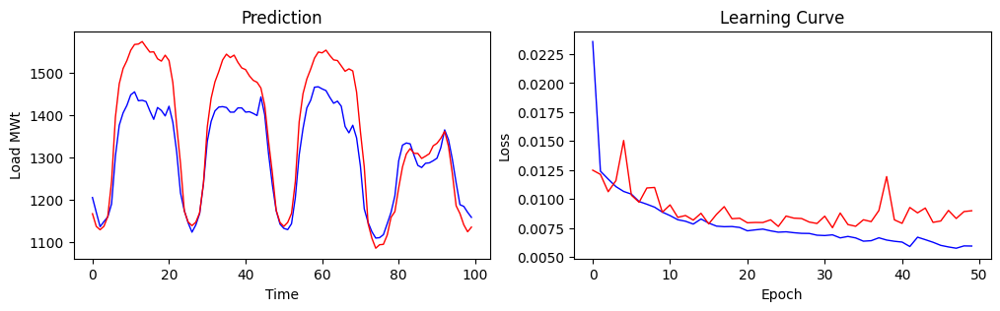



[[1166.671142578125], [1136.6834716796875], [1128.7470703125], [1136.902587890625], [1160.0347900390625], [1243.410888671875], [1395.1483154296875], [1474.1058349609375], [1510.023193359375], [1528.990966796875], [1553.3577880859375], [1567.1231689453125], [1568.13134765625], [1574.0277099609375], [1561.2117919921875], [1549.028564453125], [1549.7864990234375], [1533.2994384765625], [1527.71728515625], [1541.77685546875], [1529.08984375], [1476.9970703125], [1375.7496337890625], [1285.634033203125], [1173.1182861328125], [1146.934326171875], [1138.412109375], [1146.6492919921875], [1168.9642333984375], [1238.962890625], [1372.1859130859375], [1439.804931640625], [1478.6673583984375], [1502.958251953125], [1530.4951171875], [1544.205078125], [1536.10888671875], [1541.8992919921875], [1524.8370361328125], [1511.6802978515625], [1507.6820068359375], [1492.87353515625], [1482.2010498046875], [1477.7166748046875], [1464.1099853515625], [1422.7523193359375], [1338.064453125], [1262.4559326

In [ ]:
# 4. CNN-LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=15, padding="valid")(inputs)
x = layers.MaxPool1D(7)(x)
x = layers.LSTM(64, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:05
4/4 [==============================] - 1s 7ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 62ms/step

Single Day Inference Time 149.245023727417 ms

Evaluation metric results:-

MAPE is : 6.172509491443634
R2 is : 0.8393079438602022


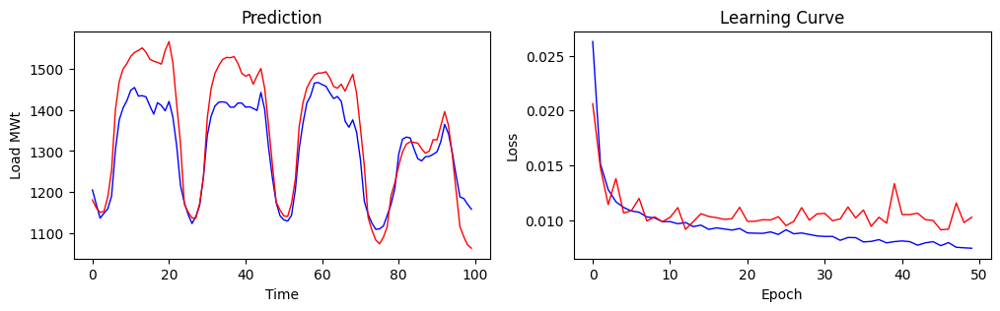



[[1180.659912109375], [1161.2791748046875], [1150.1768798828125], [1152.4814453125], [1187.8514404296875], [1253.2679443359375], [1400.537109375], [1469.7115478515625], [1500.111083984375], [1513.5111083984375], [1530.79541015625], [1540.51025390625], [1545.3914794921875], [1551.6484375], [1540.970947265625], [1523.76513671875], [1519.3203125], [1516.1376953125], [1511.9561767578125], [1545.5670166015625], [1567.085205078125], [1515.783447265625], [1415.095947265625], [1317.922607421875], [1170.7169189453125], [1150.83935546875], [1136.7984619140625], [1136.1248779296875], [1171.5582275390625], [1237.50439453125], [1380.9803466796875], [1452.7508544921875], [1489.576171875], [1508.59375], [1523.4024658203125], [1528.28662109375], [1527.6983642578125], [1530.161376953125], [1513.926513671875], [1489.824462890625], [1482.542236328125], [1486.7540283203125], [1463.065673828125], [1483.4755859375], [1501.337158203125], [1452.534912109375], [1362.411865234375], [1267.8072509765625], [1175

In [ ]:
# 5. CNN-GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(12, kernel_size=5, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

h : (None, 100), c : (None, 100)
x : (None, None, 100)
d_outputs  : (None, None, 1)
hi : (None, 100), ci : (None, 100)
x : (None, None, 100), h : (None, 100), c : (None, 100)
d_outputs  : (None, None, 1)
Training Time : 00:01:39

Total Inference Time : 00:02:46

Single Day Inference Time 2104.2187213897705 ms

Evaluation metric results:-

MAPE is : 5.553066357970238
R2 is : 0.8667580281275065


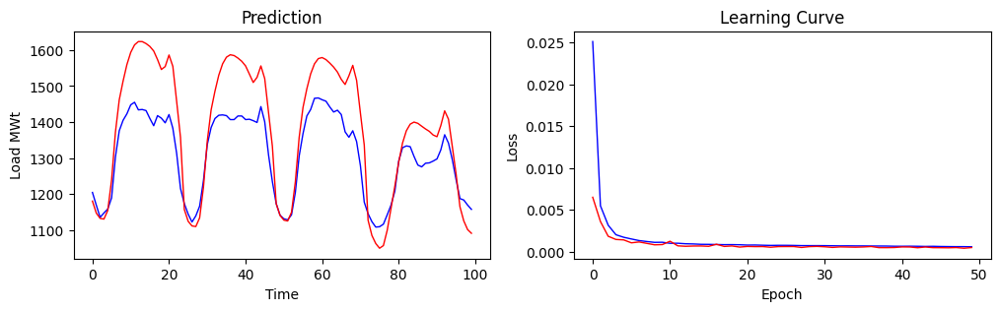



[[1180.9932861328125, 1147.8447265625, 1133.140869140625, 1131.1693115234375, 1155.1751708984375, 1239.7127685546875, 1371.8616943359375, 1461.7620849609375, 1513.705810546875, 1559.51416015625, 1593.298828125, 1614.2056884765625, 1623.3565673828125, 1623.2484130859375, 1617.798095703125, 1609.7999267578125, 1597.18017578125, 1573.4674072265625, 1545.85693359375, 1553.956298828125, 1586.1051025390625, 1554.6292724609375, 1456.9954833984375, 1357.6888427734375], [1157.6611328125, 1125.0712890625, 1112.1722412109375, 1110.4324951171875, 1134.6358642578125, 1219.675537109375, 1348.0452880859375, 1433.9061279296875, 1485.7103271484375, 1530.1187744140625, 1561.6402587890625, 1580.0263671875, 1586.720458984375, 1584.5155029296875, 1577.5589599609375, 1568.7064208984375, 1555.8592529296875, 1533.0509033203125, 1509.8870849609375, 1524.30078125, 1555.77001953125, 1520.7603759765625, 1426.513916015625, 1333.1552734375], [1173.8529052734375, 1141.4195556640625, 1128.2523193359375, 1125.867675

In [ ]:
# 6. ED-LSTM

n_units = 100

e_inputs = Input(shape=(None, 1))
d_inputs = Input(shape=(None, 1))

e_lstm = LSTM(n_units, return_state=True)
d_lstm = LSTM(n_units, return_sequences=True, return_state=True)
d_dense = Dense(1, activation='linear')

_, h, c = e_lstm(e_inputs)
e_states = [h, c]
print(f"h : {h.shape}, c : {c.shape}")
x, _, _ = d_lstm(d_inputs, initial_state=e_states)
print(f"x : {x.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")
model = Model([e_inputs, d_inputs], d_outputs)
model.compile(optimizer='adam', loss='mse')
# model.summary()

# for inference
e_model = Model(e_inputs, e_states)
# for initial decoder_state_inputs
hi = Input(shape=(n_units,))
ci = Input(shape=(n_units,))
d_states_i = [hi, ci]
print(f"hi : {hi.shape}, ci : {ci.shape}")
x, h, c = d_lstm(d_inputs, initial_state=d_states_i)
d_states = [h, c]
print(f"x : {x.shape}, h : {h.shape}, c : {c.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")

d_model = Model([d_inputs] + d_states_i, [d_outputs] + d_states)

def forecast(input_seq, encoder, decoder):
    state = encoder.predict(input_seq, verbose=0)
    # Generate empty target sequence of length 101 ie [[[0,0,0,0,.....,0]]].
    target_seq = np.zeros((1, 1, 1))
    output = []
    for t in range(24):
        yhat, h, c = decoder.predict([target_seq] + state, verbose=0)
        output.append(yhat[0,0,:]) # yhat : [[[a,b,c,d,...]]] -> yhat[0,0,:] : [a,b,c,d,...]
        state = [h, c]
        target_seq = yhat
    return np.array(output)

start_time = time.time()
history = model.fit([Xs, Xd], Ys, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Y_pred = []
for x in Xts:
    x = np.expand_dims(x, axis=0) # Inputs : (168, 1) -> Expand : (1, 168, 1)
    target = forecast(x, e_model, d_model)  # Output (24, 101)
#     target = one_hot_decode(target)
    target = scaler_load.inverse_transform(target.reshape(-1,1))
    target = target.squeeze(1)
    Y_pred.append(target)
Y_pred = np.array(Y_pred)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = forecast(np.expand_dims(Xts[0],axis=0), e_model, d_model)
print(f"\nSingle Day Inference Time {(time.time() - start_time)*1000} ms")

evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

# 6.EKPC

In [ ]:
path = "/content/drive/MyDrive/DATASETS/EKPC_hourly.csv"
dataset = pd.read_csv(path,index_col=['Datetime'],parse_dates=['Datetime'])
# n = round((len(dataset)/24)*0.8)*24
train = dataset.iloc[:-2568,:]
test = dataset.iloc[-2568:,:]
train = np.array(train.values)
test = np.array(test.values)

X, Y = reframe(data=train, lookback=LOOKBACK, lookahead=LOOKAHEAD)
Xt, Yt = reframe(data=test, lookback=LOOKBACK, lookahead=LOOKAHEAD)

# Image Conversion GADF
transformer = GramianAngularField(method='difference', overlapping=False, flatten=False)
X_img = transformer.transform(X).reshape(-1,LOOKBACK,LOOKBACK,1)
Xt_img = transformer.transform(Xt).reshape(-1,LOOKBACK,LOOKBACK,1)
print(f"X_img : {X_img.shape}, Xt_img : {Xt_img.shape}")

# Feature Scaling
scaler_load = MinMaxScaler(feature_range=(-1, 1))
Xs = scaler_load.fit_transform(X.reshape(-1,1)).reshape(-1,LOOKBACK,1)
Ys = scaler_load.transform(Y.reshape(-1,1)).reshape(-1,LOOKAHEAD)
Xts = scaler_load.transform(Xt.reshape(-1,1)).reshape(-1,LOOKBACK,1)
print(f"Xs : {Xs.shape}, Ys : {Ys.shape}")
print(f"Xts : {Xts.shape}, Yt : {Yt.shape}")

# Xd = np.insert(Ys, 0, 0, axis=1)
# Xd = np.delete(Xd,-1, axis=1)
# print(f"Xd : {Xd.shape}")

del dataset, train, test, X, Xt
gc.collect()

X_img : (1775, 168, 168, 1), Xt_img : (100, 168, 168, 1)
Xs : (1775, 168, 1), Ys : (1775, 24)
Xts : (100, 168, 1), Yt : (100, 24)


0

time: 10.1 s (started: 2023-12-17 10:04:16 +00:00)


In [ ]:
print(Yt.tolist())
print("\n")

[[1080.0, 1028.0, 1023.0, 1034.0, 1059.0, 1144.0, 1307.0, 1336.0, 1314.0, 1311.0, 1281.0, 1279.0, 1275.0, 1258.0, 1206.0, 1227.0, 1226.0, 1253.0, 1268.0, 1297.0, 1367.0, 1365.0, 1284.0, 1186.0], [1115.0, 1027.0, 1062.0, 1084.0, 1125.0, 1238.0, 1390.0, 1390.0, 1378.0, 1303.0, 1254.0, 1224.0, 1196.0, 1193.0, 1169.0, 1141.0, 1218.0, 1238.0, 1223.0, 1294.0, 1372.0, 1377.0, 1292.0, 1169.0], [1093.0, 1061.0, 1061.0, 1047.0, 1106.0, 1201.0, 1389.0, 1435.0, 1351.0, 1264.0, 1229.0, 1187.0, 1190.0, 1176.0, 1160.0, 1149.0, 1178.0, 1172.0, 1193.0, 1180.0, 1229.0, 1264.0, 1215.0, 1115.0], [1050.0, 1017.0, 995.0, 1008.0, 1056.0, 1078.0, 1165.0, 1222.0, 1268.0, 1252.0, 1232.0, 1204.0, 1188.0, 1149.0, 1140.0, 1101.0, 1148.0, 1166.0, 1158.0, 1140.0, 1233.0, 1279.0, 1225.0, 1173.0], [1138.0, 1128.0, 1122.0, 1155.0, 1196.0, 1264.0, 1313.0, 1426.0, 1469.0, 1414.0, 1320.0, 1245.0, 1187.0, 1182.0, 1128.0, 1095.0, 1043.0, 1149.0, 1180.0, 1222.0, 1323.0, 1364.0, 1279.0, 1186.0], [1130.0, 1142.0, 1160.0, 1189.

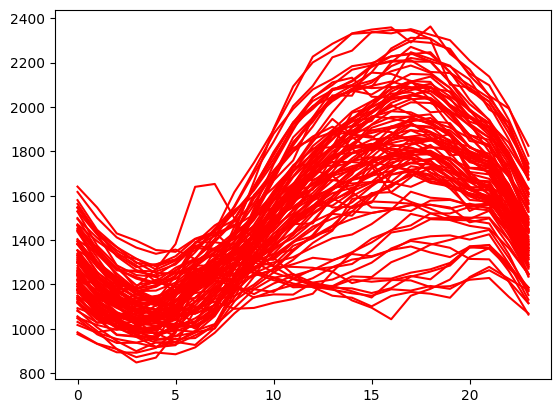

time: 271 ms (started: 2023-12-17 10:04:39 +00:00)


In [ ]:
for i in range(len(Yt)):
    plt.plot(Yt[i], color='r')
plt.show()

Training Time : 00:00:54
4/4 [==============================] - 1s 7ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 35ms/step

Single Day Inference Time 140.61641693115234 ms

Evaluation metric results:-

MAPE is : 5.244596675038338
R2 is : 0.90196703171705


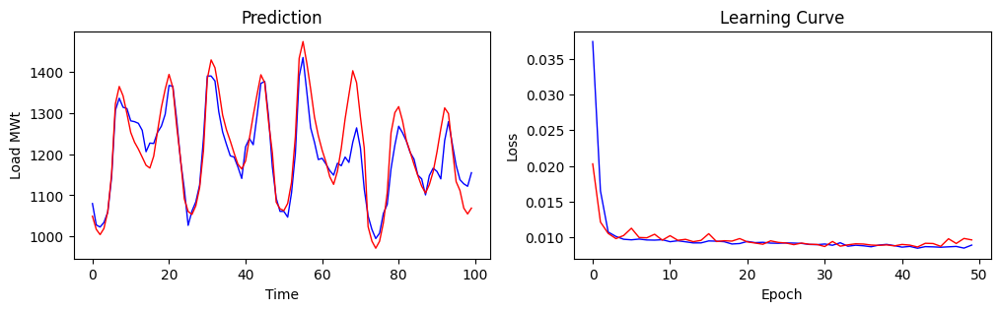



[[1049.355224609375], [1017.3340454101562], [1004.5304565429688], [1019.4676513671875], [1060.527099609375], [1151.1387939453125], [1322.6822509765625], [1364.531982421875], [1341.815185546875], [1298.9295654296875], [1252.9130859375], [1228.98095703125], [1212.3037109375], [1192.8084716796875], [1173.0938720703125], [1166.3360595703125], [1195.128662109375], [1255.62939453125], [1313.4847412109375], [1357.6654052734375], [1393.92431640625], [1362.2310791015625], [1268.3984375], [1189.5303955078125], [1091.477294921875], [1060.749267578125], [1053.587158203125], [1074.5804443359375], [1118.8475341796875], [1208.3294677734375], [1382.73974609375], [1429.169189453125], [1410.136474609375], [1356.90625], [1295.0145263671875], [1259.196533203125], [1232.123779296875], [1202.5682373046875], [1175.4853515625], [1164.075927734375], [1183.5169677734375], [1238.4532470703125], [1293.87255859375], [1345.045654296875], [1393.015380859375], [1373.470703125], [1279.2386474609375], [1203.139892578

In [ ]:
# CNNLSTM+GAF

seq_inputs = layers.Input(shape=(LOOKBACK,1))
img_inputs = layers.Input(shape=(LOOKBACK,LOOKBACK,1))

x1 = layers.LSTM(50, return_sequences=False)(seq_inputs)
x2 = layers.Convolution2D(filters=20, kernel_size=7, padding='valid')(img_inputs)
x2 = layers.GlobalAvgPool2D()(x2)
c1 = layers.Concatenate(axis=1)([x1,x2])
outputs = layers.Dense(24, activation='linear')(c1)

model = Model([seq_inputs,img_inputs], outputs)
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit([Xs,X_img], Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict([Xts,Xt_img])
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict([Xts[:1],Xt_img[:1]])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:17
4/4 [==============================] - 0s 3ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 32ms/step

Single Day Inference Time 85.16740798950195 ms

Evaluation metric results:-

MAPE is : 8.342216163873672
R2 is : 0.7990108803613188


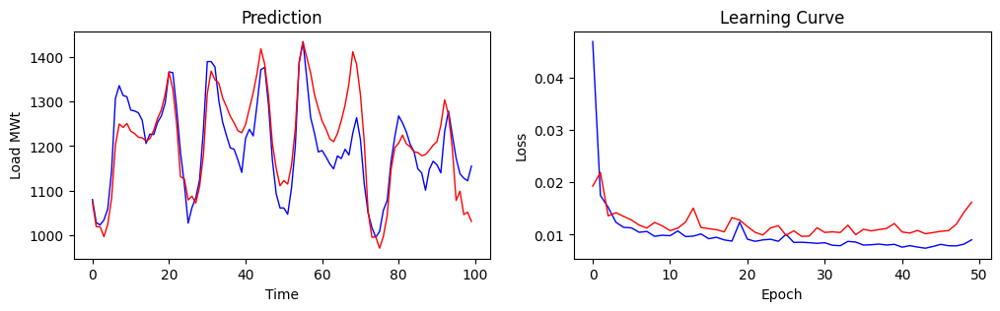



[[1073.751708984375], [1018.923828125], [1018.8619384765625], [996.4978637695312], [1024.3583984375], [1082.6083984375], [1202.3619384765625], [1249.765869140625], [1241.85302734375], [1250.93896484375], [1233.6864013671875], [1228.4156494140625], [1220.03564453125], [1218.609619140625], [1211.8914794921875], [1216.7928466796875], [1235.34912109375], [1262.010009765625], [1281.7978515625], [1316.3062744140625], [1366.0653076171875], [1327.70556640625], [1249.5902099609375], [1131.423583984375], [1126.6627197265625], [1079.175537109375], [1087.5303955078125], [1072.22216796875], [1109.8428955078125], [1181.452392578125], [1317.910400390625], [1368.6539306640625], [1349.0318603515625], [1341.7301025390625], [1308.642822265625], [1288.975830078125], [1267.1494140625], [1252.32470703125], [1234.5399169921875], [1230.0428466796875], [1248.888427734375], [1284.5133056640625], [1320.547607421875], [1363.78125], [1418.694580078125], [1384.0823974609375], [1312.9158935546875], [1205.857910156

In [ ]:
# 1. MLP

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Flatten()(inputs)
x = layers.Dense(100, activation="relu")(x)
x = layers.Dense(48, activation="relu")(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="MLP")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:57
4/4 [==============================] - 2s 19ms/step

Total Inference Time : 00:00:02
1/1 [==============================] - 0s 83ms/step

Single Day Inference Time 189.40377235412598 ms

Evaluation metric results:-

MAPE is : 5.936859175562859
R2 is : 0.8920364289005436


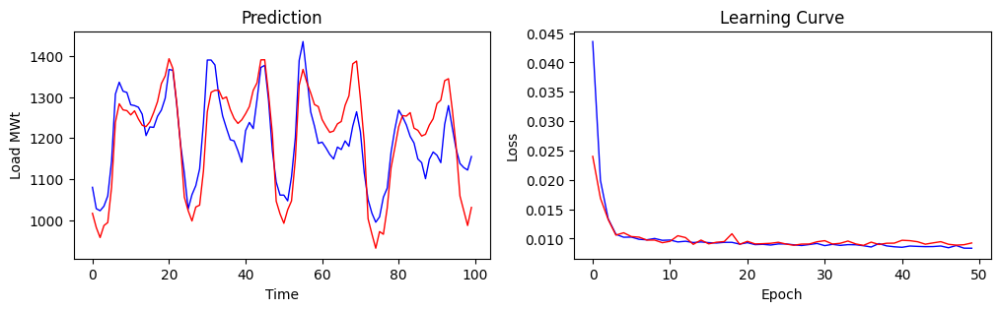



[[1016.6235961914062], [982.0918579101562], [957.62890625], [986.795166015625], [994.2299194335938], [1080.50537109375], [1238.544921875], [1283.4271240234375], [1268.5400390625], [1266.75439453125], [1256.3572998046875], [1266.1898193359375], [1246.596923828125], [1231.08203125], [1227.891357421875], [1239.3883056640625], [1262.364501953125], [1288.652099609375], [1332.5693359375], [1351.31396484375], [1393.2044677734375], [1369.66064453125], [1285.9609375], [1184.2672119140625], [1056.4591064453125], [1023.2728271484375], [997.9957885742188], [1032.03515625], [1036.516845703125], [1120.0972900390625], [1263.7147216796875], [1311.556884765625], [1316.195068359375], [1316.369384765625], [1295.5111083984375], [1300.0804443359375], [1269.4268798828125], [1247.83154296875], [1235.530029296875], [1244.2303466796875], [1259.2108154296875], [1276.7166748046875], [1316.184326171875], [1334.570556640625], [1390.408935546875], [1390.671875], [1307.0330810546875], [1210.65966796875], [1046.268

In [ ]:
# 2. LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.LSTM(50, return_sequences=True)(inputs)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)
model = Model(inputs=inputs, outputs = outputs, name="LSTM")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')
# model.summary()

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:37
4/4 [==============================] - 1s 6ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 23ms/step

Single Day Inference Time 61.91539764404297 ms

Evaluation metric results:-

MAPE is : 5.727837979793549
R2 is : 0.8923359391853878


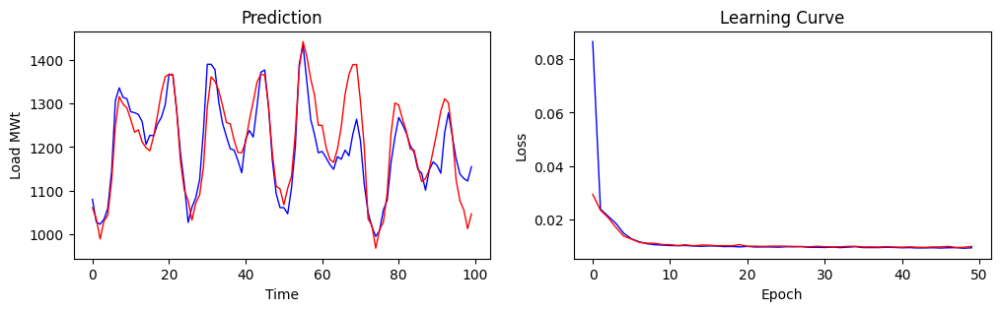



[[1061.0941162109375], [1035.71044921875], [989.123291015625], [1030.0057373046875], [1043.5045166015625], [1121.717041015625], [1248.8839111328125], [1315.9820556640625], [1298.362548828125], [1289.6890869140625], [1263.34033203125], [1234.1153564453125], [1239.596923828125], [1211.4095458984375], [1198.6099853515625], [1191.2718505859375], [1225.549560546875], [1273.853515625], [1325.072265625], [1361.4271240234375], [1366.983154296875], [1366.7513427734375], [1285.114990234375], [1166.7991943359375], [1101.108154296875], [1076.7708740234375], [1032.3673095703125], [1071.7548828125], [1090.2518310546875], [1155.022705078125], [1291.427001953125], [1361.1239013671875], [1350.9974365234375], [1329.810546875], [1294.603515625], [1256.560791015625], [1253.0794677734375], [1215.777587890625], [1187.609130859375], [1187.193115234375], [1211.378662109375], [1261.31103515625], [1304.4000244140625], [1349.0467529296875], [1367.53955078125], [1365.1170654296875], [1294.55224609375], [1185.38

In [ ]:
# 3. GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.GRU(100, return_sequences=True)(inputs)
x = layers.GRU(16, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="GRU")
model.compile(optimizer=Adam(learning_rate=0.001),loss=mse, metrics=[mse])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:44
4/4 [==============================] - 2s 10ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 104ms/step

Single Day Inference Time 272.59230613708496 ms

Evaluation metric results:-

MAPE is : 6.132832169532776
R2 is : 0.8759275889620416


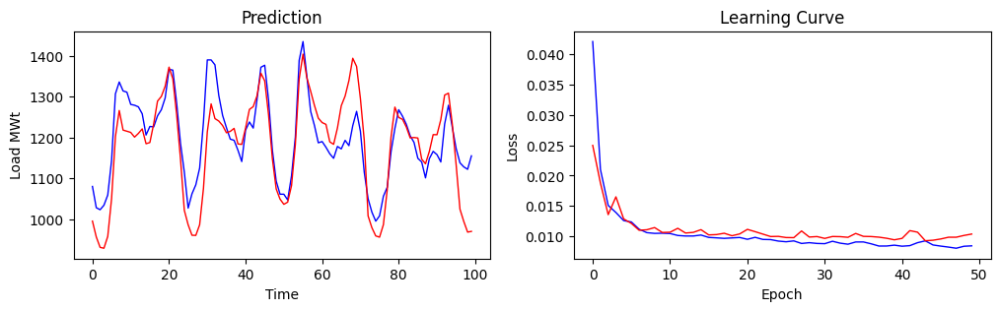



[[995.1078491210938], [956.3848266601562], [930.794677734375], [928.6605834960938], [957.6510620117188], [1050.379638671875], [1201.95947265625], [1266.069580078125], [1218.0543212890625], [1215.298583984375], [1212.4228515625], [1200.906494140625], [1209.9290771484375], [1221.0589599609375], [1184.7166748046875], [1187.640869140625], [1233.420654296875], [1289.1065673828125], [1300.587158203125], [1325.7220458984375], [1372.3018798828125], [1343.6448974609375], [1255.3494873046875], [1147.45361328125], [1021.5228271484375], [986.0692749023438], [960.4797973632812], [960.1345825195312], [986.0899658203125], [1075.48681640625], [1213.697509765625], [1282.3282470703125], [1246.2098388671875], [1240.27978515625], [1229.2486572265625], [1211.5679931640625], [1214.9443359375], [1222.3023681640625], [1184.1180419921875], [1183.10205078125], [1223.13134765625], [1268.6749267578125], [1275.5474853515625], [1302.383544921875], [1357.5565185546875], [1338.6285400390625], [1256.031494140625], [

In [ ]:
# 4. CNN-LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=7, padding="valid")(inputs)
x = layers.ReLU()(x)
x = layers.MaxPool1D(7)(x)
x = layers.LSTM(64, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:46
4/4 [==============================] - 1s 5ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 53ms/step

Single Day Inference Time 160.86363792419434 ms

Evaluation metric results:-

MAPE is : 6.73777163028717
R2 is : 0.8640235501039567


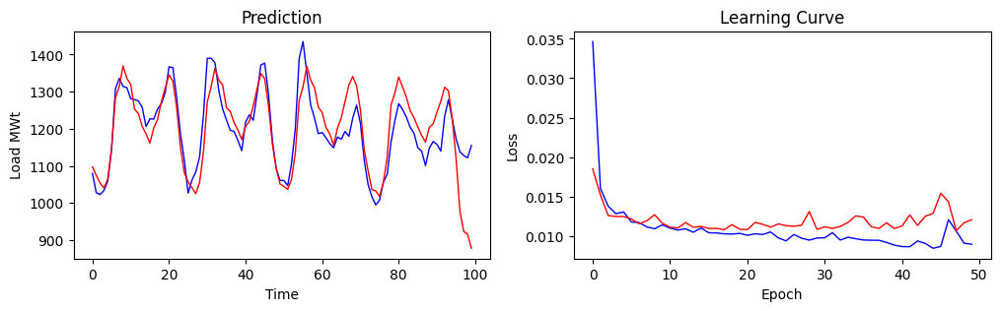



[[1097.535400390625], [1074.7244873046875], [1054.05419921875], [1040.5086669921875], [1064.4158935546875], [1148.7379150390625], [1283.2137451171875], [1313.7010498046875], [1369.6260986328125], [1335.7410888671875], [1319.3397216796875], [1252.8250732421875], [1241.009033203125], [1206.2940673828125], [1186.6629638671875], [1161.475830078125], [1202.12255859375], [1224.6806640625], [1272.5921630859375], [1309.374267578125], [1345.119384765625], [1328.9903564453125], [1257.40869140625], [1150.202392578125], [1082.3424072265625], [1056.72900390625], [1041.5560302734375], [1025.31396484375], [1055.893310546875], [1138.484375], [1271.542236328125], [1313.6015625], [1363.159912109375], [1331.010498046875], [1318.8001708984375], [1256.96142578125], [1247.0299072265625], [1216.704345703125], [1196.740478515625], [1171.44873046875], [1206.1422119140625], [1219.8956298828125], [1262.0648193359375], [1307.017333984375], [1349.1937255859375], [1335.100830078125], [1261.4930419921875], [1159.1

In [ ]:
# 5. CNN-GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=5, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2, batch_size=32, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

h : (None, 100), c : (None, 100)
x : (None, None, 100)
d_outputs  : (None, None, 1)
hi : (None, 100), ci : (None, 100)
x : (None, None, 100), h : (None, 100), c : (None, 100)
d_outputs  : (None, None, 1)
Training Time : 00:00:44

Total Inference Time : 00:02:31

Single Day Inference Time 2029.3266773223877 ms

Evaluation metric results:-

MAPE is : 6.419873237609863
R2 is : 0.8431818220239696


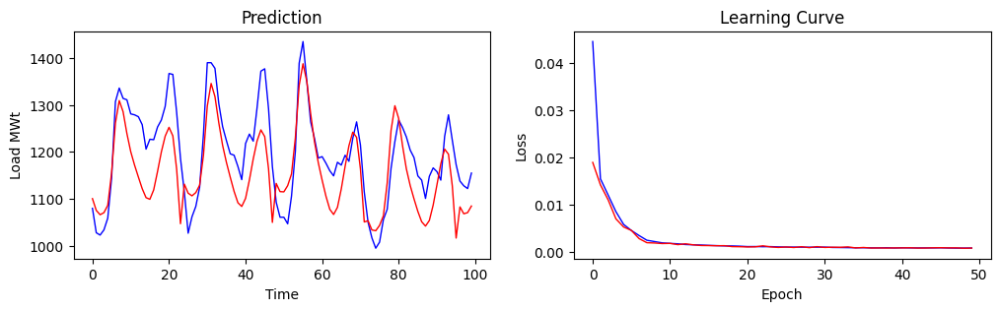



[[1100.580810546875, 1075.522216796875, 1066.3592529296875, 1070.752197265625, 1086.392333984375, 1155.1533203125, 1261.593994140625, 1309.31591796875, 1285.753662109375, 1239.166015625, 1200.6007080078125, 1171.954833984375, 1146.513427734375, 1121.80322265625, 1102.6585693359375, 1099.2210693359375, 1119.2862548828125, 1158.261474609375, 1200.032958984375, 1233.6029052734375, 1252.376220703125, 1234.2530517578125, 1162.9815673828125, 1047.2139892578125], [1131.4437255859375, 1112.2012939453125, 1106.5479736328125, 1113.465576171875, 1129.2369384765625, 1193.200439453125, 1297.739013671875, 1345.78466796875, 1317.8609619140625, 1262.223876953125, 1214.0506591796875, 1177.6202392578125, 1146.0723876953125, 1116.01123046875, 1091.806884765625, 1083.9549560546875, 1101.252685546875, 1140.2454833984375, 1185.0535888671875, 1223.3653564453125, 1246.919677734375, 1232.68603515625, 1164.08251953125, 1050.0145263671875], [1132.9678955078125, 1115.5283203125, 1115.00341796875, 1128.325805664

In [ ]:
# 6. ED-LSTM

n_units = 100

e_inputs = Input(shape=(None, 1))
d_inputs = Input(shape=(None, 1))

e_lstm = LSTM(n_units, return_state=True)
d_lstm = LSTM(n_units, return_sequences=True, return_state=True)
d_dense = Dense(1, activation='linear')

_, h, c = e_lstm(e_inputs)
e_states = [h, c]
print(f"h : {h.shape}, c : {c.shape}")
x, _, _ = d_lstm(d_inputs, initial_state=e_states)
print(f"x : {x.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")
model = Model([e_inputs, d_inputs], d_outputs)
model.compile(optimizer='adam', loss='mse')
# model.summary()

# for inference
e_model = Model(e_inputs, e_states)
# for initial decoder_state_inputs
hi = Input(shape=(n_units,))
ci = Input(shape=(n_units,))
d_states_i = [hi, ci]
print(f"hi : {hi.shape}, ci : {ci.shape}")
x, h, c = d_lstm(d_inputs, initial_state=d_states_i)
d_states = [h, c]
print(f"x : {x.shape}, h : {h.shape}, c : {c.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")

d_model = Model([d_inputs] + d_states_i, [d_outputs] + d_states)

def forecast(input_seq, encoder, decoder):
    state = encoder.predict(input_seq, verbose=0)
    # Generate empty target sequence of length 101 ie [[[0,0,0,0,.....,0]]].
    target_seq = np.zeros((1, 1, 1))
    output = []
    for t in range(24):
        yhat, h, c = decoder.predict([target_seq] + state, verbose=0)
        output.append(yhat[0,0,:]) # yhat : [[[a,b,c,d,...]]] -> yhat[0,0,:] : [a,b,c,d,...]
        state = [h, c]
        target_seq = yhat
    return np.array(output)

start_time = time.time()
history = model.fit([Xs, Xd], Ys, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Y_pred = []
for x in Xts:
    x = np.expand_dims(x, axis=0) # Inputs : (168, 1) -> Expand : (1, 168, 1)
    target = forecast(x, e_model, d_model)  # Output (24, 101)
#     target = one_hot_decode(target)
    target = scaler_load.inverse_transform(target.reshape(-1,1))
    target = target.squeeze(1)
    Y_pred.append(target)
Y_pred = np.array(Y_pred)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = forecast(np.expand_dims(Xts[0],axis=0), e_model, d_model)
print(f"\nSingle Day Inference Time {(time.time() - start_time)*1000} ms")

evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

# 7.FE

In [ ]:
path = "/content/drive/MyDrive/DATASETS/FE_hourly.csv"
dataset = pd.read_csv(path,index_col=['Datetime'],parse_dates=['Datetime'])
# n = round((len(dataset)/24)*0.8)*24
train = dataset.iloc[:-2568,:]
test = dataset.iloc[-2568:,:]
train = np.array(train.values)
test = np.array(test.values)

X, Y = reframe(data=train, lookback=LOOKBACK, lookahead=LOOKAHEAD)
Xt, Yt = reframe(data=test, lookback=LOOKBACK, lookahead=LOOKAHEAD)

# Image Conversion GADF
transformer = GramianAngularField(method='difference', overlapping=False, flatten=False)
X_img = transformer.transform(X).reshape(-1,LOOKBACK,LOOKBACK,1)
Xt_img = transformer.transform(Xt).reshape(-1,LOOKBACK,LOOKBACK,1)
print(f"X_img : {X_img.shape}, Xt_img : {Xt_img.shape}")

# Feature Scaling
scaler_load = MinMaxScaler(feature_range=(-1, 1))
Xs = scaler_load.fit_transform(X.reshape(-1,1)).reshape(-1,LOOKBACK,1)
Ys = scaler_load.transform(Y.reshape(-1,1)).reshape(-1,LOOKAHEAD)
Xts = scaler_load.transform(Xt.reshape(-1,1)).reshape(-1,LOOKBACK,1)
print(f"Xs : {Xs.shape}, Ys : {Ys.shape}")
print(f"Xts : {Xts.shape}, Yt : {Yt.shape}")

# Xd = np.insert(Ys, 0, 0, axis=1)
# Xd = np.delete(Xd,-1, axis=1)
# print(f"Xd : {Xd.shape}")

del dataset, train, test, X, Xt
gc.collect()

X_img : (2506, 168, 168, 1), Xt_img : (100, 168, 168, 1)
Xs : (2506, 168, 1), Ys : (2506, 24)
Xts : (100, 168, 1), Yt : (100, 24)


10634

time: 10.1 s (started: 2023-12-17 10:04:50 +00:00)


In [ ]:
print(Yt.tolist())
print("\n")

[[6144.0, 5979.0, 5885.0, 5870.0, 5983.0, 6348.0, 6964.0, 7318.0, 7460.0, 7595.0, 7725.0, 7634.0, 7617.0, 7654.0, 7536.0, 7473.0, 7389.0, 7313.0, 7292.0, 7307.0, 7545.0, 7510.0, 7123.0, 6736.0], [6456.0, 6293.0, 6200.0, 6246.0, 6365.0, 6711.0, 7312.0, 7578.0, 7548.0, 7533.0, 7511.0, 7423.0, 7369.0, 7365.0, 7200.0, 7110.0, 6999.0, 6917.0, 6836.0, 6870.0, 7146.0, 7203.0, 6781.0, 6437.0], [6189.0, 6043.0, 5900.0, 5993.0, 6100.0, 6436.0, 7015.0, 7328.0, 7431.0, 7472.0, 7455.0, 7396.0, 7336.0, 7301.0, 7154.0, 7080.0, 6984.0, 6885.0, 6763.0, 6698.0, 6895.0, 6901.0, 6531.0, 6133.0], [5902.0, 5808.0, 5665.0, 5648.0, 5702.0, 5811.0, 6045.0, 6322.0, 6695.0, 6863.0, 7018.0, 7029.0, 7017.0, 6984.0, 6894.0, 6859.0, 6852.0, 6807.0, 6771.0, 6745.0, 6918.0, 6926.0, 6763.0, 6450.0], [6242.0, 6099.0, 5991.0, 5974.0, 5925.0, 6082.0, 6177.0, 6290.0, 6535.0, 6675.0, 6740.0, 6564.0, 6510.0, 6400.0, 6346.0, 6218.0, 6195.0, 6235.0, 6239.0, 6325.0, 6696.0, 6814.0, 6581.0, 6344.0], [6194.0, 6152.0, 6172.0, 6175

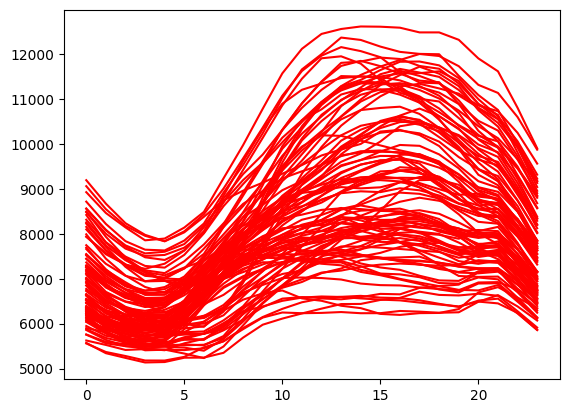

time: 1.15 s (started: 2023-11-27 07:43:17 +00:00)


In [ ]:
for i in range(len(Yt)):
    plt.plot(Yt[i], color='r')
plt.show()

Training Time : 00:01:28
4/4 [==============================] - 1s 12ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 28ms/step

Single Day Inference Time 101.1803150177002 ms

Evaluation metric results:-

MAPE is : 4.734299331903458
R2 is : 0.8918488769703831


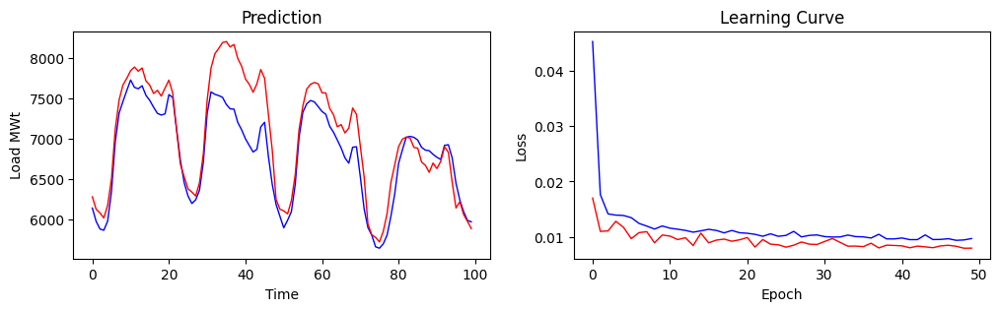



[[6282.34521484375], [6128.66796875], [6083.56494140625], [6021.29052734375], [6177.77490234375], [6505.6142578125], [7122.51513671875], [7480.228515625], [7663.42333984375], [7745.51025390625], [7839.52734375], [7885.12109375], [7833.82275390625], [7873.2734375], [7714.9189453125], [7660.57763671875], [7557.9306640625], [7597.6474609375], [7526.03662109375], [7627.232421875], [7723.630859375], [7562.6953125], [7110.88232421875], [6686.01953125], [6530.20361328125], [6380.5458984375], [6341.06591796875], [6293.0849609375], [6458.3525390625], [6813.30859375], [7478.7041015625], [7870.939453125], [8047.98388671875], [8114.74365234375], [8186.85986328125], [8199.658203125], [8132.66015625], [8163.34423828125], [7989.326171875], [7894.60546875], [7738.33642578125], [7671.0986328125], [7573.23388671875], [7678.8994140625], [7854.1533203125], [7746.60791015625], [7297.23486328125], [6859.9130859375], [6249.9521484375], [6130.22705078125], [6109.6669921875], [6072.2880859375], [6236.8769531

In [ ]:
# CNNLSTM+GAF

seq_inputs = layers.Input(shape=(LOOKBACK,1))
img_inputs = layers.Input(shape=(LOOKBACK,LOOKBACK,1))

x1 = layers.LSTM(50, return_sequences=False)(seq_inputs)
x2 = layers.Convolution2D(filters=20, kernel_size=7, padding='valid')(img_inputs)
x2 = layers.GlobalAvgPool2D()(x2)
c1 = layers.Concatenate(axis=1)([x1,x2])
outputs = layers.Dense(24, activation='linear')(c1)

model = Model([seq_inputs,img_inputs], outputs)
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit([Xs,X_img], Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict([Xts,Xt_img])
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict([Xts[:1],Xt_img[:1]])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:24
4/4 [==============================] - 0s 6ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 68ms/step

Single Day Inference Time 165.3456687927246 ms

Evaluation metric results:-

MAPE is : 5.267274379730225
R2 is : 0.8750823341043311


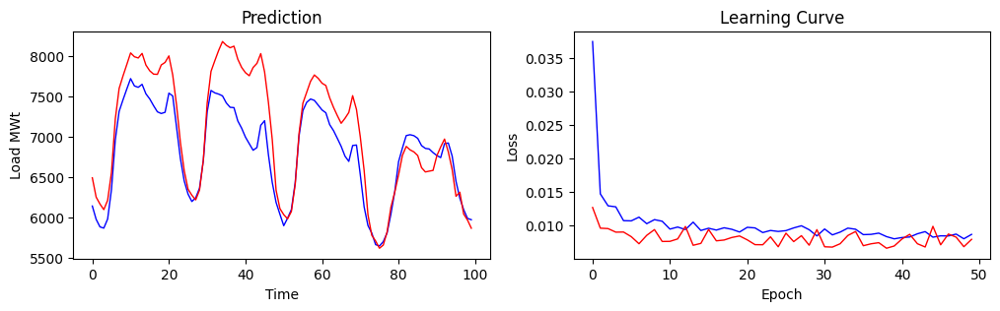



[[6494.37353515625], [6254.61376953125], [6168.767578125], [6099.31298828125], [6215.42724609375], [6560.40380859375], [7223.31689453125], [7602.49755859375], [7756.01318359375], [7898.86474609375], [8043.87548828125], [7996.2138671875], [7980.97412109375], [8037.75830078125], [7893.0400390625], [7821.88330078125], [7780.70703125], [7777.7509765625], [7894.07373046875], [7925.8388671875], [8006.69140625], [7770.37353515625], [7397.384765625], [6936.37939453125], [6583.32763671875], [6353.658203125], [6278.0771484375], [6220.34326171875], [6341.32275390625], [6713.5595703125], [7420.154296875], [7814.32763671875], [7947.58203125], [8075.06005859375], [8184.810546875], [8138.27685546875], [8108.2177734375], [8127.60107421875], [7965.951171875], [7864.14013671875], [7798.59619140625], [7760.59326171875], [7862.8291015625], [7913.763671875], [8035.30419921875], [7808.08837890625], [7430.09814453125], [6968.9130859375], [6341.19140625], [6112.32373046875], [6037.28271484375], [5985.134277

In [ ]:
# 1. MLP

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Flatten()(inputs)
x = layers.Dense(100, activation="relu")(x)
x = layers.Dense(100, activation="relu")(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="MLP")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:02:29
4/4 [==============================] - 1s 11ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 41ms/step

Single Day Inference Time 102.50663757324219 ms

Evaluation metric results:-

MAPE is : 5.42476512491703
R2 is : 0.8664367436319685


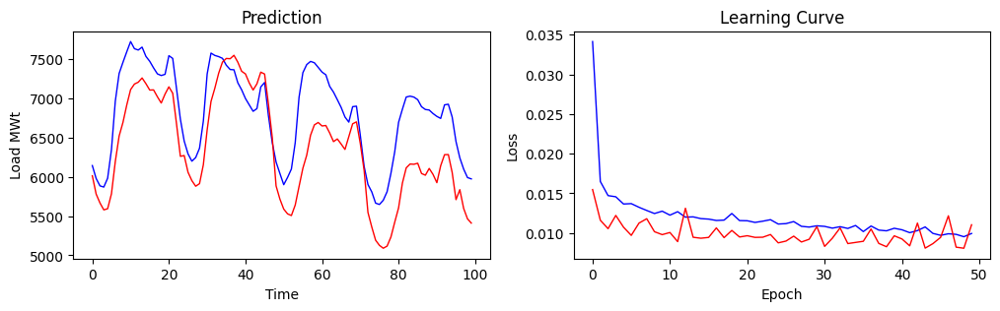



[[6014.08447265625], [5780.62255859375], [5666.9638671875], [5579.15869140625], [5593.7109375], [5784.30224609375], [6194.86083984375], [6520.38525390625], [6693.60546875], [6916.9580078125], [7112.46826171875], [7183.02392578125], [7206.720703125], [7260.8486328125], [7188.1171875], [7106.31396484375], [7108.8564453125], [7020.81103515625], [6941.3212890625], [7055.5625], [7147.8046875], [7065.70556640625], [6672.7041015625], [6261.8095703125], [6271.85107421875], [6058.7197265625], [5951.92578125], [5880.60986328125], [5913.42919921875], [6154.46630859375], [6599.693359375], [6960.7373046875], [7129.69189453125], [7320.79443359375], [7463.115234375], [7509.59130859375], [7505.88623046875], [7549.84228515625], [7463.03369140625], [7346.38671875], [7312.32763671875], [7196.7646484375], [7106.9912109375], [7186.40283203125], [7334.80224609375], [7311.04541015625], [6926.6328125], [6501.9072265625], [5884.5556640625], [5716.36962890625], [5589.013671875], [5528.4619140625], [5506.78271

In [ ]:
# 2. LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.LSTM(50, return_sequences=True)(inputs)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)
model = Model(inputs=inputs, outputs = outputs, name="LSTM")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')
# model.summary()

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:29
4/4 [==============================] - 1s 11ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 104ms/step

Single Day Inference Time 213.26708793640137 ms

Evaluation metric results:-

MAPE is : 5.0661601126194
R2 is : 0.8695197481137279


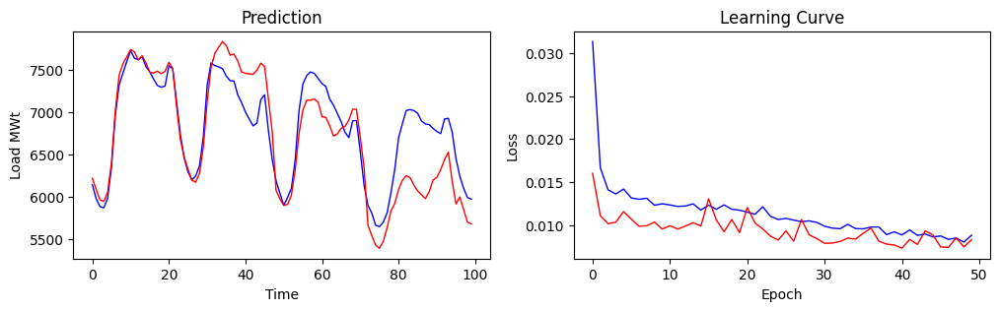



[[6220.1259765625], [6087.625], [5964.55029296875], [5946.4140625], [6054.7392578125], [6399.509765625], [7010.994140625], [7433.35107421875], [7570.80224609375], [7650.1025390625], [7736.77880859375], [7710.6494140625], [7612.68994140625], [7663.4169921875], [7580.2841796875], [7468.7431640625], [7459.88818359375], [7482.62939453125], [7451.55810546875], [7478.8544921875], [7586.9140625], [7512.04248046875], [7070.27685546875], [6677.9716796875], [6468.7236328125], [6325.490234375], [6195.888671875], [6172.7470703125], [6276.37451171875], [6588.3408203125], [7119.4287109375], [7524.056640625], [7690.220703125], [7765.03955078125], [7830.95849609375], [7780.51123046875], [7669.5498046875], [7682.953125], [7602.0361328125], [7471.439453125], [7455.67578125], [7450.47900390625], [7444.44287109375], [7493.0185546875], [7576.09716796875], [7537.81298828125], [7154.62744140625], [6764.25439453125], [6075.49853515625], [5975.74951171875], [5899.32470703125], [5911.0341796875], [6020.043457

In [ ]:
# 3. GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.GRU(50, return_sequences=True)(inputs)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="GRU")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:37
4/4 [==============================] - 1s 22ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 56ms/step

Single Day Inference Time 119.77458000183105 ms

Evaluation metric results:-

MAPE is : 5.336625501513481
R2 is : 0.8464713876122194


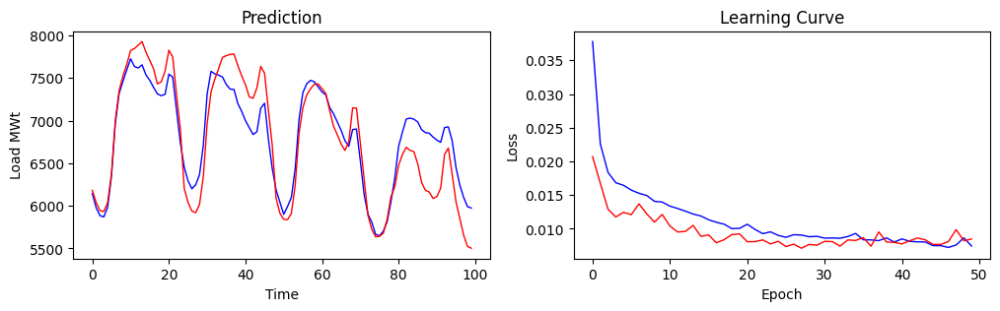



[[6182.193359375], [6039.89208984375], [5942.42822265625], [5934.1435546875], [6037.93115234375], [6372.45849609375], [7001.28466796875], [7350.80322265625], [7523.18994140625], [7660.16357421875], [7822.33203125], [7844.98876953125], [7884.92236328125], [7926.8818359375], [7802.77490234375], [7705.923828125], [7607.7294921875], [7430.08642578125], [7454.58642578125], [7579.45654296875], [7825.5439453125], [7745.681640625], [7299.0498046875], [6897.70166015625], [6208.74462890625], [6040.029296875], [5939.15380859375], [5919.423828125], [6015.8310546875], [6344.86572265625], [6966.78271484375], [7332.48388671875], [7486.87451171875], [7610.55908203125], [7741.53955078125], [7761.4150390625], [7775.72900390625], [7781.29931640625], [7646.7548828125], [7524.78955078125], [7421.517578125], [7277.5322265625], [7261.83349609375], [7385.9541015625], [7635.19970703125], [7553.4521484375], [7121.61474609375], [6710.48974609375], [6090.6689453125], [5913.31591796875], [5841.2451171875], [5837

In [ ]:
# 4. CNN-LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=5, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:46
4/4 [==============================] - 1s 5ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 76ms/step

Single Day Inference Time 184.6606731414795 ms

Evaluation metric results:-

MAPE is : 5.487426742911339
R2 is : 0.8454368311203682


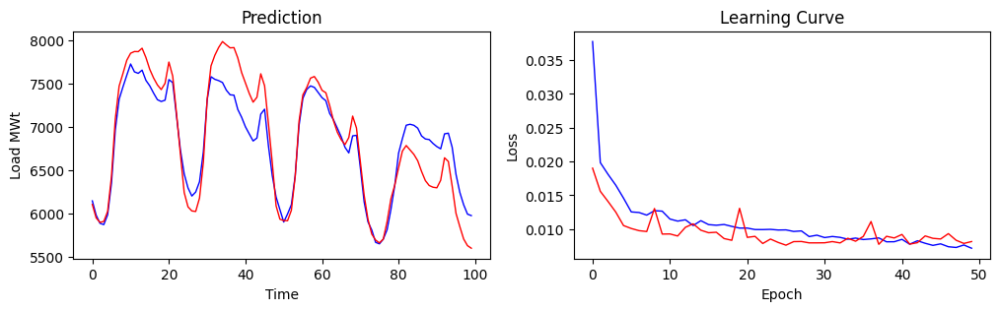



[[6102.9345703125], [5947.28759765625], [5895.7041015625], [5906.95361328125], [6022.43603515625], [6424.8837890625], [7089.6484375], [7469.46728515625], [7614.8515625], [7768.03125], [7849.5126953125], [7869.06787109375], [7868.01806640625], [7907.16064453125], [7800.11083984375], [7663.40478515625], [7563.96484375], [7483.16064453125], [7429.6123046875], [7501.75927734375], [7747.70849609375], [7584.73046875], [7148.03955078125], [6688.66796875], [6240.35107421875], [6074.19873046875], [6027.72509765625], [6021.689453125], [6176.70751953125], [6589.8662109375], [7318.13330078125], [7702.70263671875], [7825.52587890625], [7916.0], [7984.1572265625], [7946.14990234375], [7911.37255859375], [7914.38330078125], [7795.1748046875], [7625.91455078125], [7505.26171875], [7384.19775390625], [7284.16259765625], [7341.1962890625], [7611.73095703125], [7473.4775390625], [7036.7822265625], [6586.876953125], [6087.20068359375], [5932.2978515625], [5916.54736328125], [5915.1064453125], [6035.9433

In [ ]:
# 5. CNN-GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=5, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

h : (None, 100), c : (None, 100)
x : (None, None, 100)
d_outputs  : (None, None, 1)
hi : (None, 100), ci : (None, 100)
x : (None, None, 100), h : (None, 100), c : (None, 100)
d_outputs  : (None, None, 1)
Training Time : 00:00:57

Total Inference Time : 00:04:20

Single Day Inference Time 2427.5035858154297 ms

Evaluation metric results:-

MAPE is : 5.336863175034523
R2 is : 0.8539276871536811


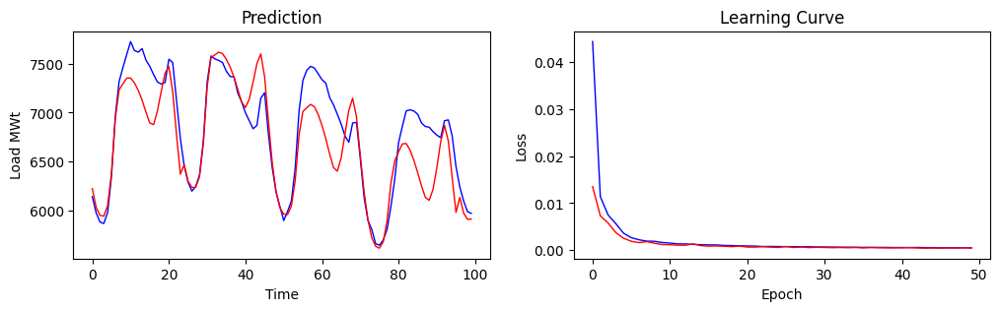



[[6225.22802734375, 6033.97705078125, 5953.35302734375, 5945.10888671875, 6052.77197265625, 6383.61865234375, 6939.29296875, 7232.9140625, 7295.1708984375, 7352.171875, 7353.74462890625, 7303.693359375, 7227.14404296875, 7128.25732421875, 7006.2998046875, 6894.306640625, 6878.06396484375, 7016.2099609375, 7217.5615234375, 7403.67041015625, 7469.39208984375, 7211.07275390625, 6773.306640625, 6373.546875], [6471.349609375, 6301.7578125, 6238.0537109375, 6238.98046875, 6347.40576171875, 6685.4560546875, 7265.18896484375, 7561.763671875, 7588.66552734375, 7616.66455078125, 7602.8876953125, 7544.591796875, 7464.279296875, 7363.732421875, 7237.001953125, 7107.7890625, 7051.9443359375, 7138.90234375, 7313.08349609375, 7500.77001953125, 7599.49462890625, 7367.18359375, 6913.10888671875, 6487.78857421875], [6193.33056640625, 6030.47412109375, 5964.8896484375, 5960.90673828125, 6046.95263671875, 6310.1455078125, 6772.556640625, 7011.90087890625, 7049.60888671875, 7084.2705078125, 7061.81298828

In [ ]:
# 6. ED-LSTM

n_units = 100

e_inputs = Input(shape=(None, 1))
d_inputs = Input(shape=(None, 1))

e_lstm = LSTM(n_units, return_state=True)
d_lstm = LSTM(n_units, return_sequences=True, return_state=True)
d_dense = Dense(1, activation='linear')

_, h, c = e_lstm(e_inputs)
e_states = [h, c]
print(f"h : {h.shape}, c : {c.shape}")
x, _, _ = d_lstm(d_inputs, initial_state=e_states)
print(f"x : {x.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")
model = Model([e_inputs, d_inputs], d_outputs)
model.compile(optimizer='adam', loss='mse')
# model.summary()

# for inference
e_model = Model(e_inputs, e_states)
# for initial decoder_state_inputs
hi = Input(shape=(n_units,))
ci = Input(shape=(n_units,))
d_states_i = [hi, ci]
print(f"hi : {hi.shape}, ci : {ci.shape}")
x, h, c = d_lstm(d_inputs, initial_state=d_states_i)
d_states = [h, c]
print(f"x : {x.shape}, h : {h.shape}, c : {c.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")

d_model = Model([d_inputs] + d_states_i, [d_outputs] + d_states)

def forecast(input_seq, encoder, decoder):
    state = encoder.predict(input_seq, verbose=0)
    # Generate empty target sequence of length 101 ie [[[0,0,0,0,.....,0]]].
    target_seq = np.zeros((1, 1, 1))
    output = []
    for t in range(24):
        yhat, h, c = decoder.predict([target_seq] + state, verbose=0)
        output.append(yhat[0,0,:]) # yhat : [[[a,b,c,d,...]]] -> yhat[0,0,:] : [a,b,c,d,...]
        state = [h, c]
        target_seq = yhat
    return np.array(output)

start_time = time.time()
history = model.fit([Xs, Xd], Ys, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Y_pred = []
for x in Xts:
    x = np.expand_dims(x, axis=0) # Inputs : (168, 1) -> Expand : (1, 168, 1)
    target = forecast(x, e_model, d_model)  # Output (24, 101)
#     target = one_hot_decode(target)
    target = scaler_load.inverse_transform(target.reshape(-1,1))
    target = target.squeeze(1)
    Y_pred.append(target)
Y_pred = np.array(Y_pred)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = forecast(np.expand_dims(Xts[0],axis=0), e_model, d_model)
print(f"\nSingle Day Inference Time {(time.time() - start_time)*1000} ms")

evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

# 8.NI

In [ ]:
path = "/content/drive/MyDrive/DATASETS/NI_hourly.csv"
dataset = pd.read_csv(path,index_col=['Datetime'],parse_dates=['Datetime'])
# n = round((len(dataset)/24)*0.8)*24
train = dataset.iloc[:-2568,:]
test = dataset.iloc[-2568:,:]
train = np.array(train.values)
test = np.array(test.values)

X, Y = reframe(data=train, lookback=LOOKBACK, lookahead=LOOKAHEAD)
Xt, Yt = reframe(data=test, lookback=LOOKBACK, lookahead=LOOKAHEAD)

# Image Conversion GADF
transformer = GramianAngularField(method='difference', overlapping=False, flatten=False)
X_img = transformer.transform(X).reshape(-1,LOOKBACK,LOOKBACK,1)
Xt_img = transformer.transform(Xt).reshape(-1,LOOKBACK,LOOKBACK,1)
print(f"X_img : {X_img.shape}, Xt_img : {Xt_img.shape}")

# Feature Scaling
scaler_load = MinMaxScaler(feature_range=(-1, 1))
Xs = scaler_load.fit_transform(X.reshape(-1,1)).reshape(-1,LOOKBACK,1)
Ys = scaler_load.transform(Y.reshape(-1,1)).reshape(-1,LOOKAHEAD)
Xts = scaler_load.transform(Xt.reshape(-1,1)).reshape(-1,LOOKBACK,1)
print(f"Xs : {Xs.shape}, Ys : {Ys.shape}")
print(f"Xts : {Xts.shape}, Yt : {Yt.shape}")

# Xd = np.insert(Ys, 0, 0, axis=1)
# Xd = np.delete(Xd,-1, axis=1)
# print(f"Xd : {Xd.shape}")

del dataset, train, test, X, Xt
gc.collect()

X_img : (2322, 168, 168, 1), Xt_img : (100, 168, 168, 1)
Xs : (2322, 168, 1), Ys : (2322, 24)
Xts : (100, 168, 1), Yt : (100, 24)


0

time: 1.59 s (started: 2023-12-17 10:05:17 +00:00)


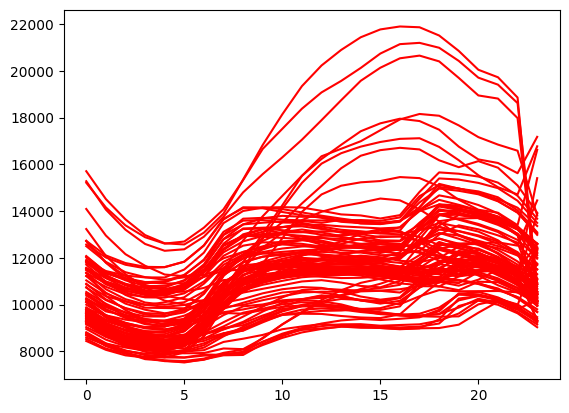

time: 299 ms (started: 2023-12-17 10:05:30 +00:00)


In [ ]:
for i in range(len(Yt)):
    plt.plot(Yt[i], color='r')
plt.show()

Training Time : 00:01:03
4/4 [==============================] - 1s 13ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 94ms/step

Single Day Inference Time 245.03779411315918 ms

Evaluation metric results:-

MAPE is : 5.15170656144619
R2 is : 0.8165239863468363


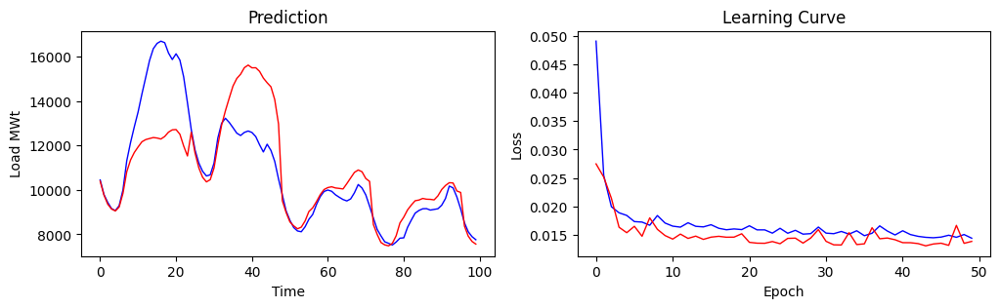



[[10395.6875], [9766.5009765625], [9354.0810546875], [9140.4296875], [9055.59765625], [9232.80859375], [9847.6533203125], [10820.171875], [11351.6318359375], [11691.91015625], [11941.2998046875], [12172.7802734375], [12271.908203125], [12319.0341796875], [12363.1162109375], [12341.70703125], [12296.853515625], [12411.60546875], [12606.0751953125], [12710.6796875], [12723.083984375], [12514.587890625], [11984.2431640625], [11532.9013671875], [12601.6162109375], [11666.5224609375], [10994.8603515625], [10570.6552734375], [10365.232421875], [10464.3115234375], [10991.94140625], [12012.8076171875], [12923.1728515625], [13568.4169921875], [14136.787109375], [14684.716796875], [15025.642578125], [15216.7744140625], [15513.7109375], [15629.6162109375], [15505.7900390625], [15509.859375], [15347.1416015625], [15043.4912109375], [14833.1201171875], [14650.201171875], [14074.5068359375], [12973.595703125], [9516.8349609375], [8985.806640625], [8560.08984375], [8382.548828125], [8250.6884765625

In [ ]:
# CNNLSTM+GAF

seq_inputs = layers.Input(shape=(LOOKBACK,1))
img_inputs = layers.Input(shape=(LOOKBACK,LOOKBACK,1))

x1 = layers.LSTM(50, return_sequences=False)(seq_inputs)
x2 = layers.Convolution2D(filters=20, kernel_size=7, padding='valid')(img_inputs)
x2 = layers.GlobalAvgPool2D()(x2)
c1 = layers.Concatenate(axis=1)([x1,x2])
outputs = layers.Dense(24, activation='linear')(c1)

model = Model([seq_inputs,img_inputs], outputs)
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit([Xs,X_img], Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict([Xts,Xt_img])
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict([Xts[:1],Xt_img[:1]])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:20
4/4 [==============================] - 2s 14ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 100ms/step

Single Day Inference Time 216.25876426696777 ms

Evaluation metric results:-

MAPE is : 5.2157338708639145
R2 is : 0.8151605711507794


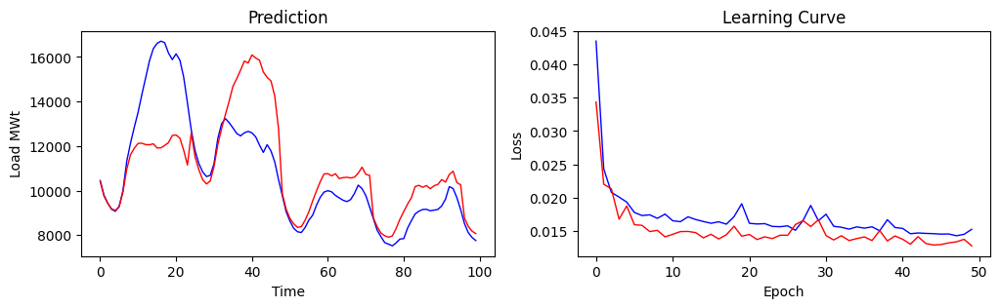



[[10420.310546875], [9756.521484375], [9420.3466796875], [9181.810546875], [9112.349609375], [9268.6708984375], [9936.369140625], [10955.8134765625], [11616.888671875], [11906.763671875], [12120.3916015625], [12124.130859375], [12064.9169921875], [12056.392578125], [12099.8330078125], [11910.8095703125], [11919.12109375], [12024.3583984375], [12155.5927734375], [12474.5302734375], [12498.490234375], [12350.9853515625], [11815.849609375], [11148.7197265625], [12580.865234375], [11520.189453125], [10935.16015625], [10493.005859375], [10299.4814453125], [10429.880859375], [11080.693359375], [12059.8955078125], [12784.0888671875], [13413.693359375], [14023.037109375], [14687.236328125], [15030.384765625], [15410.6220703125], [15812.5732421875], [15730.62109375], [16092.2275390625], [15949.126953125], [15849.296875], [15320.134765625], [15079.572265625], [14923.126953125], [14246.4580078125], [12777.888671875], [9860.6328125], [9170.5810546875], [8753.326171875], [8509.2001953125], [8347.

In [ ]:
# SELF-ATTN-WITH-LSTM

inputs=Input(shape=(LOOKBACK,1))
x = Dense(24)(inputs)
z = MultiHeadAttention(num_heads=4, key_dim=24)(x, x)
x = Add()([x,z])
y = LSTM(24, return_sequences=True)(inputs)
x = Concatenate()([x,y])
x = LSTM(24, return_sequences=False)(x)
model = Model(inputs=inputs, outputs=x)

model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:42
4/4 [==============================] - 0s 6ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 100ms/step

Single Day Inference Time 238.47532272338867 ms

Evaluation metric results:-

MAPE is : 8.914018422365189
R2 is : 0.6173061966209603


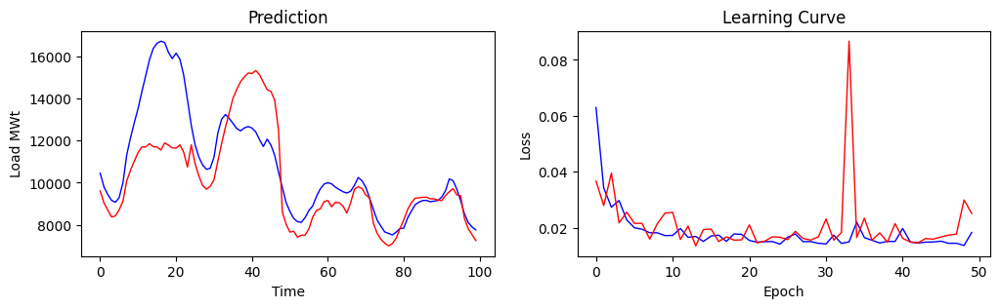



[[9610.00390625], [9039.6376953125], [8704.666015625], [8374.49609375], [8424.126953125], [8712.1689453125], [9126.40625], [10084.171875], [10590.24609375], [11027.9375], [11428.6923828125], [11694.31640625], [11688.4765625], [11848.3125], [11701.7890625], [11691.55859375], [11545.3916015625], [11886.80859375], [11774.5009765625], [11649.0263671875], [11633.7548828125], [11792.3330078125], [11446.6513671875], [10737.0263671875], [11794.4677734375], [10910.529296875], [10319.50390625], [9866.34375], [9693.8291015625], [9821.296875], [10139.7451171875], [11010.685546875], [11857.09375], [12620.044921875], [13304.7470703125], [14001.2626953125], [14419.8515625], [14789.0146484375], [15014.88671875], [15194.9013671875], [15173.0576171875], [15312.2724609375], [15119.580078125], [14759.623046875], [14409.8701171875], [14324.470703125], [13902.669921875], [12484.447265625], [8611.78515625], [8029.04052734375], [7654.53515625], [7699.37255859375], [7415.6357421875], [7506.03955078125], [750

In [ ]:
# 1. MLP

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Flatten()(inputs)
x = layers.Dense(50, activation="relu")(x)
x = layers.Dense(50, activation="relu")(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="MLP")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:10
4/4 [==============================] - 1s 6ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 20ms/step

Single Day Inference Time 57.22618103027344 ms

Evaluation metric results:-

MAPE is : 6.181978806853294
R2 is : 0.7712970675943404


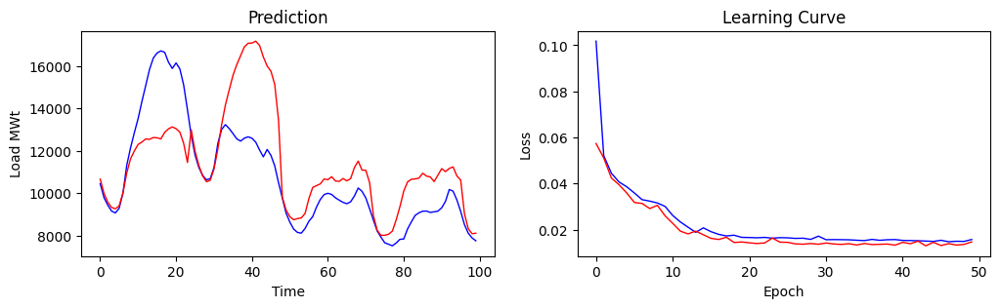



[[10664.837890625], [9999.453125], [9576.6494140625], [9330.111328125], [9267.2880859375], [9403.416015625], [10017.8486328125], [10952.9755859375], [11625.982421875], [11989.416015625], [12301.66796875], [12412.267578125], [12557.619140625], [12538.8759765625], [12624.2646484375], [12610.3046875], [12558.4208984375], [12867.8388671875], [13030.5703125], [13126.015625], [13039.3935546875], [12876.599609375], [12349.7431640625], [11447.490234375], [12985.095703125], [11983.14453125], [11305.998046875], [10819.8935546875], [10539.556640625], [10610.3291015625], [11147.54296875], [12075.0869140625], [13226.6474609375], [14160.2021484375], [14868.27734375], [15556.0107421875], [16060.9697265625], [16478.783203125], [16898.5625], [17067.08203125], [17074.9140625], [17165.791015625], [16964.876953125], [16420.8046875], [15993.64453125], [15748.2978515625], [15123.3603515625], [13436.921875], [9810.58203125], [9202.345703125], [8889.6923828125], [8749.4072265625], [8806.375], [8834.97851562

In [ ]:
# 2. LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.LSTM(50, return_sequences=True)(inputs)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)
model = Model(inputs=inputs, outputs = outputs, name="LSTM")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')
# model.summary()

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:27
4/4 [==============================] - 1s 11ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 47ms/step

Single Day Inference Time 124.27401542663574 ms

Evaluation metric results:-

MAPE is : 6.73985555768013
R2 is : 0.7448423982875831


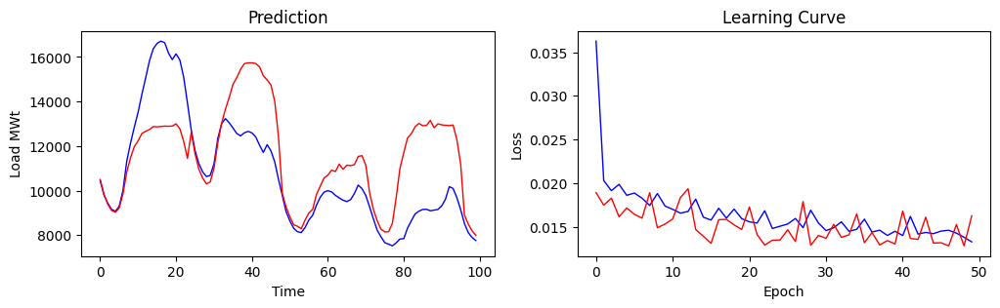



[[10498.0], [9837.529296875], [9392.4287109375], [9110.6787109375], [9025.515625], [9213.1396484375], [9846.818359375], [10832.482421875], [11475.783203125], [11978.18359375], [12234.7421875], [12568.6376953125], [12663.5830078125], [12738.8125], [12875.7822265625], [12859.96875], [12877.3408203125], [12893.82421875], [12888.302734375], [12895.2177734375], [12998.8056640625], [12769.9912109375], [12210.35546875], [11446.3232421875], [12620.6171875], [11651.7998046875], [10965.91015625], [10566.1396484375], [10299.5087890625], [10387.666015625], [11006.861328125], [12149.978515625], [13027.654296875], [13649.4619140625], [14182.470703125], [14770.4921875], [15068.3408203125], [15444.1708984375], [15700.267578125], [15731.734375], [15734.875], [15704.5498046875], [15553.33984375], [15153.189453125], [14964.4931640625], [14738.9228515625], [14008.115234375], [12394.5087890625], [9868.7041015625], [9259.908203125], [8820.16015625], [8463.740234375], [8398.9501953125], [8285.3720703125], 

In [ ]:
# 3. GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.GRU(50, return_sequences=True)(inputs)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="GRU")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:37
4/4 [==============================] - 1s 5ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 92ms/step

Single Day Inference Time 193.4823989868164 ms

Evaluation metric results:-

MAPE is : 8.286882191896439
R2 is : 0.5956361214493984


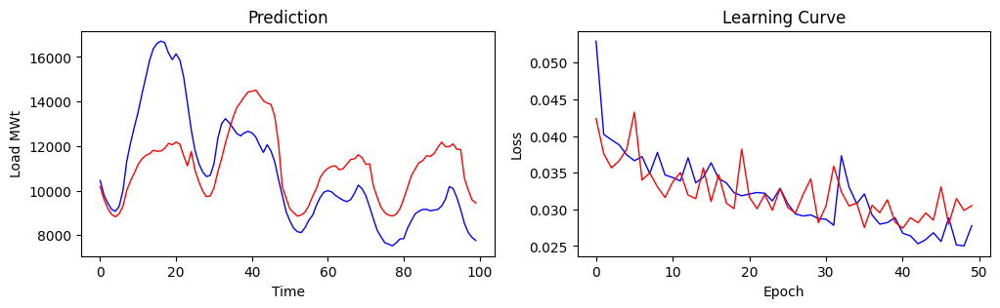



[[10178.248046875], [9610.208984375], [9191.140625], [8928.3828125], [8825.89453125], [8957.9697265625], [9293.708984375], [10003.595703125], [10442.2841796875], [10788.18359375], [11177.1865234375], [11421.75390625], [11577.65625], [11649.1005859375], [11809.6259765625], [11766.3671875], [11774.349609375], [11893.8935546875], [12120.6552734375], [12057.8408203125], [12179.6865234375], [12082.83203125], [11560.685546875], [11110.240234375], [11753.57421875], [10909.8251953125], [10395.3544921875], [9980.3408203125], [9728.7119140625], [9758.833984375], [10129.1435546875], [10835.93359375], [11435.751953125], [12130.6796875], [12720.1328125], [13279.05859375], [13729.9541015625], [13960.2490234375], [14217.3427734375], [14430.548828125], [14458.4189453125], [14510.751953125], [14273.68359375], [14036.943359375], [13926.8720703125], [13871.560546875], [13337.478515625], [12111.091796875], [10165.0205078125], [9662.8779296875], [9181.3291015625], [8999.7548828125], [8854.1806640625], [8

In [ ]:
# 4. CNN-LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=5, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:35
4/4 [==============================] - 1s 5ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 82ms/step

Single Day Inference Time 148.5574245452881 ms

Evaluation metric results:-

MAPE is : 8.521053194999695
R2 is : 0.6296785167806298


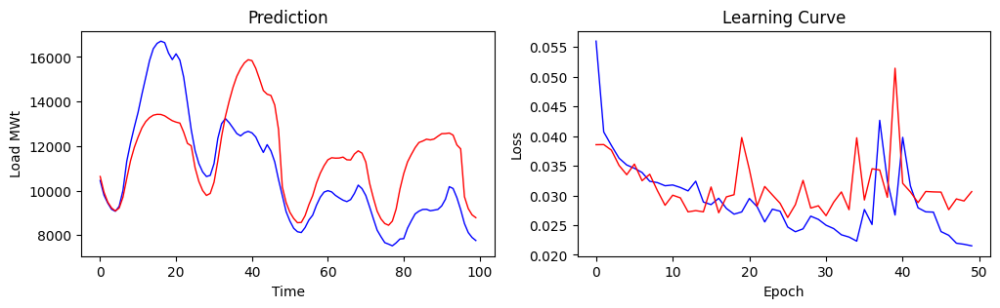



[[10633.4599609375], [9929.4501953125], [9479.5068359375], [9219.0703125], [9087.0], [9215.5810546875], [9703.3662109375], [10541.9208984375], [11341.5712890625], [11941.0703125], [12406.5986328125], [12816.8447265625], [13094.9033203125], [13271.748046875], [13384.9697265625], [13422.8232421875], [13417.1708984375], [13355.09375], [13242.3603515625], [13135.982421875], [13072.662109375], [13030.2138671875], [12624.2685546875], [12119.5751953125], [12010.1064453125], [11033.517578125], [10412.673828125], [10004.9130859375], [9781.4375], [9872.04296875], [10374.90625], [11331.4892578125], [12432.26171875], [13326.4736328125], [14018.7265625], [14632.3564453125], [15129.7763671875], [15473.365234375], [15731.28125], [15875.3701171875], [15834.2900390625], [15489.94140625], [15003.345703125], [14491.2685546875], [14327.013671875], [14269.26953125], [13839.8486328125], [12743.1650390625], [10165.4853515625], [9461.9921875], [9023.7890625], [8746.3642578125], [8557.8486328125], [8572.0966

In [ ]:
# 5. CNN-GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=5, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

h : (None, 100), c : (None, 100)
x : (None, None, 100)
d_outputs  : (None, None, 1)
hi : (None, 100), ci : (None, 100)
x : (None, None, 100), h : (None, 100), c : (None, 100)
d_outputs  : (None, None, 1)
Training Time : 00:01:26

Total Inference Time : 00:06:16

Single Day Inference Time 4133.939504623413 ms

Evaluation metric results:-

MAPE is : 7.7170997858047485
R2 is : 0.6441910529095265


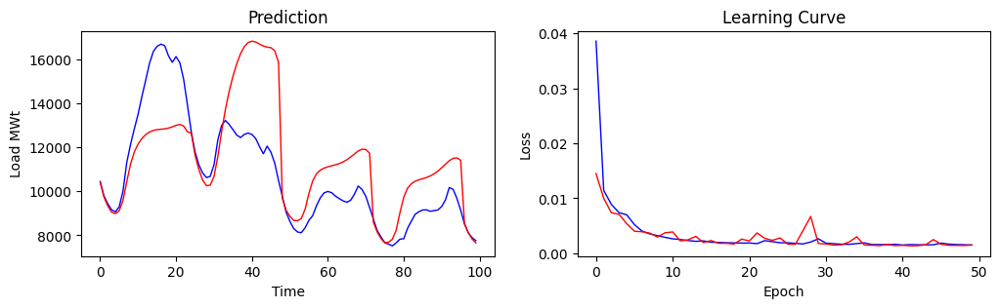



[[10415.888671875, 9741.7861328125, 9338.0068359375, 9054.7431640625, 8985.7822265625, 9113.9375, 9586.01171875, 10438.2890625, 11244.12890625, 11798.9453125, 12160.9833984375, 12411.03515625, 12587.23828125, 12705.21875, 12776.3974609375, 12813.4609375, 12831.6240234375, 12848.923828125, 12882.787109375, 12941.1318359375, 13010.724609375, 13048.2470703125, 12979.2392578125, 12709.341796875], [12660.11328125, 11654.3828125, 10996.1865234375, 10513.546875, 10259.1298828125, 10282.375, 10682.1357421875, 11583.30859375, 12717.1611328125, 13735.166015625, 14563.228515625, 15249.998046875, 15823.845703125, 16278.48046875, 16599.728515625, 16784.25, 16843.212890625, 16803.373046875, 16710.08203125, 16619.748046875, 16571.951171875, 16545.5390625, 16409.501953125, 15880.4404296875], [9684.4267578125, 9146.779296875, 8860.83984375, 8675.9794921875, 8661.6669921875, 8766.373046875, 9189.109375, 9901.44921875, 10476.728515625, 10800.0234375, 10966.541015625, 11060.0830078125, 11120.0654296875,

In [ ]:
# 6. ED-LSTM

n_units = 100

e_inputs = Input(shape=(None, 1))
d_inputs = Input(shape=(None, 1))

e_lstm = LSTM(n_units, return_state=True)
d_lstm = LSTM(n_units, return_sequences=True, return_state=True)
d_dense = Dense(1, activation='linear')

_, h, c = e_lstm(e_inputs)
e_states = [h, c]
print(f"h : {h.shape}, c : {c.shape}")
x, _, _ = d_lstm(d_inputs, initial_state=e_states)
print(f"x : {x.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")
model = Model([e_inputs, d_inputs], d_outputs)
model.compile(optimizer='adam', loss='mse')
# model.summary()

# for inference
e_model = Model(e_inputs, e_states)
# for initial decoder_state_inputs
hi = Input(shape=(n_units,))
ci = Input(shape=(n_units,))
d_states_i = [hi, ci]
print(f"hi : {hi.shape}, ci : {ci.shape}")
x, h, c = d_lstm(d_inputs, initial_state=d_states_i)
d_states = [h, c]
print(f"x : {x.shape}, h : {h.shape}, c : {c.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")

d_model = Model([d_inputs] + d_states_i, [d_outputs] + d_states)

def forecast(input_seq, encoder, decoder):
    state = encoder.predict(input_seq, verbose=0)
    # Generate empty target sequence of length 101 ie [[[0,0,0,0,.....,0]]].
    target_seq = np.zeros((1, 1, 1))
    output = []
    for t in range(24):
        yhat, h, c = decoder.predict([target_seq] + state, verbose=0)
        output.append(yhat[0,0,:]) # yhat : [[[a,b,c,d,...]]] -> yhat[0,0,:] : [a,b,c,d,...]
        state = [h, c]
        target_seq = yhat
    return np.array(output)

start_time = time.time()
history = model.fit([Xs, Xd], Ys, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Y_pred = []
for x in Xts:
    x = np.expand_dims(x, axis=0) # Inputs : (168, 1) -> Expand : (1, 168, 1)
    target = forecast(x, e_model, d_model)  # Output (24, 101)
#     target = one_hot_decode(target)
    target = scaler_load.inverse_transform(target.reshape(-1,1))
    target = target.squeeze(1)
    Y_pred.append(target)
Y_pred = np.array(Y_pred)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = forecast(np.expand_dims(Xts[0],axis=0), e_model, d_model)
print(f"\nSingle Day Inference Time {(time.time() - start_time)*1000} ms")

evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

# 9.PJME

In [ ]:
path = "/content/drive/MyDrive/DATASETS/PJME_hourly.csv"
dataset = pd.read_csv(path,index_col=['Datetime'],parse_dates=['Datetime'])
# n = round((len(dataset)/24)*0.8)*24
train = dataset.iloc[:-2568,:]
test = dataset.iloc[-2568:,:]
train = np.array(train.values)
test = np.array(test.values)

X, Y = reframe(data=train, lookback=LOOKBACK, lookahead=LOOKAHEAD)
Xt, Yt = reframe(data=test, lookback=LOOKBACK, lookahead=LOOKAHEAD)

# Image Conversion GADF
transformer = GramianAngularField(method='difference', overlapping=False, flatten=False)
X_img = transformer.transform(X).reshape(-1,LOOKBACK,LOOKBACK,1)
Xt_img = transformer.transform(Xt).reshape(-1,LOOKBACK,LOOKBACK,1)
print(f"X_img : {X_img.shape}, Xt_img : {Xt_img.shape}")

# Feature Scaling
scaler_load = MinMaxScaler(feature_range=(-1, 1))
Xs = scaler_load.fit_transform(X.reshape(-1,1)).reshape(-1,LOOKBACK,1)
Ys = scaler_load.transform(Y.reshape(-1,1)).reshape(-1,LOOKAHEAD)
Xts = scaler_load.transform(Xt.reshape(-1,1)).reshape(-1,LOOKBACK,1)
print(f"Xs : {Xs.shape}, Ys : {Ys.shape}")
print(f"Xts : {Xts.shape}, Yt : {Yt.shape}")

# Xd = np.insert(Ys, 0, 0, axis=1)
# Xd = np.delete(Xd,-1, axis=1)
# print(f"Xd : {Xd.shape}")

del dataset, train, test, X, Xt
gc.collect()

X_img : (5942, 168, 168, 1), Xt_img : (100, 168, 168, 1)
Xs : (5942, 168, 1), Ys : (5942, 24)
Xts : (100, 168, 1), Yt : (100, 24)


10541

time: 2.73 s (started: 2023-12-17 10:05:43 +00:00)


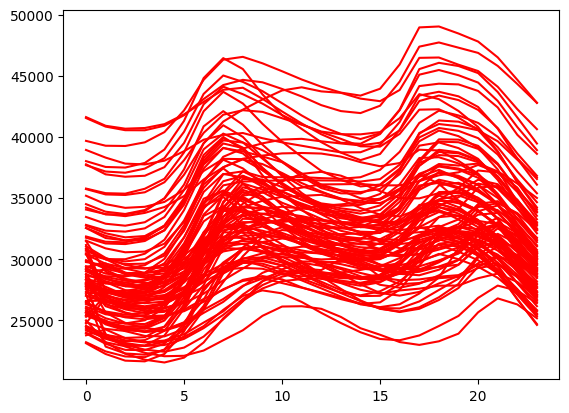

time: 379 ms (started: 2023-11-27 08:28:01 +00:00)


In [ ]:
for i in range(len(Yt)):
    plt.plot(Yt[i], color='r')
plt.show()

Training Time : 00:02:30
4/4 [==============================] - 1s 10ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 30ms/step

Single Day Inference Time 89.72311019897461 ms

Evaluation metric results:-

MAPE is : 5.492405593395233
R2 is : 0.7919358736204634


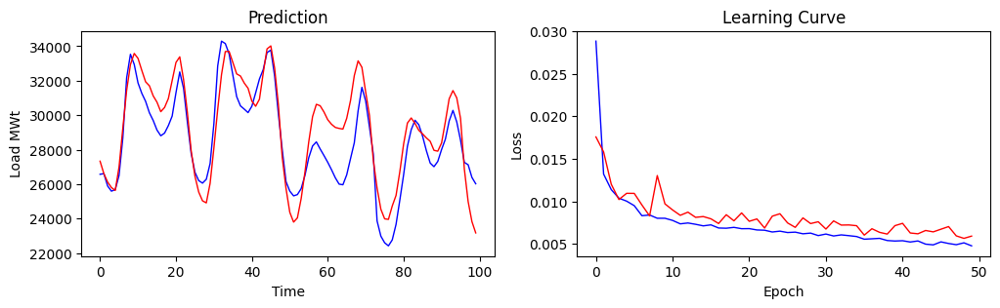



[[27331.56640625], [26610.369140625], [26117.03515625], [25803.013671875], [25633.814453125], [26994.169921875], [29250.189453125], [31432.990234375], [32936.1953125], [33581.65625], [33295.40625], [32597.033203125], [31936.68359375], [31706.18359375], [31120.41015625], [30755.384765625], [30203.05859375], [30447.4921875], [30966.380859375], [32008.48828125], [33056.6796875], [33385.22265625], [32069.689453125], [30169.26171875], [27955.119140625], [26465.45703125], [25540.47265625], [25032.810546875], [24913.275390625], [26047.818359375], [28101.65625], [30334.896484375], [32348.056640625], [33688.8046875], [33702.359375], [33056.08984375], [32395.478515625], [32271.900390625], [31862.98046875], [31562.41796875], [30818.423828125], [30517.392578125], [30926.419921875], [32449.220703125], [33844.07421875], [34018.84375], [32735.609375], [30591.71875], [27572.51171875], [25754.884765625], [24368.126953125], [23798.86328125], [24041.23828125], [25165.875], [26703.158203125], [28456.792

In [ ]:
# CNNLSTM+GAF

seq_inputs = layers.Input(shape=(LOOKBACK,1))
img_inputs = layers.Input(shape=(LOOKBACK,LOOKBACK,1))

x1 = layers.LSTM(50, return_sequences=False)(seq_inputs)
x2 = layers.Convolution2D(filters=20, kernel_size=7, padding='valid')(img_inputs)
x2 = layers.GlobalAvgPool2D()(x2)
c1 = layers.Concatenate(axis=1)([x1,x2])
outputs = layers.Dense(24, activation='linear')(c1)

model = Model([seq_inputs,img_inputs], outputs)
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit([Xs,X_img], Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict([Xts,Xt_img])
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict([Xts[:1],Xt_img[:1]])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:02:28
4/4 [==============================] - 1s 10ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 22ms/step

Single Day Inference Time 62.34383583068848 ms

Evaluation metric results:-

MAPE is : 5.513381212949753
R2 is : 0.7772680728591388


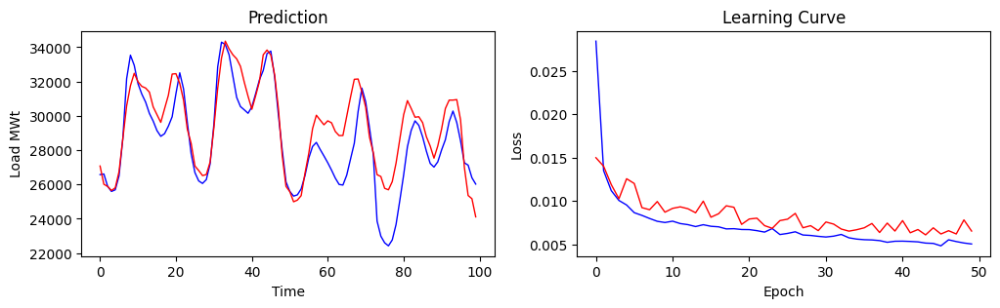



[[27074.75390625], [26012.001953125], [25884.3203125], [25647.654296875], [25802.435546875], [26744.6796875], [28671.76171875], [30577.3671875], [31751.08203125], [32480.623046875], [31984.734375], [31718.86328125], [31621.10546875], [31380.357421875], [30520.4375], [30066.255859375], [29618.916015625], [30415.2890625], [31197.521484375], [32435.455078125], [32456.580078125], [31883.734375], [30913.783203125], [29215.1640625], [28395.734375], [27075.876953125], [26809.591796875], [26517.48828125], [26576.810546875], [27304.4921875], [29314.7890625], [31604.775390625], [33367.4921875], [34353.234375], [33899.9296875], [33558.67578125], [33322.828125], [32884.29296875], [31965.03515625], [31141.267578125], [30382.666015625], [31166.30859375], [32001.90625], [33559.80078125], [33836.05859375], [33546.859375], [32392.033203125], [30419.62890625], [27688.3828125], [25886.296875], [25584.26953125], [24990.904296875], [25087.44921875], [25348.337890625], [26643.9140625], [27810.728515625], 

In [ ]:
# SELF-ATTN-WITH-LSTM

inputs=Input(shape=(LOOKBACK,1))
x = Dense(24)(inputs)
z = MultiHeadAttention(num_heads=4, key_dim=24)(x, x)
x = Add()([x,z])
y = LSTM(24, return_sequences=True)(inputs)
x = Concatenate()([x,y])
x = LSTM(24, return_sequences=False)(x)
model = Model(inputs=inputs, outputs=x)

model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:00:42
4/4 [==============================] - 0s 5ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 30ms/step

Single Day Inference Time 112.77961730957031 ms

Evaluation metric results:-

MAPE is : 6.215367093682289
R2 is : 0.7302705774386322


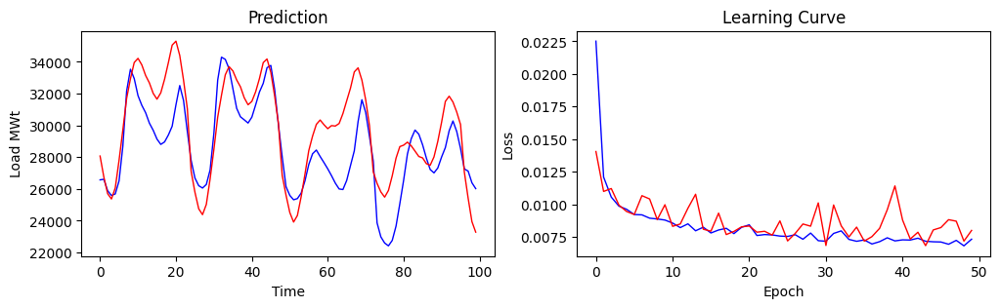



[[28072.677734375], [26747.841796875], [25702.732421875], [25369.56640625], [26064.91796875], [27799.578125], [29710.0703125], [31696.677734375], [32932.00390625], [33959.09765625], [34219.03515625], [33810.45703125], [33145.5], [32673.57421875], [32015.861328125], [31650.57421875], [32049.748046875], [32903.29296875], [33947.7109375], [35051.69140625], [35301.48046875], [34399.3515625], [32845.9375], [31053.6484375], [27113.3125], [25797.84375], [24751.93359375], [24383.98828125], [25028.080078125], [26634.748046875], [28496.740234375], [30523.48828125], [31901.806640625], [33184.98046875], [33698.3984375], [33430.74609375], [32861.51171875], [32426.08203125], [31736.7265625], [31299.44140625], [31510.408203125], [32113.77734375], [32947.2109375], [33952.92578125], [34178.61328125], [33344.0703125], [31871.20703125], [30125.5625], [26854.935546875], [25619.271484375], [24520.2890625], [23918.76953125], [24330.97265625], [25519.013671875], [26932.40625], [28411.6484375], [29324.82226

In [ ]:
# 1. MLP

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Flatten()(inputs)
x = layers.Dense(50, activation="relu")(x)
x = layers.Dense(50, activation="relu")(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="MLP")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:03:07
4/4 [==============================] - 2s 12ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 47ms/step

Single Day Inference Time 149.22547340393066 ms

Evaluation metric results:-

MAPE is : 7.201386988162994
R2 is : 0.6477396141413807


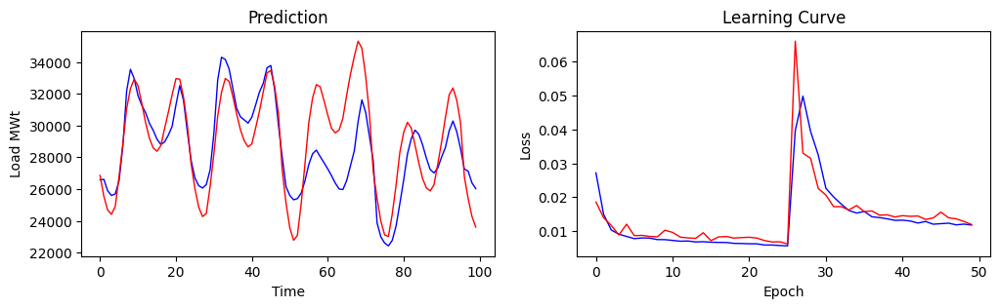



[[26853.44921875], [25537.8125], [24678.78125], [24406.974609375], [24899.291015625], [26770.27734375], [28842.69140625], [31048.66796875], [32322.140625], [32919.94140625], [32500.95703125], [31384.33203125], [30182.5390625], [29198.966796875], [28583.53515625], [28376.3203125], [28722.052734375], [29804.57421875], [30837.814453125], [31941.67578125], [32947.421875], [32911.48828125], [31768.171875], [30042.18359375], [27571.810546875], [26023.482421875], [24857.076171875], [24265.232421875], [24456.037109375], [26158.203125], [28220.810546875], [30584.78515625], [32086.861328125], [32956.6015625], [32774.828125], [31824.466796875], [30715.521484375], [29725.1328125], [29034.232421875], [28650.859375], [28838.068359375], [29846.34765625], [30900.35546875], [32110.6796875], [33305.66796875], [33465.02734375], [32456.9765625], [30785.037109375], [27189.1640625], [25120.9140625], [23566.146484375], [22774.44140625], [23075.9453125], [25067.92578125], [27584.716796875], [30171.9609375],

In [ ]:
# 2. LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.LSTM(50, return_sequences=True)(inputs)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)
model = Model(inputs=inputs, outputs = outputs, name="LSTM")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')
# model.summary()

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:02:30
4/4 [==============================] - 1s 12ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 64ms/step

Single Day Inference Time 167.41943359375 ms

Evaluation metric results:-

MAPE is : 6.017694994807243
R2 is : 0.7539410376569142


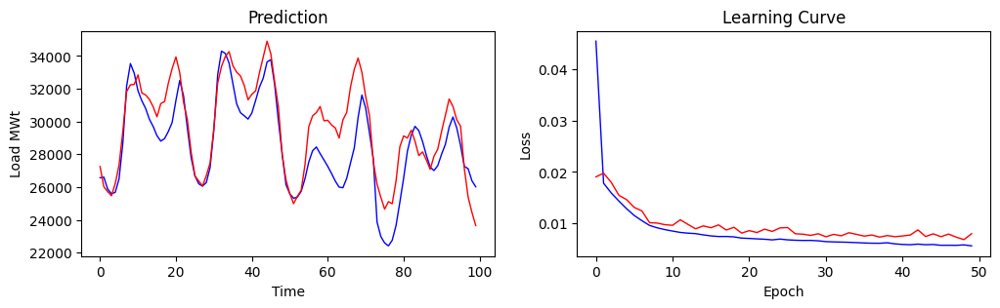



[[27257.216796875], [26020.283203125], [25728.796875], [25474.091796875], [26223.595703125], [27342.888671875], [29393.1875], [31826.458984375], [32244.38671875], [32262.546875], [32845.15234375], [31741.33203125], [31620.138671875], [31351.34765625], [30895.28515625], [30288.365234375], [31096.103515625], [31216.107421875], [32345.48828125], [33236.8984375], [33940.890625], [32973.1328125], [31171.7109375], [30121.09375], [28141.58984375], [26683.25390625], [26375.310546875], [26072.353515625], [26704.556640625], [27480.712890625], [29623.037109375], [32352.703125], [33361.0], [33962.859375], [34262.453125], [33406.15234375], [33011.3125], [32783.40625], [32198.919921875], [31324.533203125], [31665.365234375], [31871.064453125], [32972.75390625], [33937.8515625], [34901.48046875], [34134.5078125], [32428.0703125], [30896.326171875], [27953.611328125], [26438.083984375], [25608.765625], [24993.251953125], [25441.38671875], [25805.208984375], [27363.431640625], [29682.689453125], [303

In [ ]:
# 3. GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.GRU(50, return_sequences=True)(inputs)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="GRU")
model.compile(optimizer=Adam(learning_rate=0.001),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:24
4/4 [==============================] - 1s 14ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 60ms/step

Single Day Inference Time 139.76573944091797 ms

Evaluation metric results:-

MAPE is : 5.646068602800369
R2 is : 0.7834902042143068


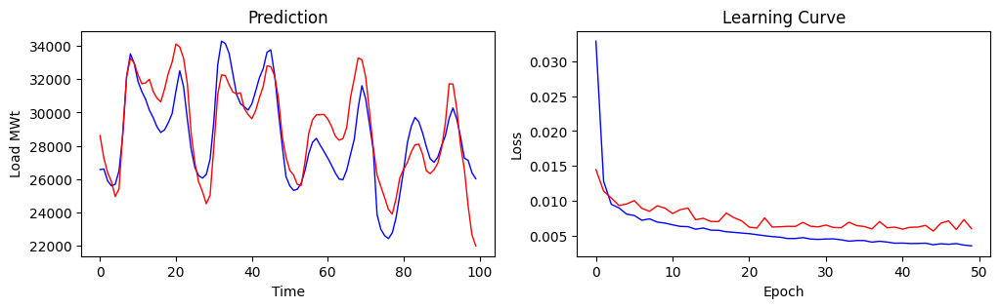



[[28614.296875], [27264.970703125], [26386.4375], [25838.740234375], [24949.564453125], [25417.44140625], [28938.0625], [32179.509765625], [33271.4140625], [32978.50390625], [32269.900390625], [31732.708984375], [31786.767578125], [32000.3203125], [31271.265625], [30861.34375], [30649.60546875], [31418.814453125], [32375.671875], [33035.5625], [34123.36328125], [33943.69921875], [33276.15625], [31742.7421875], [28772.9765625], [26952.873046875], [25822.3359375], [25239.876953125], [24518.404296875], [25035.765625], [27998.599609375], [31072.859375], [32264.005859375], [32230.591796875], [31676.662109375], [31234.541015625], [31122.89453125], [31190.671875], [30245.51171875], [29880.86328125], [29632.416015625], [30109.892578125], [30893.84765625], [31570.396484375], [32809.24609375], [32758.552734375], [32210.490234375], [30869.857421875], [28589.2890625], [27322.521484375], [26527.435546875], [26246.337890625], [25672.759765625], [25627.685546875], [27013.341796875], [28759.09179687

In [ ]:
# 4. CNN-LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=5, padding="valid")(inputs)
x = layers.ReLU()(x)
x = layers.MaxPool1D(5)(x)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:23
4/4 [==============================] - 0s 4ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 30ms/step

Single Day Inference Time 79.00404930114746 ms

Evaluation metric results:-

MAPE is : 5.650919675827026
R2 is : 0.7774200207947713


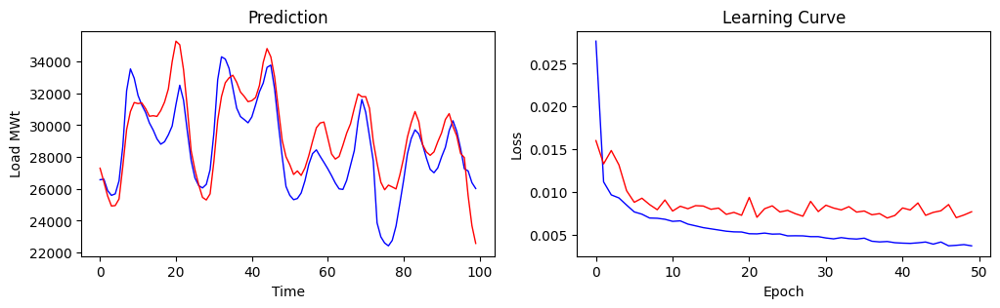



[[27297.650390625], [26445.255859375], [25550.72265625], [24923.220703125], [24950.673828125], [25364.833984375], [27427.701171875], [29727.806640625], [30858.173828125], [31423.5], [31357.326171875], [31398.228515625], [31043.044921875], [30562.021484375], [30594.650390625], [30551.791015625], [30920.56640625], [31454.2890625], [32277.658203125], [33988.43359375], [35277.63671875], [35050.32421875], [33479.828125], [31072.080078125], [28394.591796875], [27197.947265625], [26251.36328125], [25465.55078125], [25302.58203125], [25688.5234375], [27727.826171875], [30304.51171875], [31798.95703125], [32665.51171875], [32973.734375], [33137.2109375], [32697.466796875], [32081.146484375], [31805.93359375], [31476.828125], [31541.76171875], [31742.814453125], [32494.76171875], [33946.7109375], [34813.33984375], [34293.6875], [33030.78515625], [31009.54296875], [29044.556640625], [28018.1796875], [27516.9453125], [26906.025390625], [27126.109375], [26843.888671875], [27318.71875], [28081.513

In [ ]:
# 5. CNN-GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=5, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

h : (None, 100), c : (None, 100)
x : (None, None, 100)
d_outputs  : (None, None, 1)
hi : (None, 100), ci : (None, 100)
x : (None, None, 100), h : (None, 100), c : (None, 100)
d_outputs  : (None, None, 1)
Training Time : 00:02:31

Total Inference Time : 00:06:28

Single Day Inference Time 5096.5070724487305 ms

Evaluation metric results:-

MAPE is : 8.61140564084053
R2 is : 0.5355337238606896


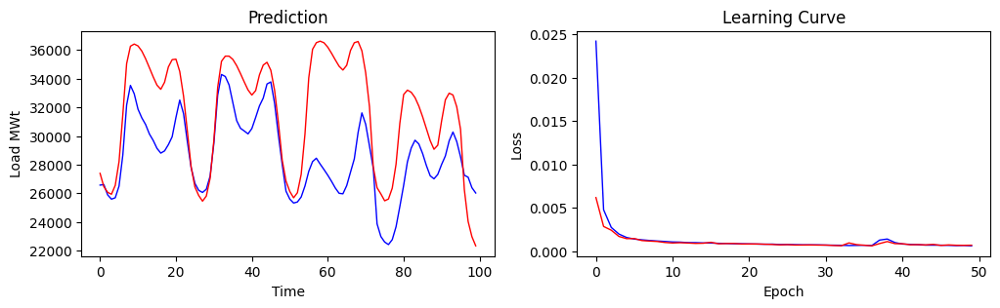



[[27393.68359375, 26460.951171875, 26068.3125, 25934.25390625, 26554.5390625, 28211.82421875, 31507.091796875, 35049.3828125, 36267.01171875, 36420.0625, 36288.33984375, 35930.96484375, 35394.0546875, 34768.1796875, 34128.81640625, 33550.0703125, 33260.890625, 33754.09765625, 34819.69140625, 35328.6484375, 35363.25, 34503.24609375, 32784.8203125, 30344.974609375], [27841.220703125, 26439.494140625, 25843.9453125, 25452.5625, 25809.556640625, 27048.09765625, 29713.546875, 33399.68359375, 35216.828125, 35575.49609375, 35574.984375, 35344.3984375, 34911.99609375, 34360.42578125, 33770.91796875, 33212.1953125, 32859.5703125, 33165.57421875, 34264.71875, 34952.62890625, 35146.44921875, 34592.15625, 33182.43359375, 30928.91796875], [28316.728515625, 26853.951171875, 26131.861328125, 25687.259765625, 26038.43359375, 27320.4921875, 30135.294921875, 34063.7578125, 36053.125, 36514.05078125, 36621.65625, 36511.66796875, 36204.06640625, 35777.26953125, 35310.8671875, 34868.1484375, 34605.28125,

In [ ]:
# 6. ED-LSTM

n_units = 100

e_inputs = Input(shape=(None, 1))
d_inputs = Input(shape=(None, 1))

e_lstm = LSTM(n_units, return_state=True)
d_lstm = LSTM(n_units, return_sequences=True, return_state=True)
d_dense = Dense(1, activation='linear')

_, h, c = e_lstm(e_inputs)
e_states = [h, c]
print(f"h : {h.shape}, c : {c.shape}")
x, _, _ = d_lstm(d_inputs, initial_state=e_states)
print(f"x : {x.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")
model = Model([e_inputs, d_inputs], d_outputs)
model.compile(optimizer='adam', loss='mse')
# model.summary()

# for inference
e_model = Model(e_inputs, e_states)
# for initial decoder_state_inputs
hi = Input(shape=(n_units,))
ci = Input(shape=(n_units,))
d_states_i = [hi, ci]
print(f"hi : {hi.shape}, ci : {ci.shape}")
x, h, c = d_lstm(d_inputs, initial_state=d_states_i)
d_states = [h, c]
print(f"x : {x.shape}, h : {h.shape}, c : {c.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")

d_model = Model([d_inputs] + d_states_i, [d_outputs] + d_states)

def forecast(input_seq, encoder, decoder):
    state = encoder.predict(input_seq, verbose=0)
    # Generate empty target sequence of length 101 ie [[[0,0,0,0,.....,0]]].
    target_seq = np.zeros((1, 1, 1))
    output = []
    for t in range(24):
        yhat, h, c = decoder.predict([target_seq] + state, verbose=0)
        output.append(yhat[0,0,:]) # yhat : [[[a,b,c,d,...]]] -> yhat[0,0,:] : [a,b,c,d,...]
        state = [h, c]
        target_seq = yhat
    return np.array(output)

start_time = time.time()
history = model.fit([Xs, Xd], Ys, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Y_pred = []
for x in Xts:
    x = np.expand_dims(x, axis=0) # Inputs : (168, 1) -> Expand : (1, 168, 1)
    target = forecast(x, e_model, d_model)  # Output (24, 101)
#     target = one_hot_decode(target)
    target = scaler_load.inverse_transform(target.reshape(-1,1))
    target = target.squeeze(1)
    Y_pred.append(target)
Y_pred = np.array(Y_pred)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = forecast(np.expand_dims(Xts[0],axis=0), e_model, d_model)
print(f"\nSingle Day Inference Time {(time.time() - start_time)*1000} ms")

evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

# 10.PJMW

In [ ]:
path = "/content/drive/MyDrive/DATASETS/PJMW_hourly.csv"
dataset = pd.read_csv(path,index_col=['Datetime'],parse_dates=['Datetime'])
# n = round((len(dataset)/24)*0.8)*24
train = dataset.iloc[:-2568,:]
test = dataset.iloc[-2568:,:]
train = np.array(train.values)
test = np.array(test.values)

X, Y = reframe(data=train, lookback=LOOKBACK, lookahead=LOOKAHEAD)
Xt, Yt = reframe(data=test, lookback=LOOKBACK, lookahead=LOOKAHEAD)

# Image Conversion GADF
transformer = GramianAngularField(method='difference', overlapping=False, flatten=False)
X_img = transformer.transform(X).reshape(-1,LOOKBACK,LOOKBACK,1)
Xt_img = transformer.transform(Xt).reshape(-1,LOOKBACK,LOOKBACK,1)
print(f"X_img : {X_img.shape}, Xt_img : {Xt_img.shape}")

# Feature Scaling
scaler_load = MinMaxScaler(feature_range=(-1, 1))
Xs = scaler_load.fit_transform(X.reshape(-1,1)).reshape(-1,LOOKBACK,1)
Ys = scaler_load.transform(Y.reshape(-1,1)).reshape(-1,LOOKAHEAD)
Xts = scaler_load.transform(Xt.reshape(-1,1)).reshape(-1,LOOKBACK,1)
print(f"Xs : {Xs.shape}, Ys : {Ys.shape}")
print(f"Xts : {Xts.shape}, Yt : {Yt.shape}")

# Xd = np.insert(Ys, 0, 0, axis=1)
# Xd = np.delete(Xd,-1, axis=1)
# print(f"Xd : {Xd.shape}")

del dataset, train, test, X, Xt
gc.collect()

X_img : (5854, 168, 168, 1), Xt_img : (100, 168, 168, 1)
Xs : (5854, 168, 1), Ys : (5854, 24)
Xts : (100, 168, 1), Yt : (100, 24)


0

time: 16.2 s (started: 2023-12-17 10:06:06 +00:00)


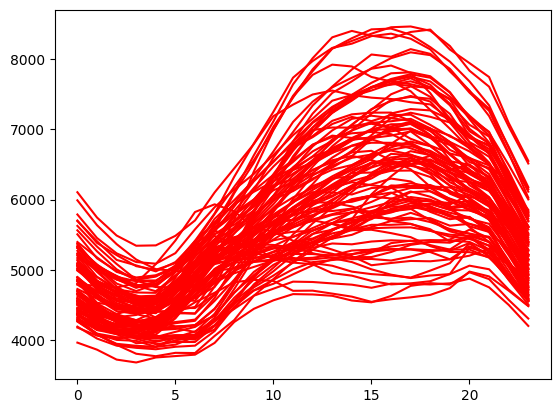

time: 394 ms (started: 2023-12-17 10:06:37 +00:00)


In [ ]:
for i in range(len(Yt)):
    plt.plot(Yt[i], color='r')
plt.show()

Training Time : 00:02:28
4/4 [==============================] - 1s 9ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 29ms/step

Single Day Inference Time 91.97115898132324 ms

Evaluation metric results:-

MAPE is : 3.961718827486038
R2 is : 0.8909823644352346


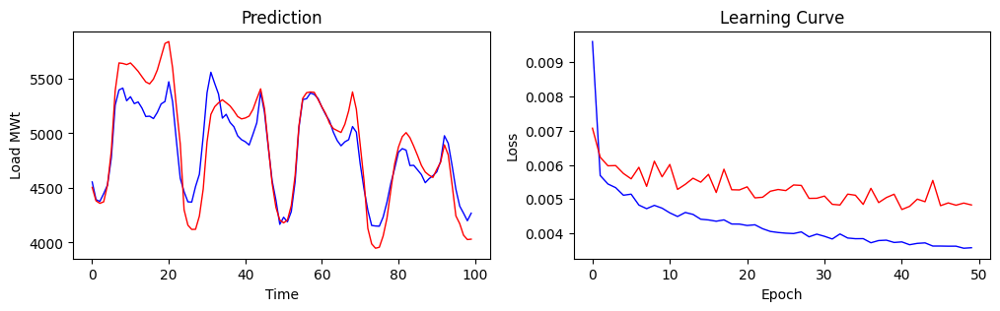



[[4505.50439453125], [4382.3544921875], [4359.396484375], [4373.1640625], [4527.60888671875], [4842.09814453125], [5387.5419921875], [5644.390625], [5639.52587890625], [5629.12841796875], [5643.970703125], [5607.3837890625], [5567.5751953125], [5518.2548828125], [5470.55615234375], [5452.5185546875], [5496.8193359375], [5578.58349609375], [5700.34375], [5822.2138671875], [5839.91259765625], [5599.0751953125], [5239.6728515625], [4903.173828125], [4300.95947265625], [4159.64208984375], [4120.5439453125], [4121.8291015625], [4242.900390625], [4490.4833984375], [4922.484375], [5173.27978515625], [5243.78125], [5279.3232421875], [5307.06103515625], [5280.08349609375], [5251.21630859375], [5205.9365234375], [5153.93212890625], [5132.17626953125], [5140.3056640625], [5157.75634765625], [5219.58740234375], [5316.30615234375], [5407.19482421875], [5227.63671875], [4885.2607421875], [4542.30908203125], [4321.21630859375], [4206.5732421875], [4180.89892578125], [4205.96142578125], [4339.226074

In [ ]:
# CNNLSTM+GAF

seq_inputs = layers.Input(shape=(LOOKBACK,1))
img_inputs = layers.Input(shape=(LOOKBACK,LOOKBACK,1))

x1 = layers.LSTM(50, return_sequences=False)(seq_inputs)
x2 = layers.Convolution2D(filters=20, kernel_size=7, padding='valid')(img_inputs)
x2 = layers.GlobalAvgPool2D()(x2)
c1 = layers.Concatenate(axis=1)([x1,x2])
outputs = layers.Dense(24, activation='linear')(c1)

model = Model([seq_inputs,img_inputs], outputs)
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit([Xs,X_img], Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict([Xts,Xt_img])
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict([Xts[:1],Xt_img[:1]])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:04:29
4/4 [==============================] - 1s 11ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 40ms/step

Single Day Inference Time 108.43849182128906 ms

Evaluation metric results:-

MAPE is : 3.8089826703071594
R2 is : 0.9062922085555685


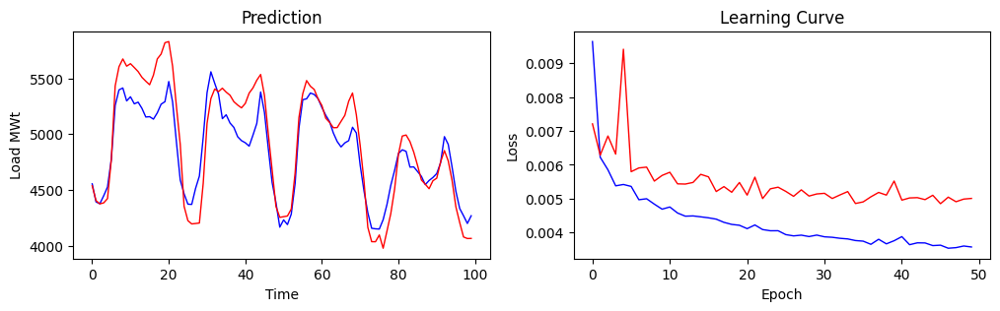



[[4538.35107421875], [4404.6474609375], [4375.78076171875], [4384.54638671875], [4423.06787109375], [4774.8759765625], [5432.07080078125], [5604.46533203125], [5674.3818359375], [5609.44873046875], [5631.701171875], [5596.93603515625], [5560.9951171875], [5509.34521484375], [5474.65576171875], [5443.01123046875], [5529.80615234375], [5674.33984375], [5718.2626953125], [5819.62890625], [5830.03662109375], [5609.0927734375], [5249.06494140625], [4908.12890625], [4354.04150390625], [4225.0888671875], [4195.95361328125], [4199.72314453125], [4204.052734375], [4560.7998046875], [5097.12841796875], [5318.8984375], [5404.62255859375], [5381.611328125], [5412.03125], [5376.837890625], [5348.9677734375], [5291.35791015625], [5260.8603515625], [5235.9287109375], [5275.8701171875], [5368.1396484375], [5414.91064453125], [5483.7109375], [5534.6845703125], [5346.11572265625], [5002.328125], [4678.4814453125], [4352.654296875], [4254.67919921875], [4260.73193359375], [4266.853515625], [4329.566406

In [ ]:
# Proposed ATTN-LSTM

inputs=Input(shape=(LOOKBACK,1))
x = Dense(24)(inputs)
z = MultiHeadAttention(num_heads=4, key_dim=24)(x, x)
x = Add()([x,z])
y = LSTM(24, return_sequences=True)(inputs)
x = Concatenate()([x,y])
x = LSTM(24, return_sequences=False)(x)
model = Model(inputs=inputs, outputs=x)

model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:24
4/4 [==============================] - 0s 3ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 32ms/step

Single Day Inference Time 92.82374382019043 ms

Evaluation metric results:-

MAPE is : 4.412872344255447
R2 is : 0.8814799523250594


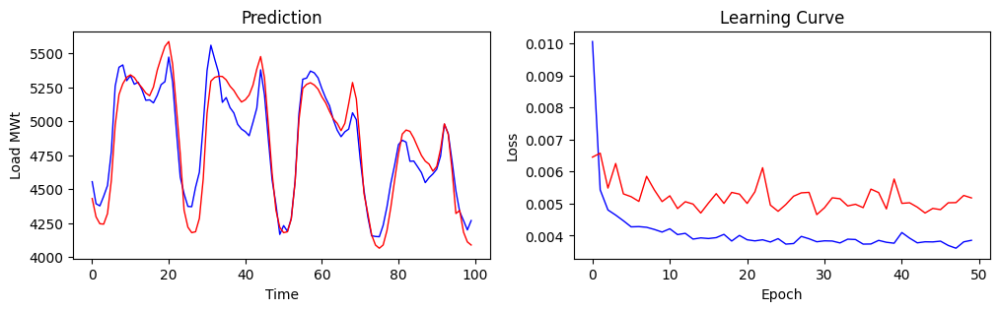



[[4430.921875], [4296.4716796875], [4245.5078125], [4242.7236328125], [4320.27880859375], [4565.00830078125], [4969.8857421875], [5196.0712890625], [5275.474609375], [5323.47509765625], [5340.88720703125], [5321.341796875], [5279.53857421875], [5246.83251953125], [5207.28369140625], [5187.56787109375], [5251.40966796875], [5375.73291015625], [5466.859375], [5550.5478515625], [5586.0576171875], [5420.0166015625], [5096.3017578125], [4759.77197265625], [4345.52490234375], [4220.115234375], [4179.89013671875], [4186.66015625], [4285.0888671875], [4575.21728515625], [5058.3720703125], [5295.26220703125], [5322.373046875], [5330.6904296875], [5329.013671875], [5304.05322265625], [5257.6455078125], [5226.18310546875], [5179.81005859375], [5141.26806640625], [5157.81982421875], [5192.9072265625], [5265.49951171875], [5383.9052734375], [5475.876953125], [5320.14306640625], [4977.6826171875], [4615.2236328125], [4344.82861328125], [4219.10400390625], [4179.6845703125], [4186.42041015625], [42

In [ ]:
# 1. MLP

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Flatten()(inputs)
x = layers.Dense(100, activation="relu")(x)
x = layers.Dense(48, activation="relu")(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="MLP")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:03:31
4/4 [==============================] - 1s 11ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 36ms/step

Single Day Inference Time 91.21179580688477 ms

Evaluation metric results:-

MAPE is : 4.602619633078575
R2 is : 0.8849396178985269


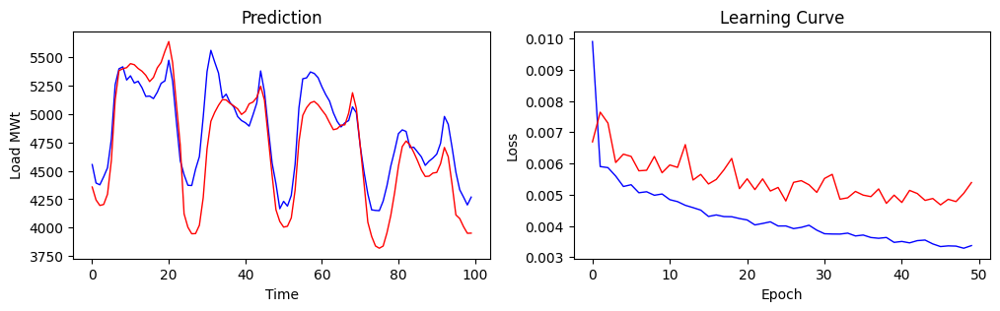



[[4357.71875], [4244.3212890625], [4195.58056640625], [4204.3740234375], [4294.61865234375], [4589.63330078125], [5122.908203125], [5380.6728515625], [5397.4248046875], [5406.79150390625], [5442.17578125], [5432.5791015625], [5399.40380859375], [5375.7314453125], [5339.6142578125], [5284.4931640625], [5321.0517578125], [5405.4345703125], [5452.5224609375], [5551.38037109375], [5636.19580078125], [5452.14697265625], [5082.9365234375], [4725.4521484375], [4122.28271484375], [4004.130615234375], [3946.74560546875], [3948.54541015625], [4021.653076171875], [4264.400390625], [4692.92919921875], [4935.3642578125], [5014.005859375], [5076.265625], [5125.744140625], [5123.29736328125], [5092.375], [5070.28515625], [5044.1494140625], [4995.64453125], [5021.44580078125], [5088.95556640625], [5104.5263671875], [5145.8115234375], [5243.47998046875], [5121.025390625], [4790.51220703125], [4459.54443359375], [4158.2724609375], [4055.0234375], [4005.388671875], [4012.668701171875], [4086.345703125]

In [ ]:
# 2. LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.LSTM(50, return_sequences=True)(inputs)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)
model = Model(inputs=inputs, outputs = outputs, name="LSTM")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')
# model.summary()

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:02:22
4/4 [==============================] - 2s 15ms/step

Total Inference Time : 00:00:01
1/1 [==============================] - 0s 76ms/step

Single Day Inference Time 199.63979721069336 ms

Evaluation metric results:-

MAPE is : 5.389488860964775
R2 is : 0.8305225982907253


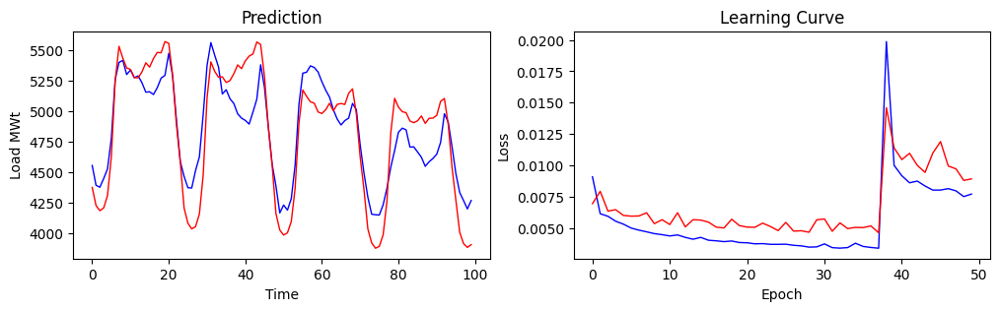



[[4375.3046875], [4227.5625], [4185.67822265625], [4207.76123046875], [4309.212890625], [4626.01416015625], [5246.4755859375], [5528.96240234375], [5431.958984375], [5351.7841796875], [5340.25732421875], [5273.78564453125], [5270.703125], [5320.06982421875], [5394.29052734375], [5358.86865234375], [5429.119140625], [5478.88232421875], [5476.06298828125], [5567.6982421875], [5552.96044921875], [5293.44921875], [4889.31201171875], [4588.271484375], [4208.03662109375], [4083.1640625], [4036.65380859375], [4055.27490234375], [4157.63037109375], [4479.16357421875], [5106.19921875], [5401.77392578125], [5323.43017578125], [5275.99609375], [5279.26611328125], [5233.14013671875], [5249.447265625], [5305.4990234375], [5376.8779296875], [5346.11669921875], [5409.70361328125], [5448.89697265625], [5466.7685546875], [5564.04443359375], [5544.12255859375], [5283.076171875], [4870.4951171875], [4559.98974609375], [4162.06201171875], [4027.187744140625], [3986.218994140625], [4004.69580078125], [40

In [ ]:
# 3. GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.GRU(50, return_sequences=True)(inputs)
x = layers.GRU(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="GRU")
model.compile(optimizer=Adam(learning_rate=0.01),loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:14
4/4 [==============================] - 1s 6ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 102ms/step

Single Day Inference Time 215.90113639831543 ms

Evaluation metric results:-

MAPE is : 4.620163142681122
R2 is : 0.8642675932376712


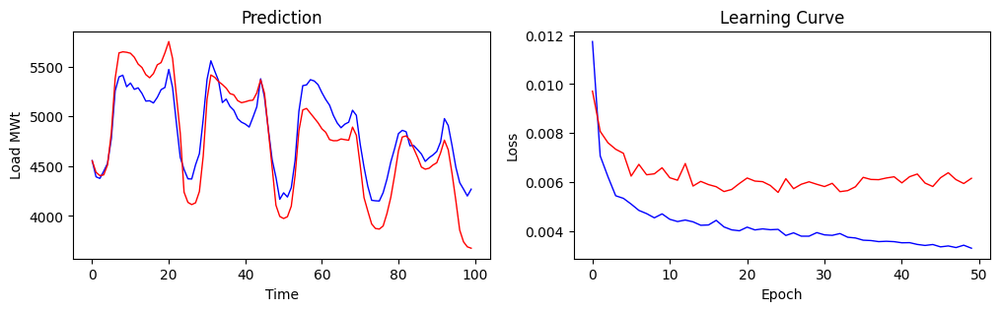



[[4553.93310546875], [4438.763671875], [4405.56494140625], [4412.08056640625], [4512.2216796875], [4835.94921875], [5381.88623046875], [5638.18701171875], [5649.00341796875], [5644.5341796875], [5634.4560546875], [5594.478515625], [5525.783203125], [5491.2900390625], [5420.25439453125], [5388.21240234375], [5430.6044921875], [5518.2333984375], [5540.875], [5638.5087890625], [5752.1748046875], [5581.1552734375], [5206.658203125], [4831.1142578125], [4238.34228515625], [4136.2646484375], [4113.82080078125], [4131.87744140625], [4245.322265625], [4601.75830078125], [5172.0439453125], [5416.52734375], [5393.05908203125], [5350.25537109375], [5320.52001953125], [5284.111328125], [5229.17822265625], [5216.56591796875], [5158.62744140625], [5137.82373046875], [5146.91552734375], [5158.802734375], [5163.5595703125], [5236.66845703125], [5368.31005859375], [5231.98779296875], [4863.224609375], [4488.822265625], [4107.138671875], [3994.64892578125], [3973.991455078125], [3992.1220703125], [409

In [ ]:
# 4. CNN-LSTM

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(36, kernel_size=5, padding="valid")(inputs)
x = layers.MaxPool1D(5)(x)
x = layers.LSTM(50, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNLSTM")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

Training Time : 00:01:25
4/4 [==============================] - 1s 15ms/step

Total Inference Time : 00:00:00
1/1 [==============================] - 0s 76ms/step

Single Day Inference Time 144.43278312683105 ms

Evaluation metric results:-

MAPE is : 5.356111377477646
R2 is : 0.8359185642988658


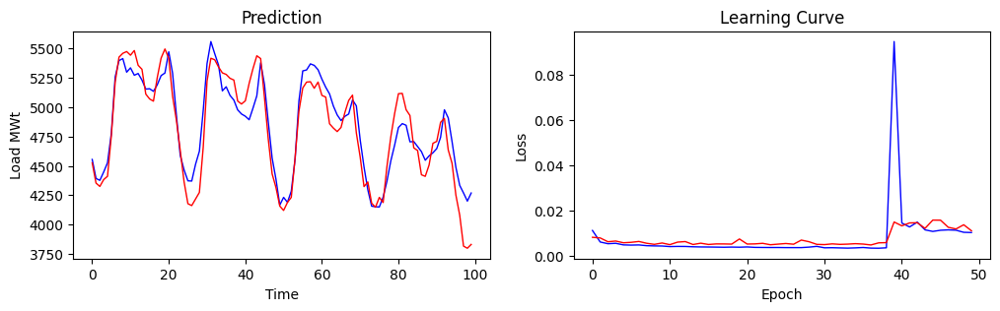



[[4525.708984375], [4353.4287109375], [4325.0537109375], [4383.26220703125], [4411.5400390625], [4757.90869140625], [5214.09765625], [5425.95751953125], [5458.984375], [5473.77978515625], [5442.8701171875], [5482.7138671875], [5357.009765625], [5322.724609375], [5111.36669921875], [5070.14990234375], [5051.3212890625], [5253.22216796875], [5418.017578125], [5495.67919921875], [5416.50244140625], [5094.115234375], [4887.388671875], [4630.14208984375], [4364.34814453125], [4177.88671875], [4161.8671875], [4218.11181640625], [4274.0810546875], [4658.9541015625], [5222.09375], [5416.7705078125], [5404.04541015625], [5342.44677734375], [5292.341796875], [5279.06201171875], [5246.02001953125], [5231.44384765625], [5052.201171875], [5027.00830078125], [5054.2333984375], [5203.1884765625], [5328.60546875], [5437.96435546875], [5414.07275390625], [5082.59423828125], [4725.80712890625], [4431.93017578125], [4315.85986328125], [4157.5712890625], [4120.57421875], [4188.30126953125], [4232.091796

In [ ]:
# 5. CNN-GRU

inputs = layers.Input(shape=(LOOKBACK,1))
x = layers.Conv1D(12, kernel_size=13, padding="valid")(inputs)
x = layers.ReLU()(x)
x = layers.MaxPool1D(5)(x)
x = layers.GRU(150, return_sequences=False)(x)
outputs = layers.Dense(24)(x)

model = Model(inputs=inputs, outputs=outputs, name="CNNGRU")
model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mse'])

start_time = time.time()
history = model.fit(Xs, Ys, epochs=50, validation_split=0.2,batch_size=32,verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Ys_pred = model.predict(Xts)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = model.predict(Xts[:1])
elapsed_time = time.time() - start_time
print(f"\nSingle Day Inference Time {elapsed_time*1000} ms")

Y_pred = scaler_load.inverse_transform(Ys_pred.reshape(-1,1))
evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")

h : (None, 100), c : (None, 100)
x : (None, None, 100)
d_outputs  : (None, None, 1)
hi : (None, 100), ci : (None, 100)
x : (None, None, 100), h : (None, 100), c : (None, 100)
d_outputs  : (None, None, 1)
Training Time : 00:02:26

Total Inference Time : 00:06:34

Single Day Inference Time 4417.186260223389 ms

Evaluation metric results:-

MAPE is : 4.996203631162643
R2 is : 0.8386720273158487


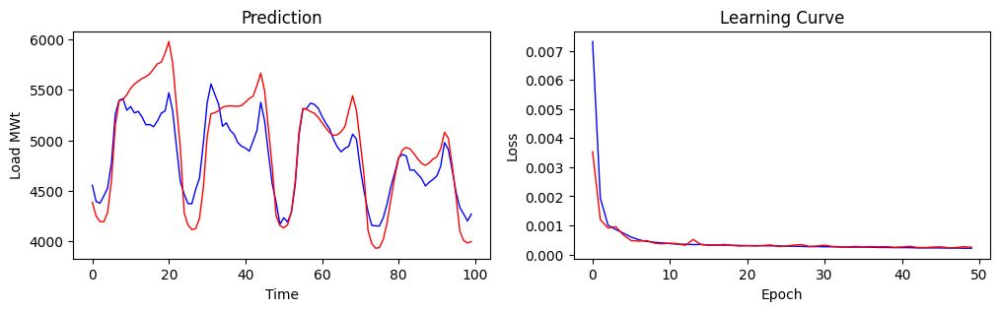



[[4384.072265625, 4248.57861328125, 4194.2587890625, 4191.7548828125, 4287.068359375, 4601.6279296875, 5148.33984375, 5390.37744140625, 5406.43310546875, 5450.93798828125, 5516.623046875, 5557.369140625, 5587.88330078125, 5613.23486328125, 5632.27294921875, 5658.92578125, 5709.318359375, 5757.6923828125, 5775.02099609375, 5863.69775390625, 5979.7568359375, 5763.5244140625, 5338.7470703125, 4921.568359375], [4280.71044921875, 4159.1044921875, 4115.49365234375, 4124.01416015625, 4227.921875, 4531.62744140625, 5036.57666015625, 5264.37548828125, 5273.97265625, 5293.673828125, 5328.13623046875, 5339.4345703125, 5341.0078125, 5339.60009765625, 5337.00341796875, 5345.83935546875, 5378.56591796875, 5414.9248046875, 5438.96142578125, 5543.68310546875, 5667.95263671875, 5491.46728515625, 5116.880859375, 4736.84521484375], [4251.916015625, 4155.01611328125, 4131.890625, 4162.015625, 4289.4814453125, 4595.64697265625, 5082.4306640625, 5316.57080078125, 5308.0205078125, 5285.08349609375, 5268.65

In [ ]:
# 6. ED-LSTM

n_units = 100

e_inputs = Input(shape=(None, 1))
d_inputs = Input(shape=(None, 1))

e_lstm = LSTM(n_units, return_state=True)
d_lstm = LSTM(n_units, return_sequences=True, return_state=True)
d_dense = Dense(1, activation='linear')

_, h, c = e_lstm(e_inputs)
e_states = [h, c]
print(f"h : {h.shape}, c : {c.shape}")
x, _, _ = d_lstm(d_inputs, initial_state=e_states)
print(f"x : {x.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")
model = Model([e_inputs, d_inputs], d_outputs)
model.compile(optimizer='adam', loss='mse')
# model.summary()

# for inference
e_model = Model(e_inputs, e_states)
# for initial decoder_state_inputs
hi = Input(shape=(n_units,))
ci = Input(shape=(n_units,))
d_states_i = [hi, ci]
print(f"hi : {hi.shape}, ci : {ci.shape}")
x, h, c = d_lstm(d_inputs, initial_state=d_states_i)
d_states = [h, c]
print(f"x : {x.shape}, h : {h.shape}, c : {c.shape}")
d_outputs = d_dense(x)
print(f"d_outputs  : {d_outputs.shape}")

d_model = Model([d_inputs] + d_states_i, [d_outputs] + d_states)

def forecast(input_seq, encoder, decoder):
    state = encoder.predict(input_seq, verbose=0)
    # Generate empty target sequence of length 101 ie [[[0,0,0,0,.....,0]]].
    target_seq = np.zeros((1, 1, 1))
    output = []
    for t in range(24):
        yhat, h, c = decoder.predict([target_seq] + state, verbose=0)
        output.append(yhat[0,0,:]) # yhat : [[[a,b,c,d,...]]] -> yhat[0,0,:] : [a,b,c,d,...]
        state = [h, c]
        target_seq = yhat
    return np.array(output)

start_time = time.time()
history = model.fit([Xs, Xd], Ys, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
print(f'Training Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
Y_pred = []
for x in Xts:
    x = np.expand_dims(x, axis=0) # Inputs : (168, 1) -> Expand : (1, 168, 1)
    target = forecast(x, e_model, d_model)  # Output (24, 101)
#     target = one_hot_decode(target)
    target = scaler_load.inverse_transform(target.reshape(-1,1))
    target = target.squeeze(1)
    Y_pred.append(target)
Y_pred = np.array(Y_pred)
print(f'\nTotal Inference Time : {time.strftime("%H:%M:%S", time.gmtime(time.time() - start_time))}')

start_time = time.time()
_ = forecast(np.expand_dims(Xts[0],axis=0), e_model, d_model)
print(f"\nSingle Day Inference Time {(time.time() - start_time)*1000} ms")

evaluate(Yt.reshape(-1,1),Y_pred)
pplot(Yt.reshape(-1,1),Y_pred,history)
print("\n")
print(Y_pred.tolist())
print("\n")